## 🧾 Описание датасета IEEE Fraud Detection

Этот датасет был создан в рамках соревнования на Kaggle совместно с компанией **Vesta Corporation**, поставщиком решений для цифровой безопасности.  
**Цель:** спрогнозировать, является ли онлайн-транзакция мошеннической (целевая переменная `isFraud`).

---

## 📁 Структура датасета

### 🔹 Обучающая выборка
- `train_transaction.csv` — данные о транзакциях
- `train_identity.csv` — данные об устройстве, IP, браузере, ОС и пр., используемых во время транзакции

### 🔹 Тестовая выборка
- `test_transaction.csv`
- `test_identity.csv`

Обе таблицы соединяются по колонке `TransactionID`.

---

## 🎯 Целевая переменная
- `isFraud` — бинарный флаг:
  - `1`: транзакция — мошенническая
  - `0`: транзакция — легитимная

---

## 🧩 Признаки

### 📦 Transaction Features

| Признак           | Описание |
|-------------------|----------|
| `TransactionID`   | Уникальный ID транзакции |
| `TransactionDT`   | Временная метка (в секундах от некой базовой точки) |
| `TransactionAMT`  | Сумма транзакции (в долларах США) |
| `ProductCD`       | Код продукта |
| `card1`-`card6`   | Информация о платёжной карте: ID карты, тип, банк, страна и т.д. |
| `addr1`, `addr2`  | Географическая информация (адрес, штат и т.д.) |
| `dist1`, `dist2`  | Расстояние от пользователя до магазина или устройства |
| `P_emaildomain`, `R_emaildomain` | Email-домен покупателя и получателя |
| `C1`–`C14`        | Различные счётчики, связанные с транзакциями (например, кол-во карт, устройств, адресов) |
| `D1`–`D15`        | Временные дельты — количество дней с последней транзакции и т.д. |
| `M1`–`M9`         | Бинарные флаги сопоставления (например, совпадает ли адрес доставки и биллинга) |
| `V1`–`V339`       | Скрытые признаки, созданные системой Vesta (feature engineering) |

---

### 🧠 Identity Features

| Признак           | Описание |
|-------------------|----------|
| `DeviceType`      | Тип устройства (desktop / mobile) |
| `DeviceInfo`      | Информация об устройстве (например, модель или браузер) |
| `id_12`–`id_38`   | Признаки, связанные с IP, прокси, ISP, операционной системой и прочими параметрами пользователя. Их конкретное значение скрыто по соображениям конфиденциальности. |

---

## 🗃 Категориальные признаки

Некоторые из них:

- `ProductCD`
- `card1` – `card6`
- `addr1`, `addr2`
- `P_emaildomain`, `R_emaildomain`
- `M1` – `M9`
- `DeviceType`, `DeviceInfo`
- `id_12` – `id_38`

---

## ⚠ Особенности

- **Сильно несбалансированный датасет:** мошеннические транзакции — лишь малая часть выборки.
- **Псевдовременная метка (`TransactionDT`)** — может использоваться для создания временных признаков.
- **Много пропусков и выбросов** — важно тщательно обрабатывать данные.
- **Скрытые признаки `Vxxx`** — важно использовать отброс шума и методы отбора признаков.

# 0. Реализация вспомогательных функций

In [204]:
# Базовые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Чтобы красиво отображались графики
import warnings
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")
#plt.style.use("seaborn-dark")

In [ ]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.metrics import recall_score


def eval(model, X_val, y_val):
    y_pred = model.predict(X_val)
    # Предсказания вероятностей
    y_pred_proba = model.predict_proba(X_val)[:, 1]


    # Recall
    recall = recall_score(y_val, y_pred)
    print(f"Recall: {recall:.4f}")

    # ROC-AUC
    roc_auc = roc_auc_score(y_val, y_pred_proba)
    print(f'ROC-AUC: {roc_auc:.4f}')

    # PR-AUC
    pr_auc = average_precision_score(y_val, y_pred_proba)
    print(f'PR-AUC: {pr_auc:.4f}')

    # --- ROC-AUC ---
    fpr, tpr, thresholds = roc_curve(y_val, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.4f})', color='blue')
    plt.plot([0, 1], [0, 1], 'k--')  # диагональ
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

    # --- PR-AUC ---
    precision, recall, thresholds = precision_recall_curve(y_val, y_pred_proba)
    pr_auc = average_precision_score(y_val, y_pred_proba)

    plt.figure(figsize=(8,6))
    plt.plot(recall, precision, label=f'PR curve (area = {pr_auc:.4f})', color='green')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc='lower left')
    plt.grid()
    plt.show()

In [205]:

def show_feature_details(df, col, top=10):
    print(f'\nАнализ признака: {col}')
    print(df[col].value_counts(normalize=True).head(top))

    fature_counts = df[col].value_counts(normalize=True) * 100

    # Построение круговой диаграммы
    plt.figure(figsize=(10,10))
    plt.pie(fature_counts, labels=fature_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Распределение по {col}')
    plt.axis('equal')
    plt.show()


    fraud_rate = df.groupby(col)['isFraud'].mean().sort_values(ascending=False)
    plt.figure(figsize=(12,4))
    fraud_rate.head(top).plot(kind='bar')
    plt.title(f'Доля мошенничества по {col}')
    plt.ylabel('Доля мошенничества')
    plt.show()

## 1. Загрузка данных и базовая очистка

In [113]:
# Импортируем библиотеки
import pandas as pd
import numpy as np

# Путь к данным
PATH_TRANSACTION = '../data/ieee-fraud-detection/train_transaction.csv'
PATH_IDENTITY = '../data/ieee-fraud-detection/train_identity.csv'

# Загрузка данных
transaction = pd.read_csv(PATH_TRANSACTION)
identity = pd.read_csv(PATH_IDENTITY)

print(f"Размер train_transaction: {transaction.shape}")
print(f"Размер train_identity: {identity.shape}")

# Объединяем по TransactionID
train = transaction.merge(identity, how='left', on='TransactionID')

print(f"Итоговый размер train: {train.shape}")

# Быстрый осмотр данных
print(train.head())


Размер train_transaction: (590540, 394)
Размер train_identity: (144233, 41)
Итоговый размер train: (590540, 434)
   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987000        0          86400            68.5         W  13926   
1        2987001        0          86401            29.0         W   2755   
2        2987002        0          86469            59.0         W   4663   
3        2987003        0          86499            50.0         W  18132   
4        2987004        0          86506            50.0         H   4497   

   card2  card3       card4  card5  ...                id_31  id_32  \
0    NaN  150.0    discover  142.0  ...                  NaN    NaN   
1  404.0  150.0  mastercard  102.0  ...                  NaN    NaN   
2  490.0  150.0        visa  166.0  ...                  NaN    NaN   
3  567.0  150.0  mastercard  117.0  ...                  NaN    NaN   
4  514.0  150.0  mastercard  102.0  ...  samsung browser 6.2   32.0  

### Базовая очистка данных

In [120]:
# 4. Приведение типов
# Категориальные признаки, которые явно известны
categorical_features = [
    'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
    'addr1', 'addr2', 'P_emaildomain', 'R_emaildomain',
    'DeviceType', 'DeviceInfo'
]

# identity категориальные признаки
identity_categoricals = [col for col in train.columns if col.startswith('id_')]
categorical_features += identity_categoricals

# M-признаки — бинарные (но иногда могут быть NaN)
m_features = [col for col in train.columns if col.startswith('M')]
categorical_features += m_features

# Оставляем только те, что остались в train
categorical_features = [col for col in categorical_features if col in train.columns]

# Каст категориальных в str/categorical
for col in categorical_features:
    train[col] = train[col].astype('category')

🧹 Рекомендуется удалить 232 колонок (>30% пропусков):
id_24    0.991962
id_25    0.991310
id_07    0.991271
id_08    0.991271
id_21    0.991264
           ...   
V1       0.472935
M2       0.459071
M3       0.459071
M1       0.459071
D3       0.445149
Length: 232, dtype: float64

🧹 Рекомендуется удалить 194863 строк (>50% пропусков)


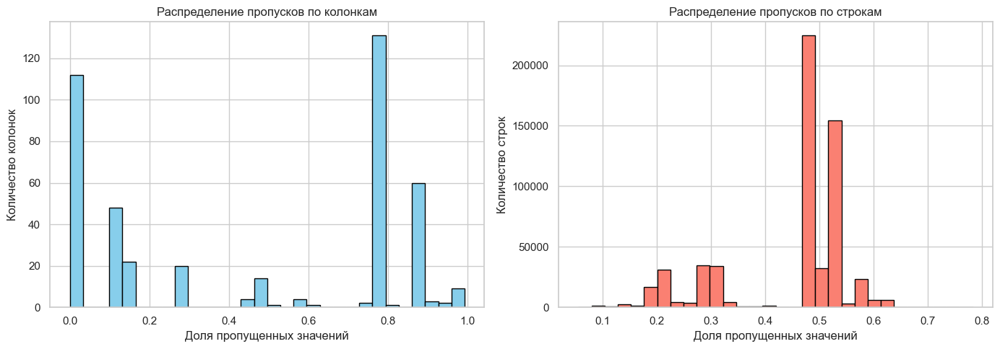

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Доля пропусков по колонкам
missing_col = train.isnull().mean().sort_values(ascending=False)
high_null_cols = missing_col[missing_col > 0.3]  # порог 30%

print(f"🧹 Рекомендуется удалить {len(high_null_cols)} колонок (>{30}% пропусков):")
print(high_null_cols)

# 2. Доля пропусков по строкам
missing_row = train.isnull().mean(axis=1)
high_null_rows = missing_row[missing_row > 0.5]

print(f"\n🧹 Рекомендуется удалить {len(high_null_rows)} строк (>{50}% пропусков)")

# 3. Визуализация
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Гистограмма пропусков по колонкам
ax[0].hist(missing_col, bins=30, color='skyblue', edgecolor='black')
ax[0].set_title('Распределение пропусков по колонкам')
ax[0].set_xlabel('Доля пропущенных значений')
ax[0].set_ylabel('Количество колонок')

# Гистограмма пропусков по строкам
ax[1].hist(missing_row, bins=30, color='salmon', edgecolor='black')
ax[1].set_title('Распределение пропусков по строкам')
ax[1].set_xlabel('Доля пропущенных значений')
ax[1].set_ylabel('Количество строк')

plt.tight_layout()
plt.show()


### ✅ 1. Удаление колонок с большим количеством пропусков

In [122]:
# Порог: удалим все столбцы, где > 30% пропусков
threshold_col = 0.3
missing_ratio_col = train.isnull().mean()

cols_to_drop = missing_ratio_col[missing_ratio_col > threshold_col].index.tolist()
df_cleaned = train.drop(columns=cols_to_drop)

print(f"Удалено {len(cols_to_drop)} колонок:", cols_to_drop)


Удалено 232 колонок: ['dist1', 'dist2', 'R_emaildomain', 'D2', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'D11', 'D12', 'D13', 'D14', 'M1', 'M2', 'M3', 'M4', 'M5', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232

### ✅ 2. Удаление строк с большим количеством пропусков

In [123]:
# Порог: удалим строки, где > 50% значений пропущены
threshold_row = 0.5
missing_ratio_row = train.isnull().mean(axis=1)

rows_to_drop = train[missing_ratio_row > threshold_row].index
df_cleaned = df_cleaned.drop(index=rows_to_drop)

print(f"Удалено {len(rows_to_drop)} строк")


Удалено 194863 строк


In [124]:
df_cleaned.shape

(395677, 202)

🧩 Шаг 1: Разделим признаки по типу

In [128]:
# Числовые и категориальные признаки
num_cols = df_cleaned.select_dtypes(include=['number']).columns
cat_cols = df_cleaned.select_dtypes(include=['object', 'category']).columns

🧩 Шаг 2: Заполним числовые признаки (медианой — устойчиво к выбросам)

In [130]:
for col in num_cols:
    if df_cleaned[col].isnull().any():
        median = df_cleaned[col].median()
        df_cleaned[col].fillna(median, inplace=True)


🧩 Шаг 3: Заполним категориальные признаки (модой или 'Unknown')

In [131]:
for col in cat_cols:
    if df_cleaned[col].isnull().any():
        mode = df_cleaned[col].mode(dropna=True)
        if not mode.empty:
            df_cleaned[col].fillna(mode[0], inplace=True)
        else:
            df_cleaned[col].fillna('Unknown', inplace=True)


🧩 Шаг 4: Проверим, всё ли заполнено

In [132]:
missing_summary = df_cleaned.isnull().sum()
print("Оставшиеся пропуски по столбцам:\n", missing_summary[missing_summary > 0])


Оставшиеся пропуски по столбцам:
 Series([], dtype: int64)


In [133]:
df_cleaned['TransactionDT'].head()

2    86469
4    86506
5    86510
6    86522
8    86535
Name: TransactionDT, dtype: int64

## 2. Обзор признаков - Корреляционная матрица

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns

# Посмотрим распределение целевой переменной
print(df_cleaned['isFraud'].value_counts(normalize=True))

# Выберем только числовые признаки для корреляции
numeric_features = df_cleaned.select_dtypes(include=[np.number])

# Посчитаем корреляцию с целевой переменной
correlation_matrix = numeric_features.corr()

# Корреляция признаков с целевой переменной
cor_target = correlation_matrix['isFraud'].sort_values(ascending=False)
print("Топ признаков, наиболее коррелирующих с isFraud:\n", cor_target.head(15))


isFraud
0    0.95949
1    0.04051
Name: proportion, dtype: float64
Топ признаков, наиболее коррелирующих с isFraud:
 isFraud    1.000000
V45        0.267240
V86        0.261791
V87        0.260982
V44        0.247916
V52        0.220767
V51        0.205931
V40        0.191987
V79        0.188533
V38        0.184350
V39        0.182846
V94        0.178489
V43        0.176951
V33        0.176574
V15        0.174457
Name: isFraud, dtype: float64


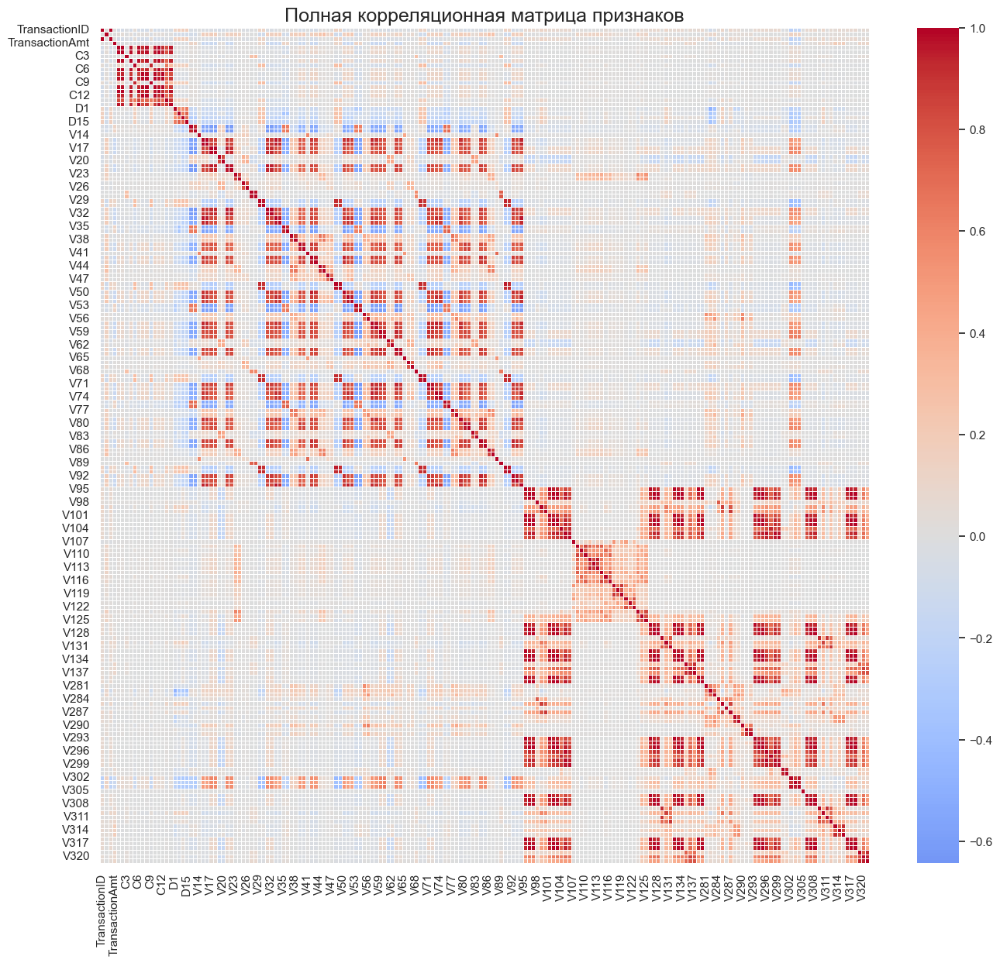

In [135]:
# Тепловая карта всей корреляционной матрицы
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Полная корреляционная матрица признаков', fontsize=18)
plt.show()

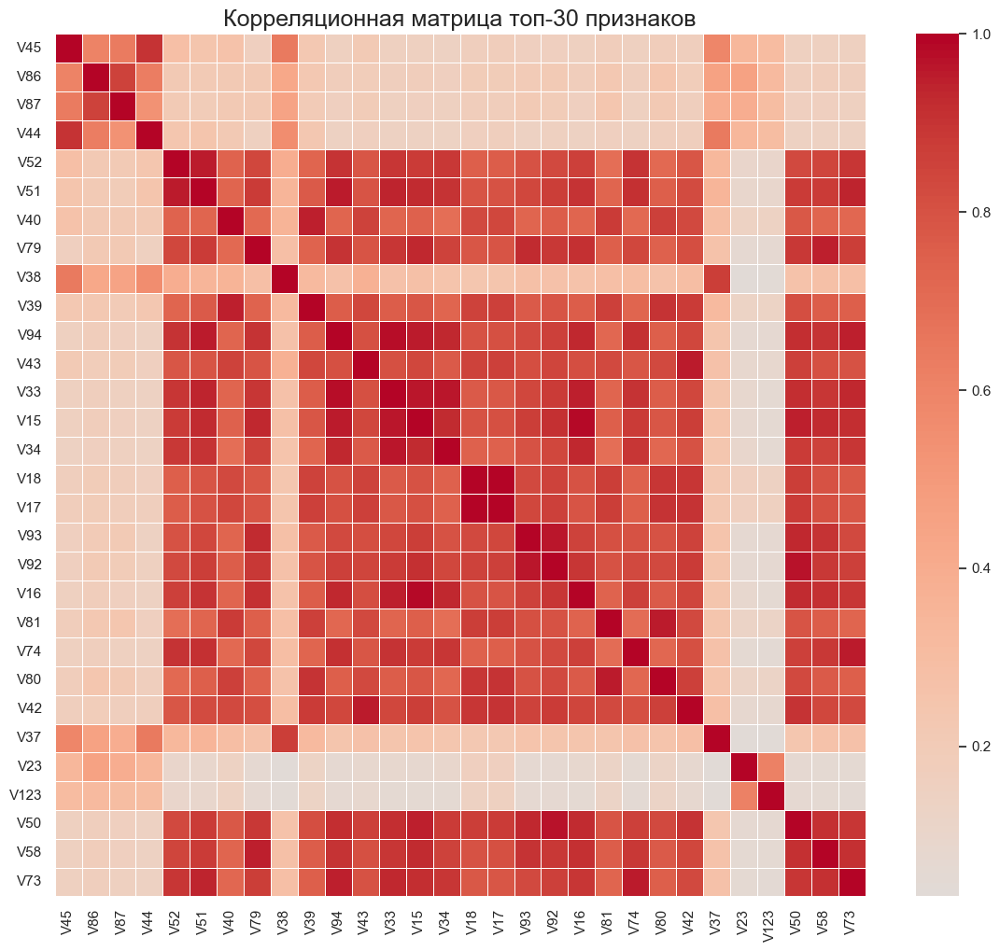

In [ ]:
# тепловая карта только топ-30 признаков
top_features = cor_target.index[1:31]  # исключаем сам isFraud
plt.figure(figsize=(14, 12))
sns.heatmap(train[top_features].corr(), cmap='coolwarm', center=0, annot=False, linewidths=0.5)
plt.title('Корреляционная матрица топ-30 признаков', fontsize=18)
plt.show()

Как мы видимо, сильно коррелируемые признаки трудно интерпретируемы

## Расширенный EDA для антифрод-датасета

### 1. Базовое описание данных

In [ ]:
numeric_features = df_cleaned.select_dtypes(include=['number']).columns
categorical_features = df_cleaned.select_dtypes(include=['object', 'category']).columns

# Размеры датасета
print(f'Размеры датасета: {df_cleaned.shape[0]} строк, {df_cleaned.shape[1]} признаков.')

# Доли классов
print(df_cleaned['isFraud'].value_counts(normalize=True))

# Доля пропусков по признакам
missing_values = df_cleaned.isnull().mean().sort_values(ascending=False)
print(missing_values[missing_values > 0])

# Типы признаков
print('Категориальные признаки:', len(categorical_features))
print('Числовые признаки:', len(numeric_features))


Размеры датасета: 395677 строк, 202 признаков.
isFraud
0    0.95949
1    0.04051
Name: proportion, dtype: float64
Series([], dtype: float64)
Категориальные признаки: 11
Числовые признаки: 191


### 2.Анализ признака TransactionDT

> Важно! Так как `TransactionDT` - Временная метка (в секундах от некой базовой точки), то преобразования в новые признаки условное.

#### Нормализовать временные метки


Так как мы не знаем точной базовой точки, можно нормализовать временные метки, приведя их к более понятному формату. Например, мы можем посчитать, сколько прошло времени от самой первой транзакции и работать с этим диапазоном.

In [143]:
df_modified = df_cleaned.copy()

In [144]:
# Найдем минимальное значение
min_timestamp = df_modified['TransactionDT'].min()

# Преобразуем временные метки относительно минимальной
df_modified['Relative_TransactionDT'] = df_modified['TransactionDT'] - min_timestamp

# Преобразуем в дни, часы, минуты и т.д.
df_modified['Transaction_day'] = df_modified['Relative_TransactionDT'] // (24 * 60 * 60)  # в днях
df_modified['Transaction_hour'] = (df_modified['Relative_TransactionDT'] // 3600) % 24  # в часах
df_modified['Transaction_weekday'] = (df_modified['Relative_TransactionDT'] // (3600*24)) % 7
df_modified['Transaction_day'] = df_modified['Transaction_day'].astype(int)
df_modified['Transaction_hour'] = df_modified['Transaction_hour'].astype(int)
df_modified['Transaction_weekday'] = df_modified['Transaction_weekday'].astype(int)

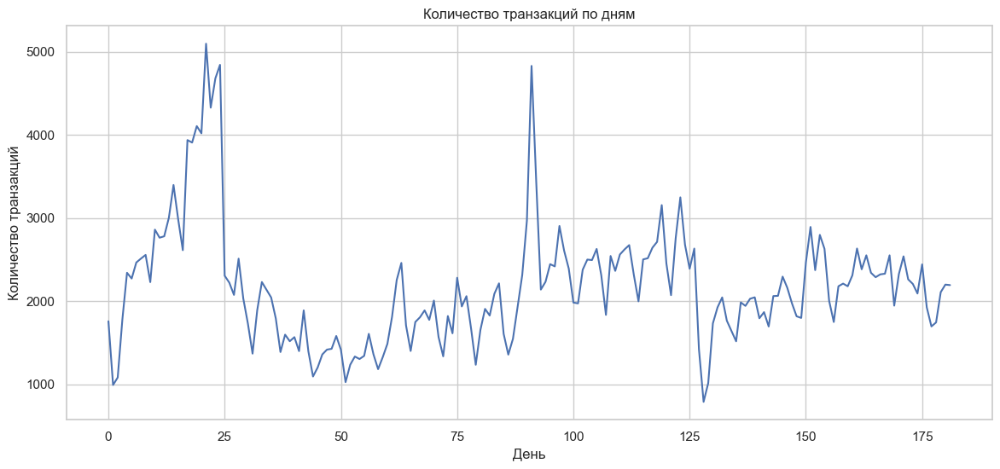

In [145]:
# Количество транзакций во времени
plt.figure(figsize=(14,6))
df_modified.groupby('Transaction_day').size().plot()
plt.title('Количество транзакций по дням')
plt.xlabel('День')
plt.ylabel('Количество транзакций')
plt.show()

#### График: Количество транзакций по дням

1. **Тренды и Пики:**
   - Наблюдаются несколько пиков, особенно в начале периода и ближе к середине.
   - Присутствует высокая изменчивость в количестве транзакций.
 
2. **Сезонность:**
   - Возможные периоды увеличения активности, что может быть связано с внешними факторами, например, акциями или праздниками.
  
3. **Общий Уровень:**
   - Тренд показывает небольшое снижение активности после первой половины, что может указывать на изменения в операционной среде или структуре данных.


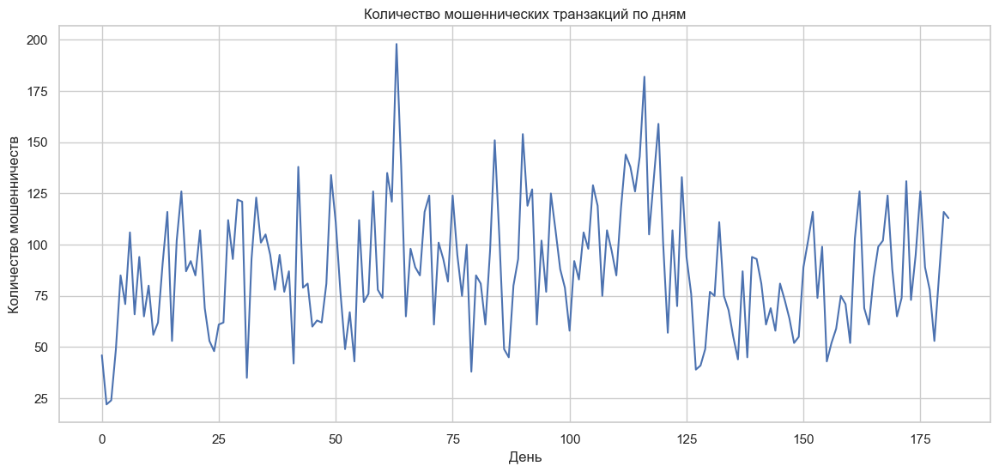

In [146]:
# Количество мошенничеств во времени
plt.figure(figsize=(14,6))
df_modified[df_modified['isFraud'] == 1].groupby('Transaction_day').size().plot()
plt.title('Количество мошеннических транзакций по дням')
plt.xlabel('День')
plt.ylabel('Количество мошенничеств')
plt.show()


#### График: Количество мошеннических транзакций по дням

1. **Тренды и Пики:**
   - Наблюдаются частые колебания в количестве мошеннических транзакций, но, в отличие от общего числа транзакций, их уровень более стабильный.

2. **Сезонность и Корреляция:**
   - Сезонные пики совпадают с общим графиком транзакций, что может указывать на то, что увеличение общего количества транзакций сопутствует и мошеннической активности.

3. **Общий Уровень:**
   - Явная волатильность свидетельствует о непредсказуемости мошеннических действий, хотя в целом показатели имеют тенденцию к снижению в течение времени.


### Общий вывод

- **Сопоставление графиков:** Пики и спады в количестве транзакций и мошеннических операций часто совпадают, указывая на возможную взаимосвязь между общим объемом транзакций и мошеннической активностью.
- **Возможные внешние влияния:** Стоит учитывать влияние сезонных факторов или маркетинговых кампаний, которые могут влиять на активность транзакций.

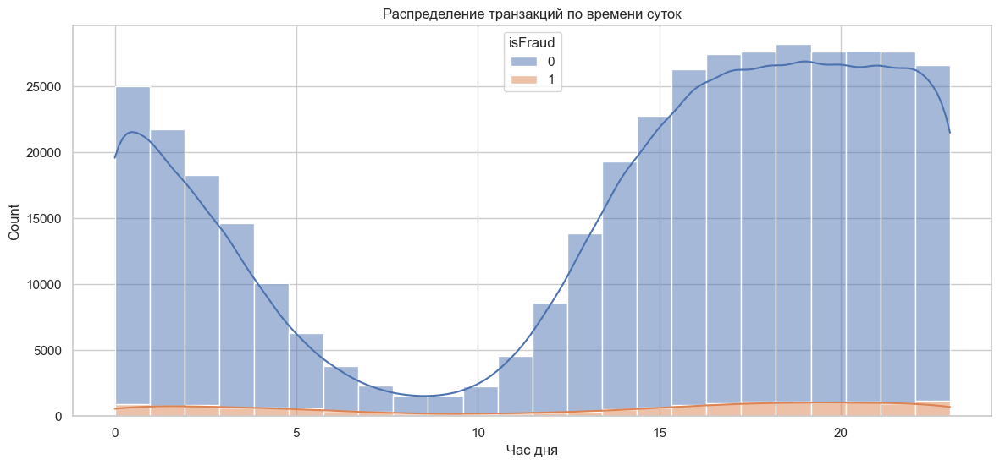

In [147]:
# Время суток
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='Transaction_hour', hue='isFraud', bins=24, kde=True, multiple='stack')
plt.title('Распределение транзакций по времени суток')
plt.xlabel('Час дня')
plt.show()

### Анализ графика распределения транзакций по времени суток

1. **Общая активность:**
   - Наибольшее количество транзакций происходит в вечерние и ночные часы (пик около 16-23 часов).
   - Самое низкое количество транзакций наблюдается около 6-10 часов утра.

2. **Мошеннические транзакции:**
   - Хотя количество мошеннических транзакций значительно ниже общего числа транзакций, их распределение по времени суток похоже на распределение обычных транзакций.
   - Мошеннические активности также снижаются утром и увеличиваются вечером.

3. **Интерпретации:**
   - Активность пользователей и, возможно, мошенническая активность связаны с суточной активностью людей, как в рабочее, так и в нерабочее время.
   - Необходимы дополнительные исследования, чтобы определить, связаны ли пики мошенничества с особыми событиями или условиями.

In [148]:
df_modified[['TransactionDT', 'Relative_TransactionDT','Transaction_day', 'Transaction_hour']]

,TransactionDT,Relative_TransactionDT,Transaction_day,Transaction_hour
2,86469,0,0,0
4,86506,37,0,0
5,86510,41,0,0
6,86522,53,0,0
8,86535,66,0,0
...,...,...,...,...
590534,15811030,15724561,181,23
590536,15811049,15724580,181,23
590537,15811079,15724610,181,23
590538,15811088,15724619,181,23


### 3. Анализ целевой переменной isFraud

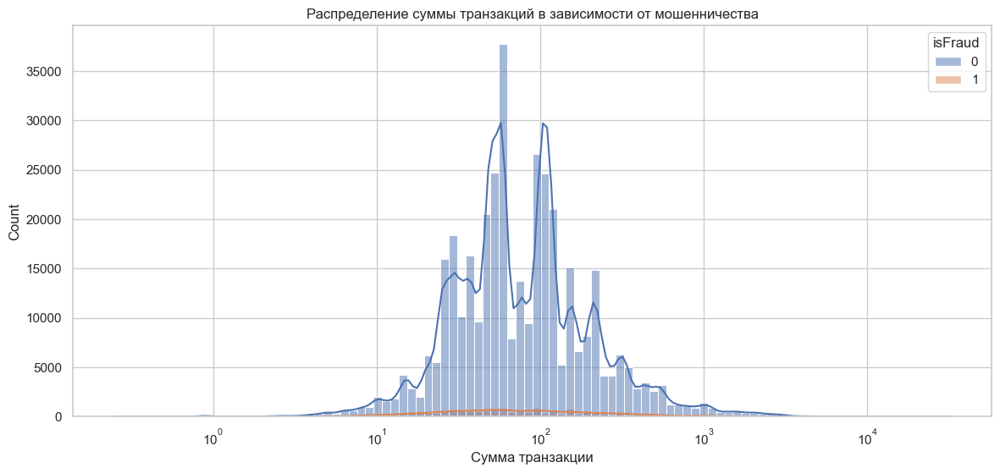

Топ-10 признаков по корреляции с isFraud:
V45    0.267240
V86    0.261791
V87    0.260982
V44    0.247916
V52    0.220767
V51    0.205931
V40    0.191987
V79    0.188533
V38    0.184350
V39    0.182846
Name: isFraud, dtype: float64


In [149]:
# Распределение сумм транзакций
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='TransactionAmt', hue='isFraud', bins=100, log_scale=True, kde=True)
plt.title('Распределение суммы транзакций в зависимости от мошенничества')
plt.xlabel('Сумма транзакции')
plt.show()

# Топ-10 признаков по корреляции с isFraud
fraud_corr = df_modified[numeric_features].corr()['isFraud'].drop('isFraud').abs().sort_values(ascending=False)
print('Топ-10 признаков по корреляции с isFraud:')
print(fraud_corr.head(10))


**Описание графика**

Ось X (логарифмическая шкала) — это сумма транзакции (TransactionAmt). Сразу видно, что большинство транзакций сосредоточены в диапазоне от примерно 10 до 1000 единиц.

Ось Y — это количество транзакций.

Цвета:
- Синие столбцы — обычные транзакции (isFraud = 0).
- Оранжевая линия/заливка (еле видная) — мошеннические транзакции (isFraud = 1).

Что видно:
- Обычных транзакций очень много по сравнению с мошенническими.
- Распределение транзакций сильно скошено вправо (много маленьких сумм, мало больших).
- Мошеннические транзакции встречаются реже и скорее всего имеют свои "специфические" диапазоны сумм, хотя визуально их не видно на фоне всех транзакций.


**Краткий вывод по графику**:

- Большинство транзакций — на небольшие суммы.
- Мошеннические транзакции — редкие и тонут в основном распределении.

### 4. Анализ категориальных признаков

### Анализ признака ProductCD


Анализ признака: ProductCD
ProductCD
W          0.744522
C          0.116028
R          0.063838
H          0.055922
S          0.019690
unknown    0.000000
Name: proportion, dtype: float64


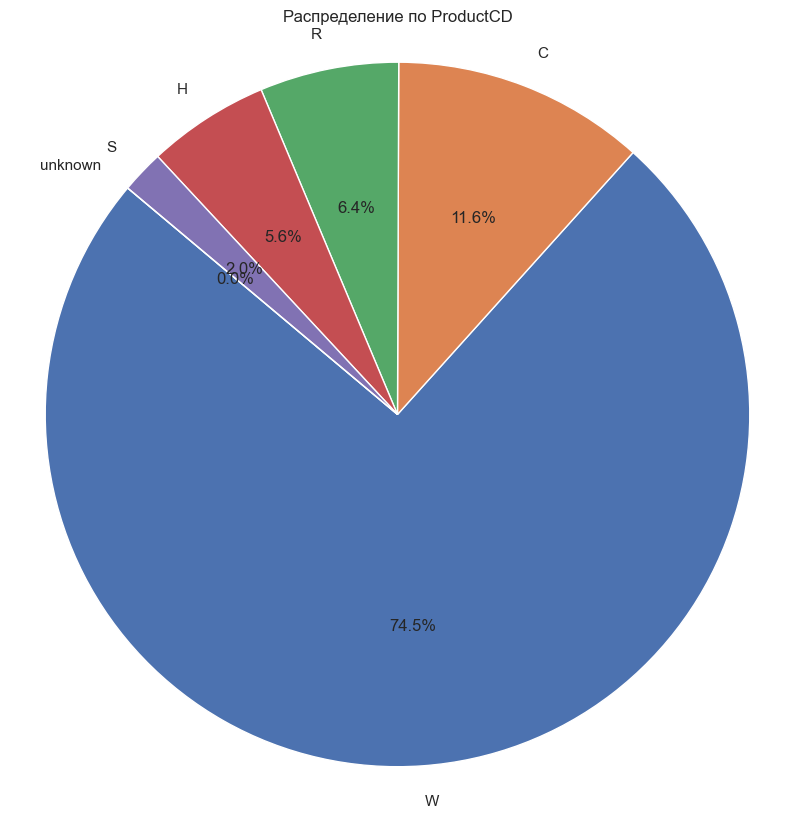

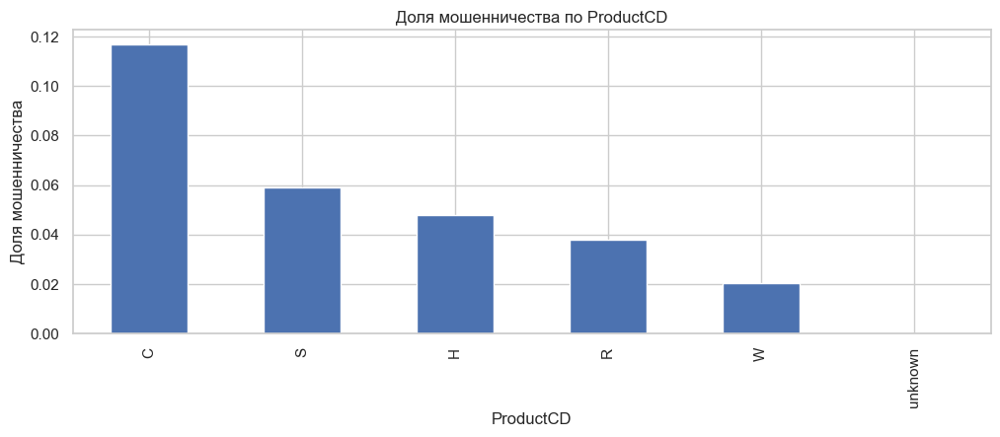

In [168]:
col = 'ProductCD'
show_feature_details(train, col)

#### 1. Распределение транзакций по ProductCD
- Большинство транзакций относятся к типу **W** — **74.45%** всех операций.
- На втором месте — **C** (**11.60%**), затем идут **R** (**6.38%**), **H** (**5.59%**) и **S** (**1.97%**).
- Категория **unknown** отсутствует (0%).

**Вывод**: транзакции крайне неравномерно распределены между различными ProductCD. Большую часть составляют операции типа **W**.

---

#### 2. Доля мошенничества по ProductCD (анализ графика)
На графике показана **доля мошеннических операций** внутри каждой категории:

- **Наивысшая доля мошенничества** наблюдается у ProductCD **C** (~12%).
- Далее идут **S**, **H** и **R** — их доли мошенничества постепенно уменьшаются.
- У **W**, несмотря на огромное количество транзакций, **доля мошенничества минимальна** (~2%).
- Для **unknown** доля мошенничества равна нулю.

**Вывод**:
- Типы продуктов **C**, **S**, **H** и **R** более подвержены мошенничеству, чем **W**.
- Особенно стоит обратить внимание на **C** — хотя он встречается реже, риск мошенничества в нём высокий.
- **W** — массовый продукт с наименьшим риском мошенничества.

---

#### 3. Итого:
- При построении модели для предсказания мошенничества можно учитывать категорию **ProductCD** как важный признак.
- Категории с высокой долей мошенничества (**C**, **S**) могут иметь повышенный вес или более строгую проверку.
- Категории с низкой долей мошенничества (**W**) могут снижать вероятность классификации транзакции как мошеннической.

### Анализ признака  card1

In [209]:
train['card1'].unique()

[13926, 2755, 4663, 18132, 4497, ..., 7236, 17972, 13166, 8767, 18038]
Length: 13553
Categories (13554, object): [1000, 1001, 1004, 1005, ..., 18393, 18395, 18396, 'unknown']


Анализ признака: card1
card1
7919     0.025285
9500     0.023981
15885    0.017545
17188    0.017516
15066    0.013454
12695    0.012008
12544    0.011469
6019     0.011466
2803     0.010399
7585     0.009032
Name: proportion, dtype: float64


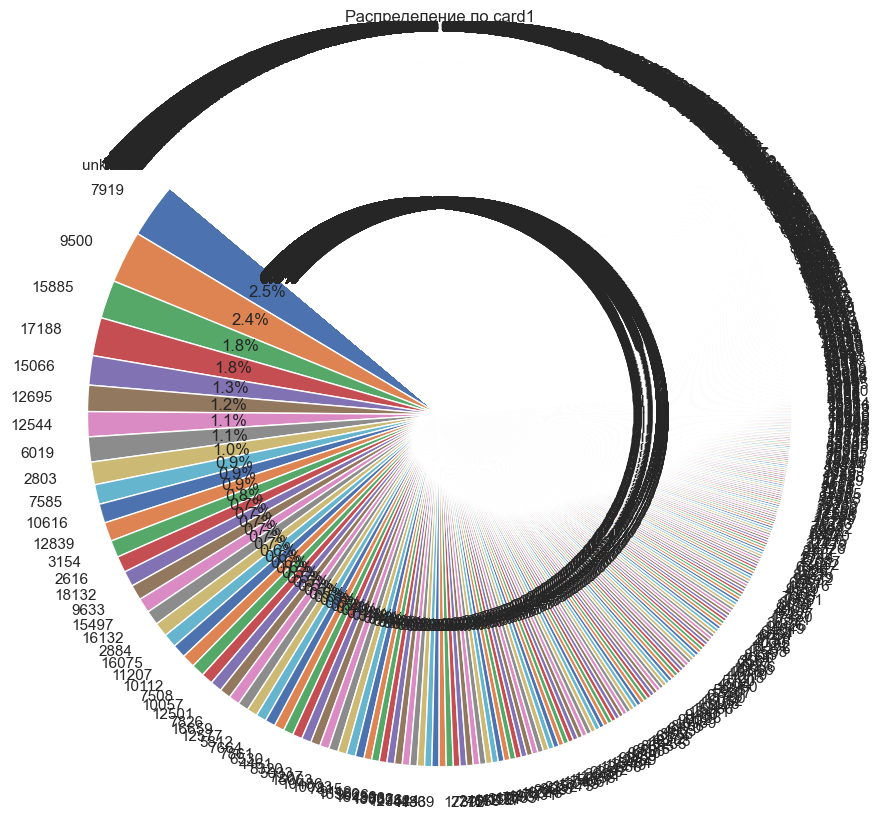

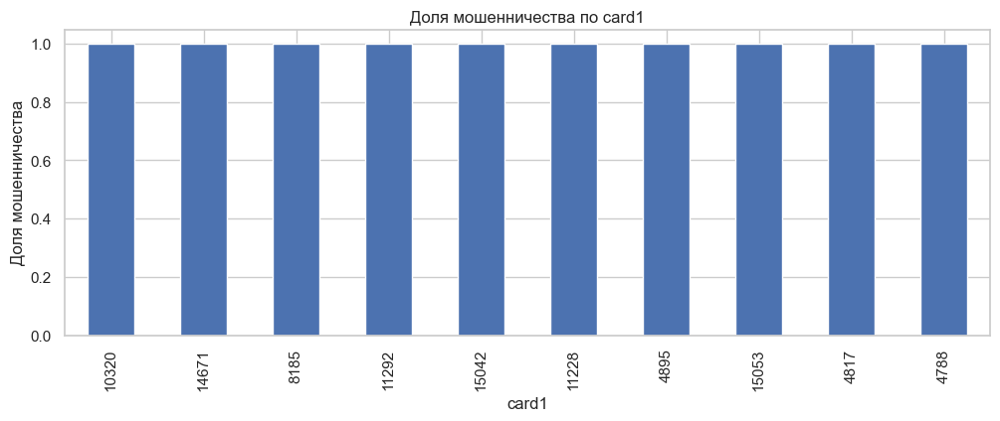

In [211]:
col = 'card1'
show_feature_details(train, col)

### Анализ графика "Доля мошенничества по card1"

1. **Равномерная доля мошенничества:**
   - График показывает, что доля мошеннических транзакций для каждой из представленных карт примерно одинакова. Это указывает на отсутствие явных аномалий или специфичных карт с высоким уровнем риска.

2. **Визуальное различие:**
   - Незначительные различия между картами указывают на то, что по этому признаку не удастся точно выделить мошеннические действия.

3. **Интерпретация данных:**
   - Это может свидетельствовать о том, что `card1` как отдельный признак не является сильным индикатором мошенничества. Необходимо комбинировать его с другими признаками для повышения эффективности модели.

4. **Нет доминирующих аномалий:**
   - Отсутствие резкого пика говорит о том, что ни одна из категорий `card1` не выбивается в плане анормально высокого уровня мошенничества.

### Варианты использования признака:

- **Комбинация признаков:** Исследовать сочетания `card1` с другими признаками, чтобы выявить потенциальные скрытые зависимости.
  
- **Feature Engineering:** Создать дополнительные признаки, такие как взаимодействия с другими категориями (`card2`, `addr1`, и т.д.).

- **Сегментация:** Исследовать временные изменения в доле мошенничества, что может выявить неизвестные паттерны.

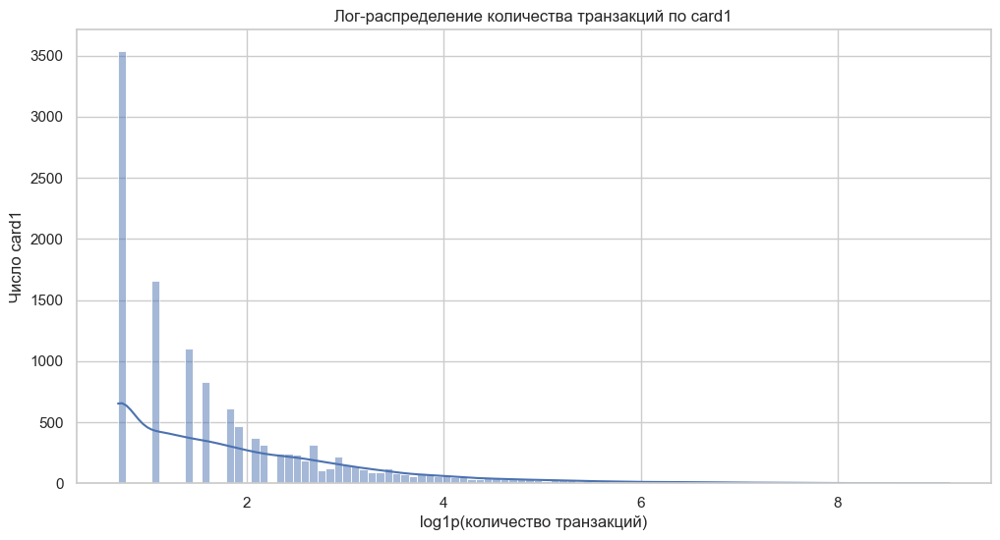

In [212]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Считаем количество транзакций по каждому card1
card1_counts = df_modified['card1'].value_counts()

# Чтобы избежать проблем с "unknown" (где 0 транзакций)
card1_counts = card1_counts[card1_counts > 0]

# Логарифмируем количество транзакций для более наглядного графика
plt.figure(figsize=(12, 6))
sns.histplot(np.log1p(card1_counts), bins=100, kde=True)
plt.title('Лог-распределение количества транзакций по card1')
plt.xlabel('log1p(количество транзакций)')
plt.ylabel('Число card1')
plt.grid(True)
plt.show()


### Выводы по графику лог-распределения количества транзакций по `card1`

1. **Сильная скошенность влево:**
   - Большинство карт имеет небольшое количество транзакций, что типично для распределений с длинным хвостом.

2. **Длинный хвост:**
   - Небольшое количество карт используется очень активно, что может указывать на определенные поведенческие паттерны или риск мошенничества.

3. **Аномалии в активности:**
   - Карты с чрезмерно высоким числом транзакций могут быть исследованы на предмет аномального или подозрительного поведения.

4. **Требуется дополнительное исследование:**
   - Важно проанализировать временные и контекстуальные аспекты использования этих карт, чтобы лучше понять природу активности и связанный с ней риск.

5. **Разработка признаков:**
   - Возможно создание новых признаков, таких как "частота транзакций", для повышения точности моделей анти-фрода.

### Анализ признака card2


Анализ признака: card2
card2
321.0    0.077108
111.0    0.072559
555.0    0.071187
490.0    0.059751
583.0    0.043791
545.0    0.036264
170.0    0.032744
514.0    0.026729
360.0    0.023405
194.0    0.021993
Name: proportion, dtype: float64


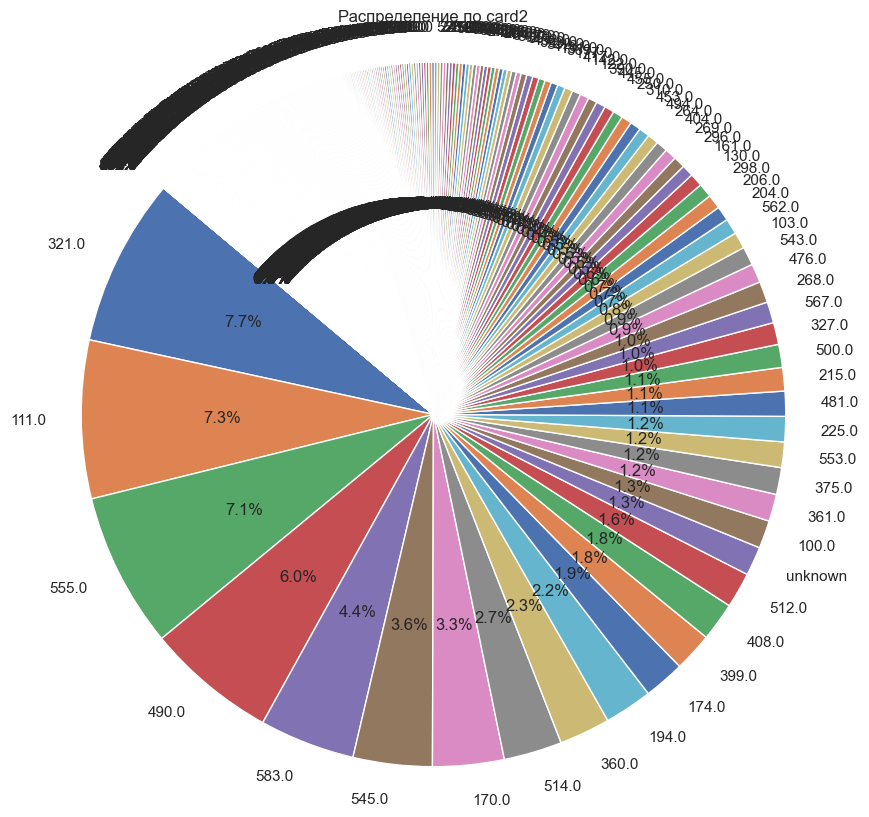

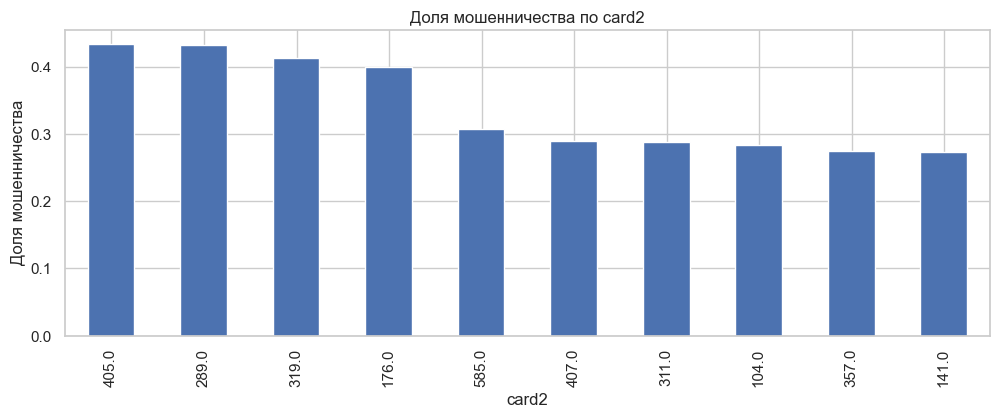

In [ ]:
col = 'card2'
show_feature_details(train, col)

### Анализ графика "Доля мошенничества по card2"

1. **Различия в доле мошенничества:**
   - Карты с кодами `card2`, такими как 289.0 и 405.0, имеют более высокую долю мошенничества по сравнению с другими. Это указывает на возможные рисковые категории.

2. **Вариативность данных:**
   - Наблюдается значительное различие в доле мошенничества между различными значениями `card2`. Это различие может помочь в идентификации карт с высоким риском мошенничества.

3. **Выявление аномалий:**
   - Высокая доля мошенничества для некоторых значений может указывать на возможность целенаправленных атак или повышенного фокуса мошенников на этих картах.

4. **Использование в моделировании:**
   - Значения `card2` с высокой долей мошенничества можно использовать как индикаторы "красного флага" для автоматического мониторинга и фильтрации подозрительных транзакций.

### Варианты использования признака:

  - Провести анализ транзакций по указанным категориям, чтобы понять причину высокого уровня мошенничества.
  - Использовать данную информацию в качестве значимого признака для классификационных моделей, чтобы повысить точность предсказания мошенничества.

### Анализ признака card3


Анализ признака: card3
card3
150.0      0.848252
185.0      0.123533
106.0      0.003738
144.0      0.002957
146.0      0.002919
unknown    0.002482
117.0      0.002216
119.0      0.001777
143.0      0.001241
102.0      0.001064
Name: proportion, dtype: float64


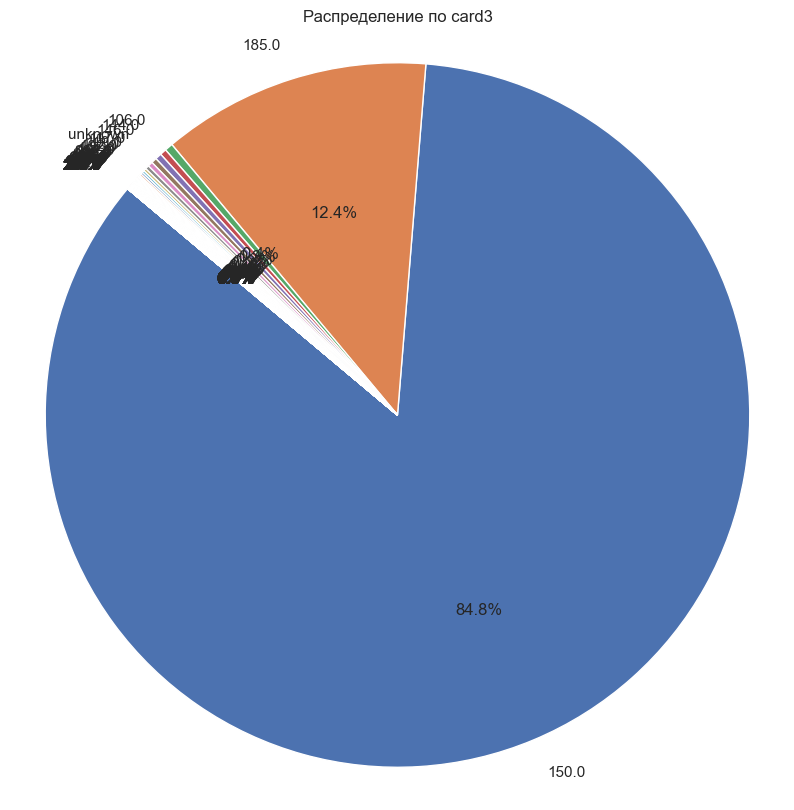

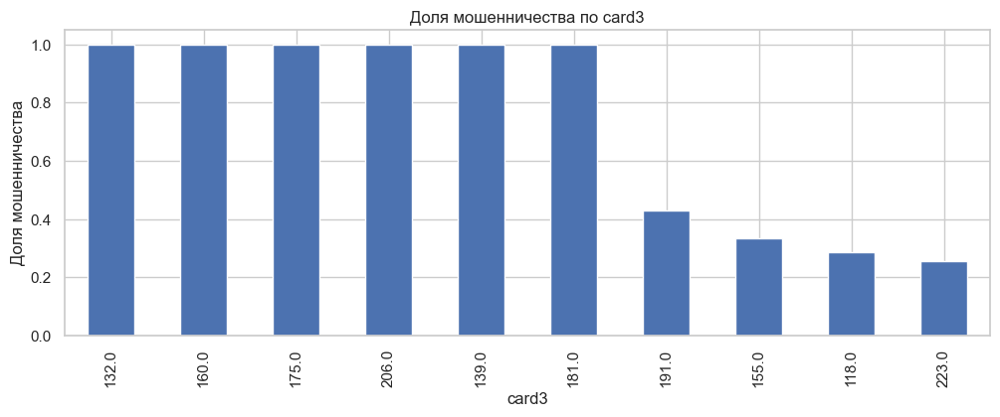

In [ ]:
col = 'card3'
show_feature_details(train, col)

### Анализ графика признака `card3`

1. **Высокая доля мошенничества:**
   - На графике видно, что несколько значений `card3` (такие как 132.0, 160.0, 175.0 и другие) имеют значительные доли мошенничества, близкие к 1. Это делает их важными для анализа риска.

2. **Потенциальные аномалии:**
   - Значения с высокой долей мошенничества могут указывать на либо целенаправленные атаки, либо на фальшивые карты. Стоит провести более детальное исследование таких транзакций.

3. **Сравнение с распространенностью:**
   - Несмотря на то что 150.0 занимает подавляющую часть транзакций (88%), в данном графике анализируются значения, возможно, реже встречающиеся, но более подозрительные.

4. **Важно для включения в модель:**
   - Эти данные могут быть полезны для моделирования мошенничества; важно убедиться, что эти категории включены как важные признаки в алгоритмы машинного обучения.

### Варианты использования признака:

  - Провести исследование транзакций по выявленным значениям с высокой долей мошенничества, чтобы выявить возможные причины.
  - Интегрировать те значения `card3`, которые показывают повышенный уровень риска, для повешения точности моделей прогнозирования мошенничества.


### Анализ признака  card4


Анализ признака: card4
card4
visa                0.647955
mastercard          0.317021
american express    0.020656
discover            0.011861
unknown             0.002507
Name: proportion, dtype: float64


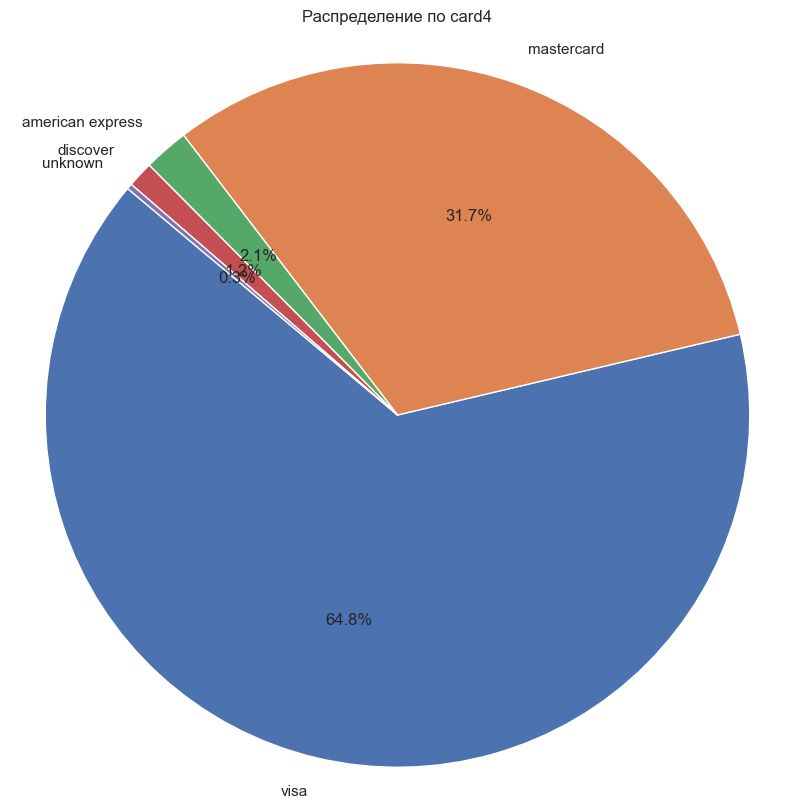

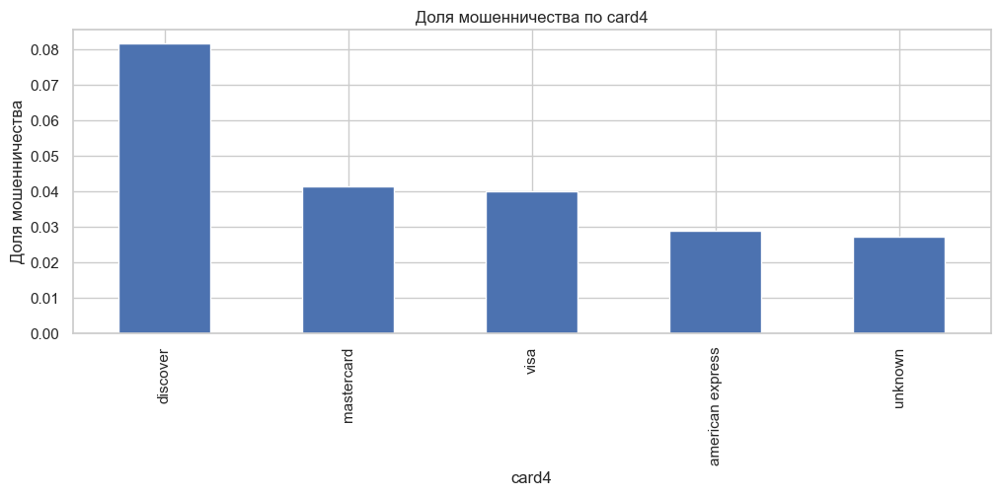

In [ ]:
col = 'card4'
show_feature_details(train, col)

### Анализ графика признака `card4`

1. **Доля мошенничества:**
   - Карты `discover` имеют самую высокую долю мошенничества среди всех категорий. Это может указывать на более высокий риск или целенаправленные атаки, связанные с этим типом карт.

2. **Чаще используемые карты:**
   - Хотя `visa` и `mastercard` занимают наиболее значимую долю транзакций (65% и 32% соответственно), их доля мошенничества ниже, чем у `discover`.

3. **Риск для менее распространенных карт:**
   - `American Express` и `unknown` имеют более низкие доли в данных, но их уровни мошенничества также значимы, что указывает на необходимость внимательного мониторинга.

### Варианты использования признака:

  - Продолжать анализировать транзакции по категориям, а также исследовать возможные причины высоких уровней мошенничества для некоторых типов карт (discovered).
  - Использовать категориальный признак `card4` в предсказательных моделях для повышения точности прогноза мошенничества.

### Анализ признака card5


Анализ признака: card5
card5
226.0    0.486791
224.0    0.140347
166.0    0.085499
102.0    0.051934
138.0    0.043983
117.0    0.040060
195.0    0.031799
137.0    0.024361
219.0    0.019349
126.0    0.017868
Name: proportion, dtype: float64


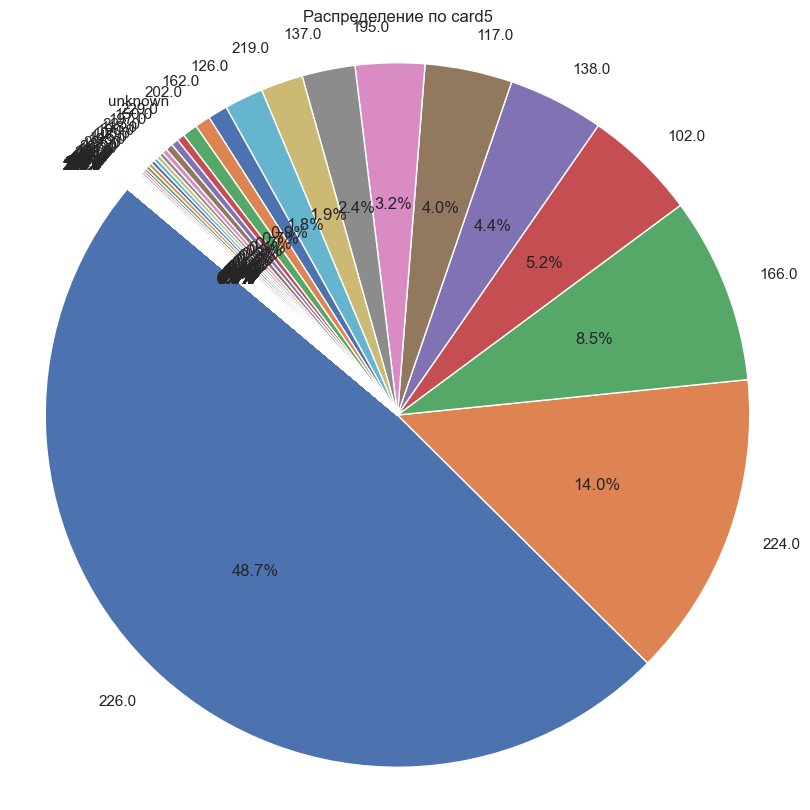

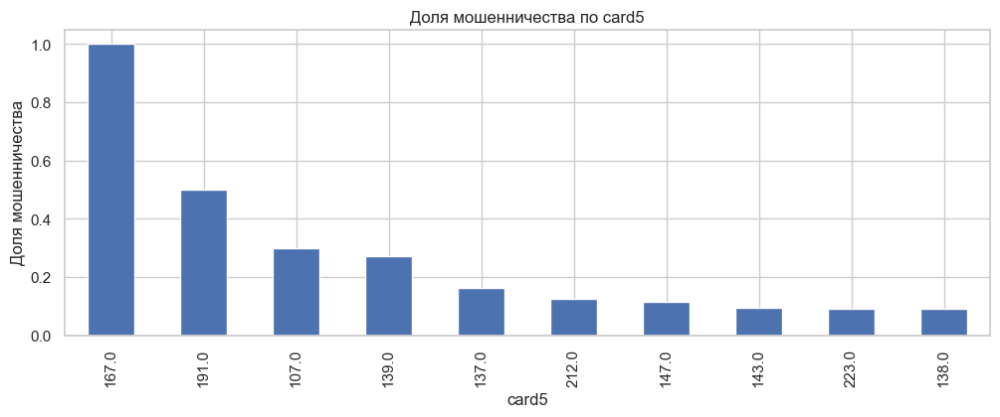

In [ ]:
col = 'card5'
show_feature_details(train, col)

### Анализ графика признака `card5`

1. **Значительное распространение:**
   - Наиболее распространенное значение для `card5` — это `226.0`, составляющее более половины всех записей. Такой перекос может затруднять анализ менее распространенных значений.

2. **Высокий уровень мошенничества:**
   - Значения `167.0` и `191.0` имеют высокую долю мошенничества, близкую к 1 (> 0.5) , что может указывать на значительную уязвимость или дополнительные признаки аномальной активности.

3. **Разнообразие в долях:**
   - График показывает, что доля мошенничества значительно варьируется между разными значениями `card5`, что можно использовать для выделения критичных для анализа категорий.

### Варианты использования признака:

  - Провести детальное исследование транзакций с `card5` значениями 167.0 и 191.0, чтобы определить возможные уязвимости или шаблоны, объясняющие высокий уровень риска.
  - Включить разнообразие долей мошенничества по `card5` в прогнозные модели для повышения их точности при обнаружении потенциальных мошенничеств.

### Анализ признака card6


Анализ признака: card6
card6
debit              0.709258
credit             0.288162
unknown            0.002497
debit or credit    0.000045
charge card        0.000038
Name: proportion, dtype: float64


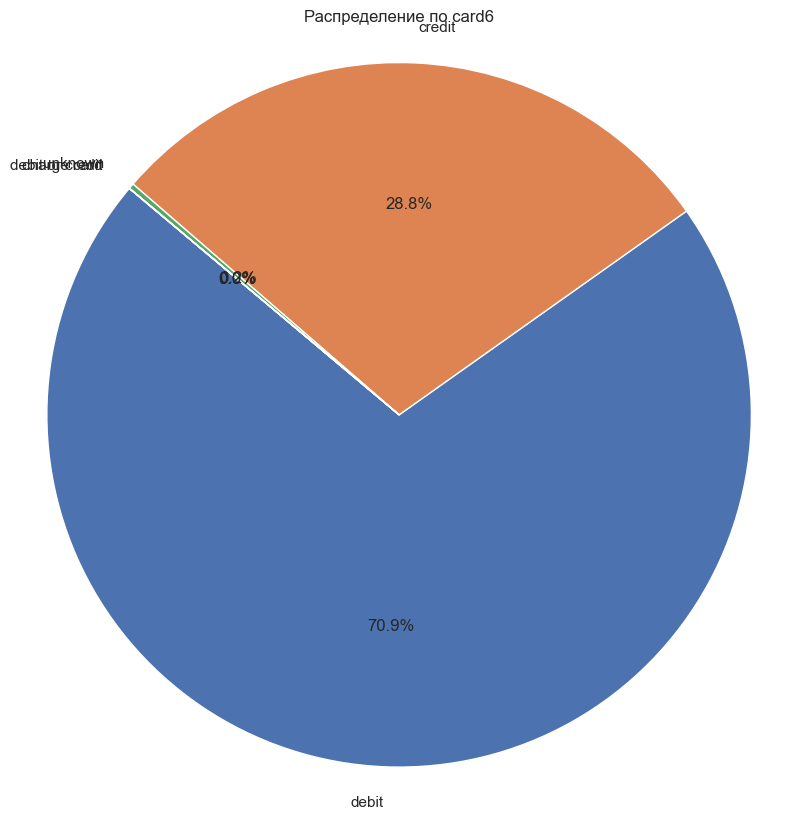

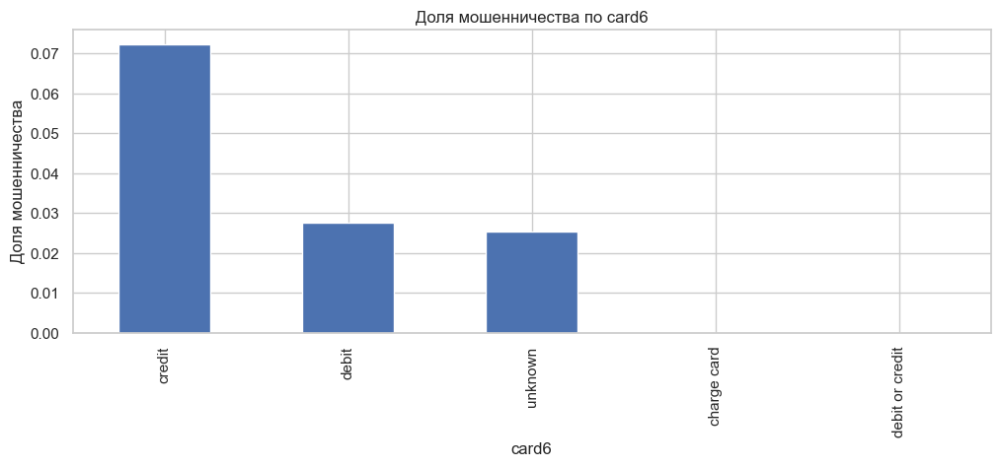

In [ ]:
col = 'card6'
show_feature_details(train, col)

### Анализ графика признака `card6`

1. **Подавляющее использование дебетовых карт:**
   - Основная часть транзакций осуществляется с дебетовыми картами (около 74%), однако доля их мошенничества ниже, чем у кредитных карт.

2. **Высокий риск по кредитным картам:**
   - Кредитные карты имеют более высокую долю мошенничества. Это может быть связано с характером кредитных операций или более высокой ценностью транзакций.

3. **Неопределенные и редкие категории:**
   - Категории `unknown`, `debit or credit` и `charge card` встречаются редко. Хотя они показывают доли мошенничества, их малое количество затрудняет выводы.

### Варианты использования признака:

  - Определить происхождение и характер транзакций в категории `unknown`, чтобы улучшить анализ данных.
  - Провести детальный анализ редких категорий, чтобы понимать их потенциальные риски и принимать решения на основе полученных данных.

### Анализ признака addr1


Анализ признака: addr1
addr1
unknown    0.147279
299.0      0.079631
204.0      0.068422
325.0      0.067815
264.0      0.063332
330.0      0.047124
315.0      0.036651
441.0      0.034687
272.0      0.032577
337.0      0.026208
Name: proportion, dtype: float64


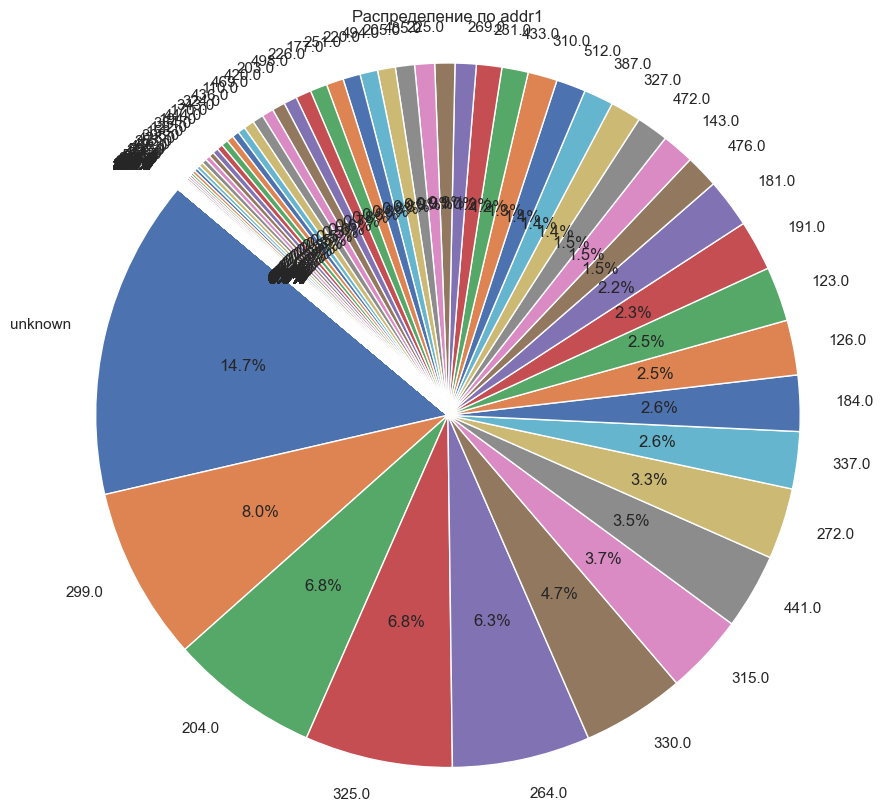

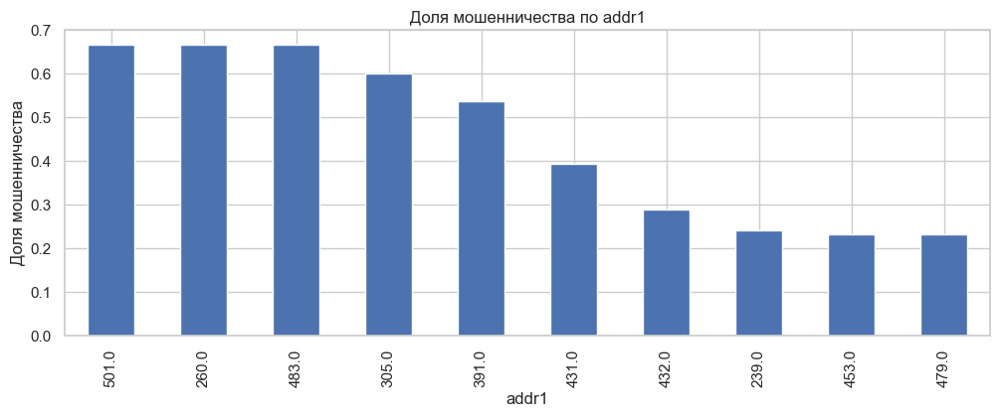

In [ ]:
col = 'addr1'
show_feature_details(train, col)

### Анализ графика признака `addr1`

1. **Высокая доля мошенничества:**
   - Значения, такие как `501.0`, `260.0`, `483.0`, `305.0`, `391.0` и другие, показывают высокую долю мошенничества, что может указывать на целевые уязвимости в этих регионах или адресах.

2. **Широкий разброс:**
   - Видно, что доля мошеннических транзакций значительно варьируется в разных адресных группах, что подчеркивает значимость данного признака для анализа рисков.

3. **Категория `unknown`:**
   - Хотя "unknown" имеет значительную долю в данных, его влияние на уровень мошенничества необходимо дополнительно изучать.

### Варианты использования признака:

  - Провести детальное исследование транзакций для адресов с наибольшими рисками, чтобы выявить потенциальные причины высокой доли мошенничества.
  - Использовать `addr1` как важный признак в моделях машинного обучения для улучшения предсказания мошенничества.
  - Исследовать и, возможно, корректировать записи с адресами "unknown", чтобы избежать искажения данных и повысить точность анализа.

### Анализ признака addr2


Анализ признака: addr2
addr2
87.0       0.845253
unknown    0.147279
60.0       0.004380
96.0       0.001552
32.0       0.000222
65.0       0.000207
16.0       0.000129
31.0       0.000119
19.0       0.000083
26.0       0.000063
Name: proportion, dtype: float64


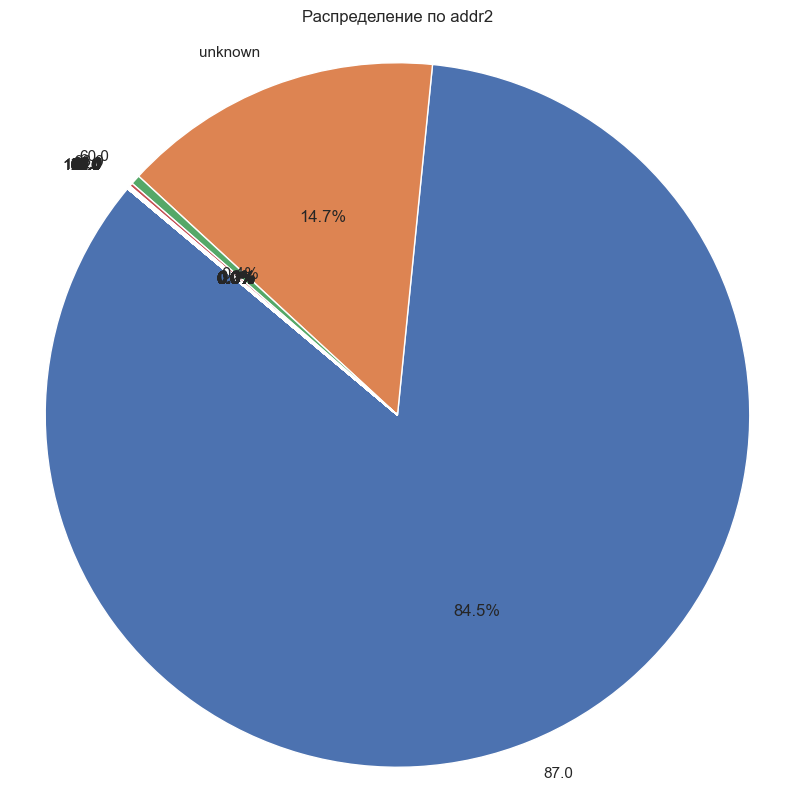

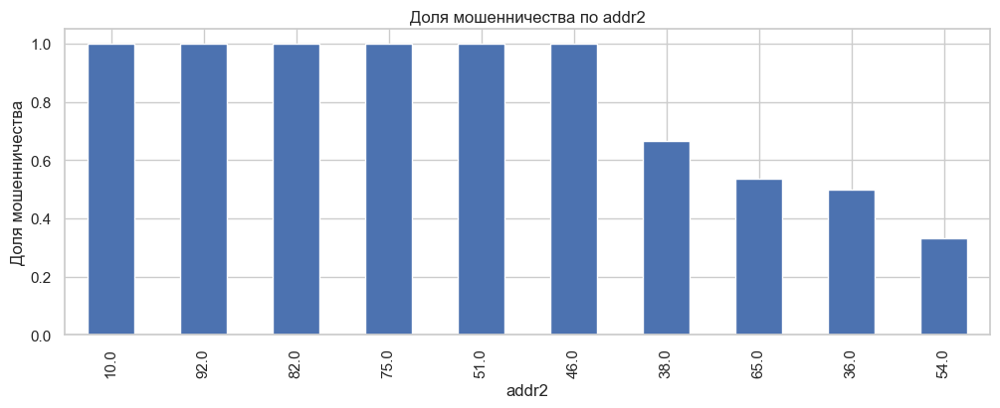

In [ ]:
col = 'addr2'
show_feature_details(train, col)

### Анализ графика признака `addr2`

1. **Доминирование значения 87.0:**
   - Значение `87.0` составляет около 88% всех записей, что указывает на значительную концентрацию в определенном регионе или области. Это может затруднять выявление других паттернов.

2. **Высокая доля мошенничества:**
   - Значения, такие как `10.0`, `92.0` и другие, демонстрируют высокую долю мошеннических транзакций, близкую к 1, что может свидетельствовать о целенаправленных атаках на эти регионы.

### Варианты использования признака:
  - Провести дополнительное исследование транзакций из адресов с самыми высокими уровнями мошенничества, чтобы выявить возможные причины.
  - Поскольку `87.0` занимает значительную долю, оценить, почему именно это значение столь распространено и как оно влияет на общие паттерны данных.
  - Включить явный дисбаланс в `addr2` при построении моделей для понимания рисков и потенциальных угроз.

### Анализ признака P_emaildomain


Анализ признака: P_emaildomain
P_emaildomain
gmail.com        0.440650
yahoo.com        0.188250
hotmail.com      0.092785
anonymous.com    0.077556
aol.com          0.053460
unknown          0.036211
comcast.net      0.015722
icloud.com       0.011926
outlook.com      0.010511
msn.com          0.007910
Name: proportion, dtype: float64


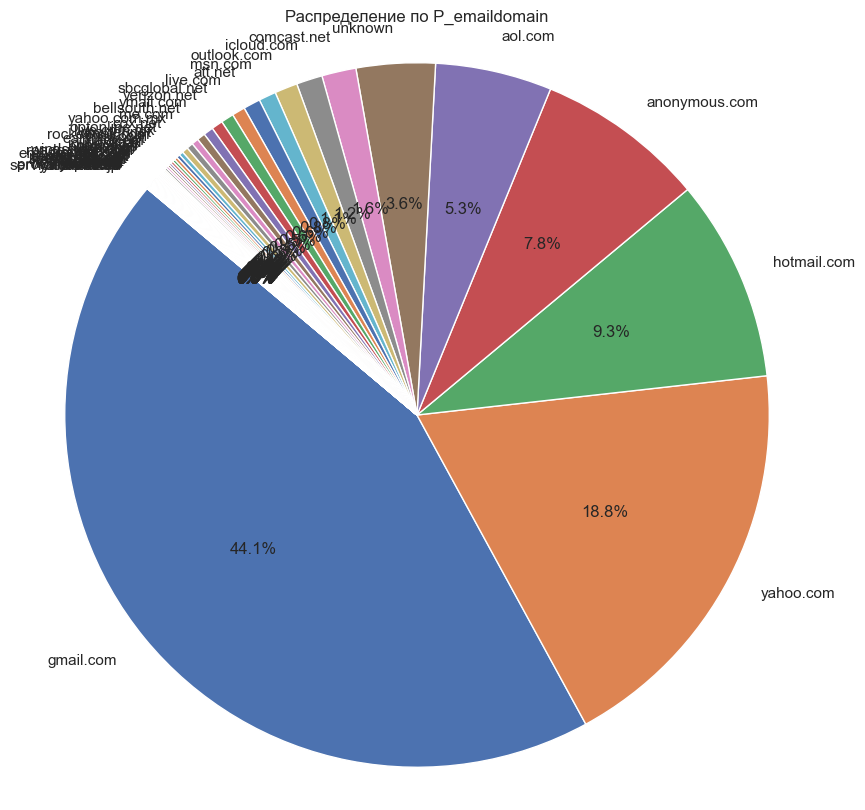

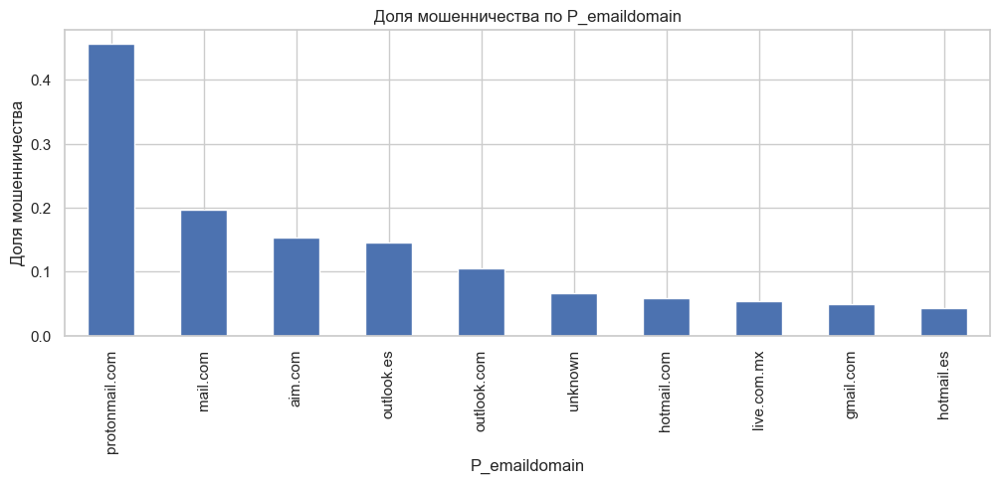

In [ ]:
col = 'P_emaildomain'
show_feature_details(train, col)

### Анализ графика признака `P_emaildomain`

1. **Высокий уровень мошенничества у определённых провайдеров:**
   - `protonmail.com` имеет наивысшую долю мошенничества среди доменов, что может указывать на его популярность среди злоумышленников.

2. **Распространённые домены:**
   - `gmail.com` и `yahoo.com` являются самыми распространёнными доменами, но их доля мошенничества намного ниже, по сравнению с другими доменами.

3. **Роль "unknown":**
   - Категория `unknown` составляет значительную часть данных, и её влияние на общие паттерны неясно, что требует дополнительного изучения.

### Варианты использования признака:

  - Исследовать записи с `unknown` доменами для понимания их природы и потенциальных рисков.

### Анализ признака  R_emaildomain


Анализ признака: R_emaildomain
R_emaildomain
unknown          0.767516
gmail.com        0.096771
hotmail.com      0.046583
anonymous.com    0.034763
yahoo.com        0.020053
aol.com          0.006267
outlook.com      0.004245
comcast.net      0.003068
yahoo.com.mx     0.002554
icloud.com       0.002367
Name: proportion, dtype: float64


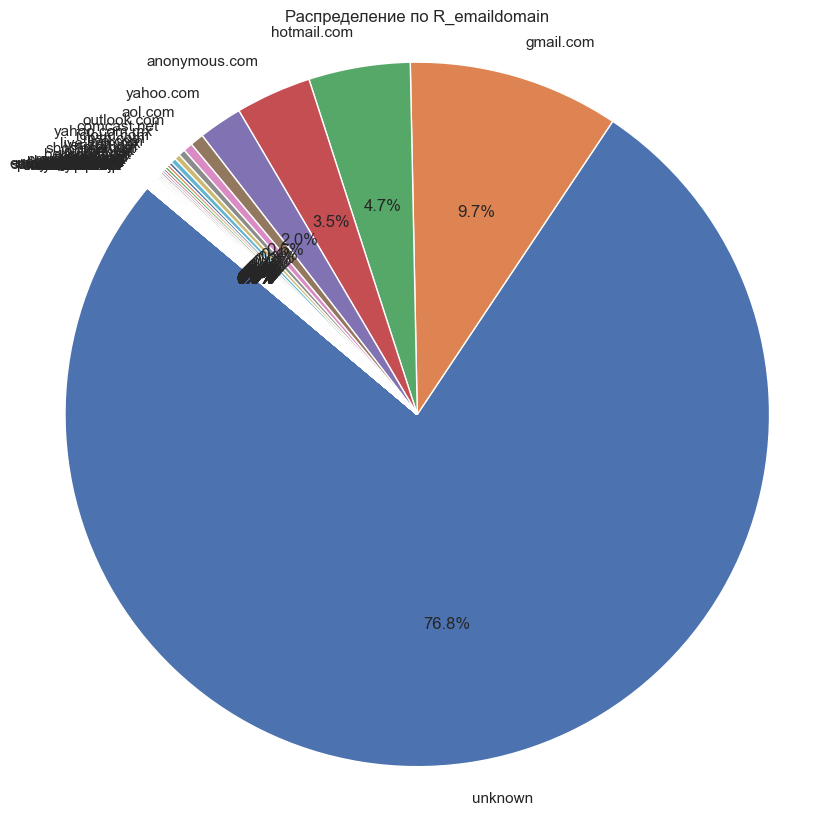

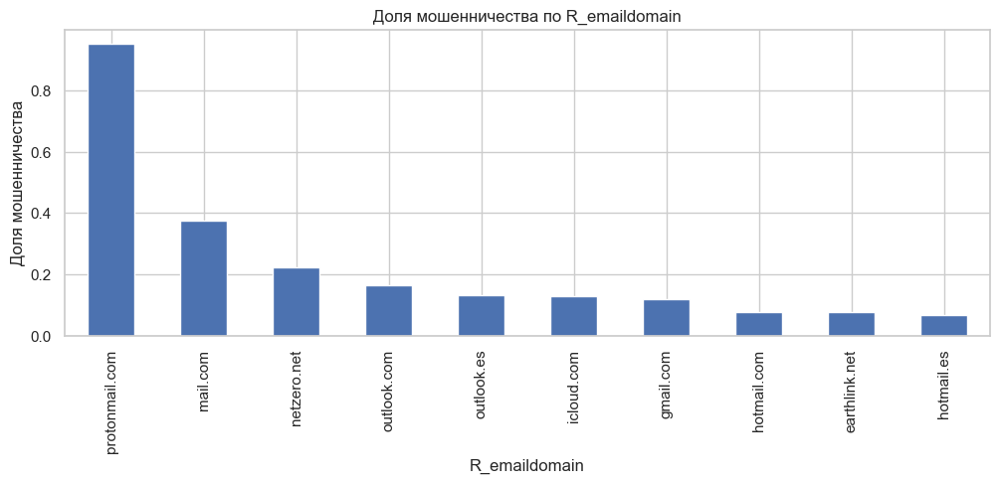

In [165]:
col = 'R_emaildomain'
show_feature_details(train, col)

### Анализ графика признака `R_emaildomain`

1. **Высокая доля "unknown":**
   - Категория `unknown` доминирует (76.7%) среди записей, что указывает на недостаток информации о получателе в большинстве транзакций. Это затрудняет анализ распределения остальных категорий.

2. **Высокая доля мошенничества у `protonmail.com`:**
   - `protonmail.com` имеет наибольшую долю мошенничества, что требует внимания и возможно, повышенного мониторинга таких транзакций.

3. **Низкое распределение по другим категориям:**
   - Очень малая доля пользователей на gmail.com, hotmail.com и других популярных доменах указана как получатели. Это может указывать на особенности данных или стратегию мошенников.

### Варианты использования признака:

  - Углубленный анализ данных без известных доменов может помочь понять логику транзакций и выявить скрытые риски.
  - Изучить транзакции с известными, но менее представленными доменами и понять их роль в общем контексте.

### Анализ признака  DeviceType


Анализ признака: DeviceType
DeviceType
unknown    0.761557
desktop    0.144215
mobile     0.094227
Name: proportion, dtype: float64


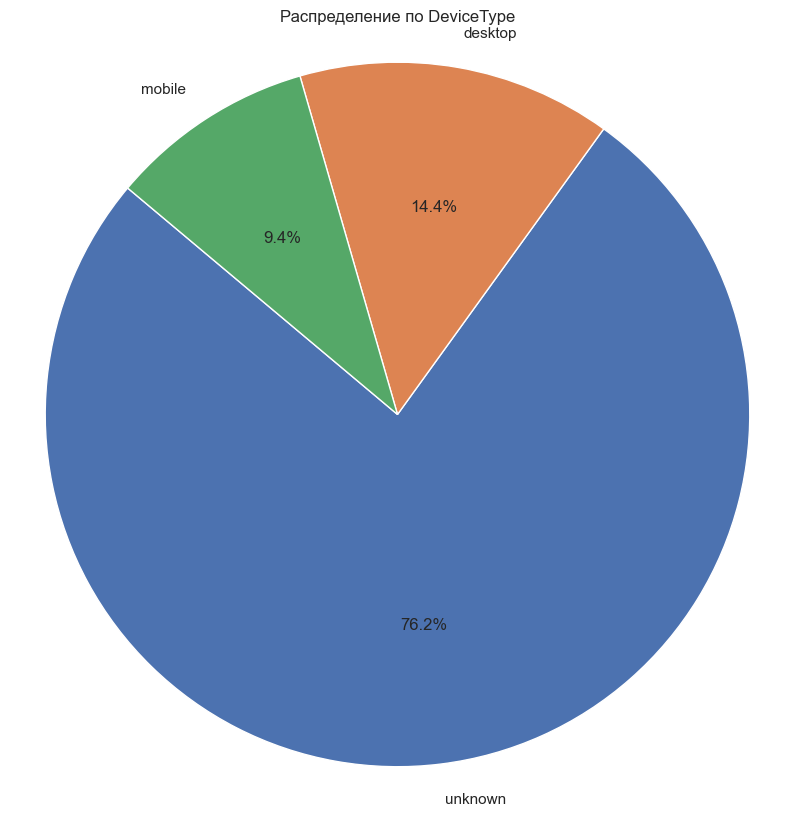

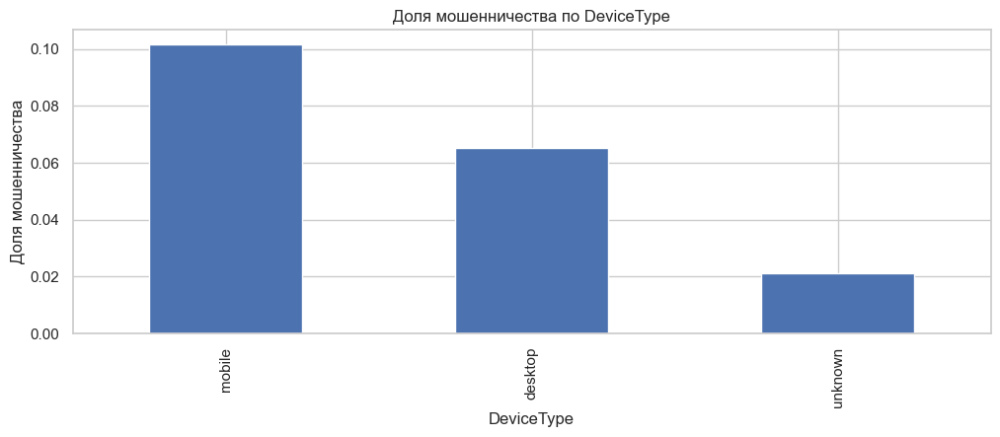

In [166]:
col = 'DeviceType'
show_feature_details(train, col)

### Анализ графика признака `DeviceType`

1. **Преобладание категории "unknown":**
   - Большинство записей (76.2%) не указывают тип устройства, что затрудняет анализ и требует дополнительной интерпретации данных.

2. **Мошенничество на мобильных устройствах:**
   - Мобильные устройства показывают более высокую долю мошенничества по сравнению с другими категориями, что может указывать на уязвимость этих устройств.

3. **Процент использования:**
   - `desktop` и `mobile` составляют меньшую долю, но все еще значимы для анализа пользовательского поведения.

### Анализ признака  DeviceInfo


Анализ признака: DeviceInfo
DeviceInfo
unknown                  0.799055
Windows                  0.080811
iOS Device               0.033498
MacOS                    0.021291
Trident/7.0              0.012599
rv:11.0                  0.003219
rv:57.0                  0.001629
SM-J700M Build/MMB29K    0.000930
SM-G610M Build/MMB29K    0.000781
SM-G531H Build/LMY48B    0.000694
Name: proportion, dtype: float64


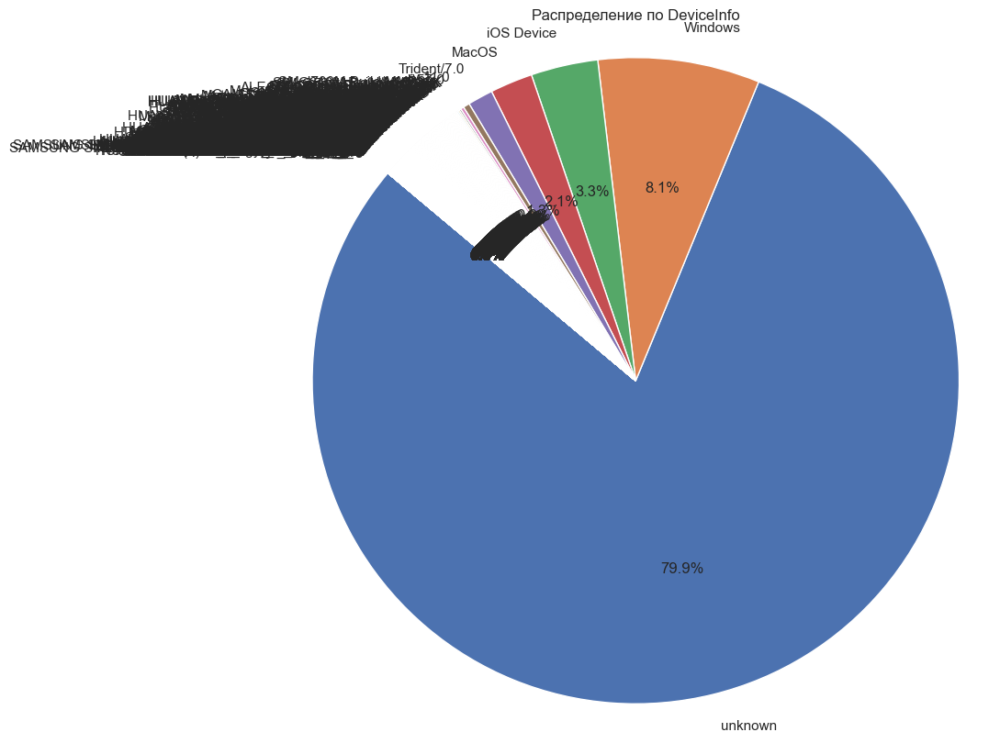

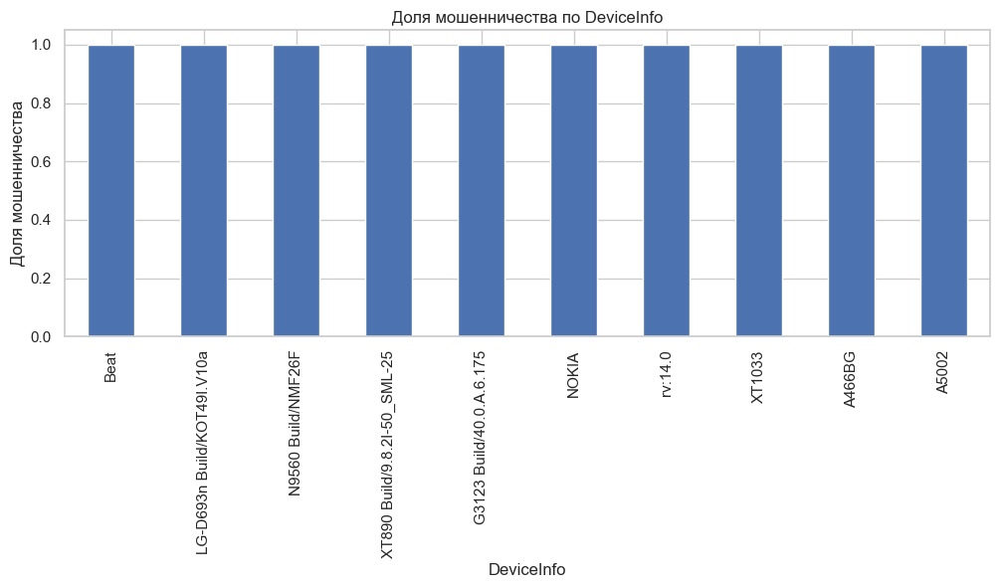

In [167]:
col = 'DeviceInfo'
show_feature_details(train, col)

### Анализ графика признака `DeviceInfo`

1. **Преобладание "unknown":**
   - Подавляющее большинство записей (79.9%) не содержат информации об устройстве, что создаёт значительную неопределённость.

2. **Высокий уровень мошенничества у отдельных устройств:**
   - Устройства, такие как `Beat`, `NOKIA`, и некоторые другие специфические модели, показывают очень высокую долю мошенничества, что требует дополнительного внимания.

3. **Доля популярных устройств:**
   - `Windows`, `iOS Device`, и `MacOS` представлены в меньшей степени, с более низким уровнем мошенничества.

### Варианты использования признака:
  - Провести подробное исследование и мониторинг устройств с высокой долей мошенничества.
  - Уменьшить кол-во типов устройст


Анализ признака: id_01
id_01
 unknown    0.755761
-5.0        0.139144
 0.0        0.033114
-10.0       0.019062
-20.0       0.018984
-15.0       0.009608
-25.0       0.007828
-45.0       0.003629
-35.0       0.002747
-40.0       0.002345
Name: proportion, dtype: float64


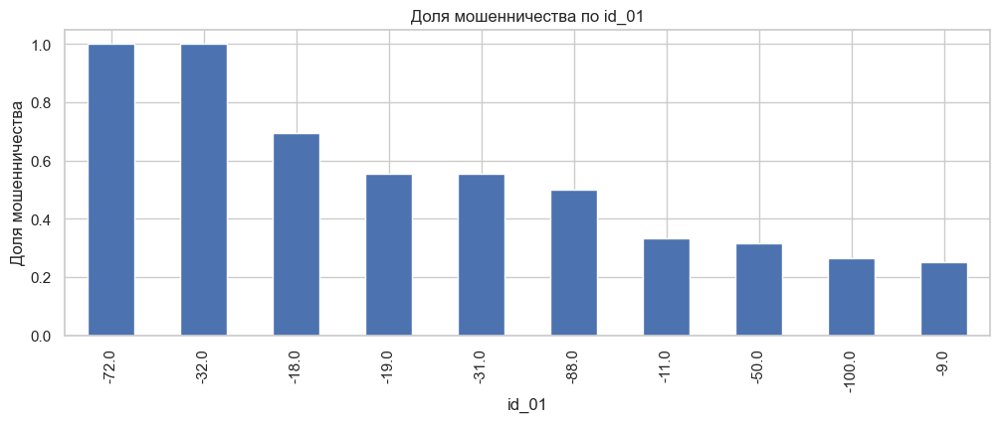


Анализ признака: id_02
id_02
unknown    0.761452
1102.0     0.000019
696.0      0.000017
1141.0     0.000015
1117.0     0.000015
1116.0     0.000015
1083.0     0.000015
1120.0     0.000015
1127.0     0.000014
1110.0     0.000012
Name: proportion, dtype: float64


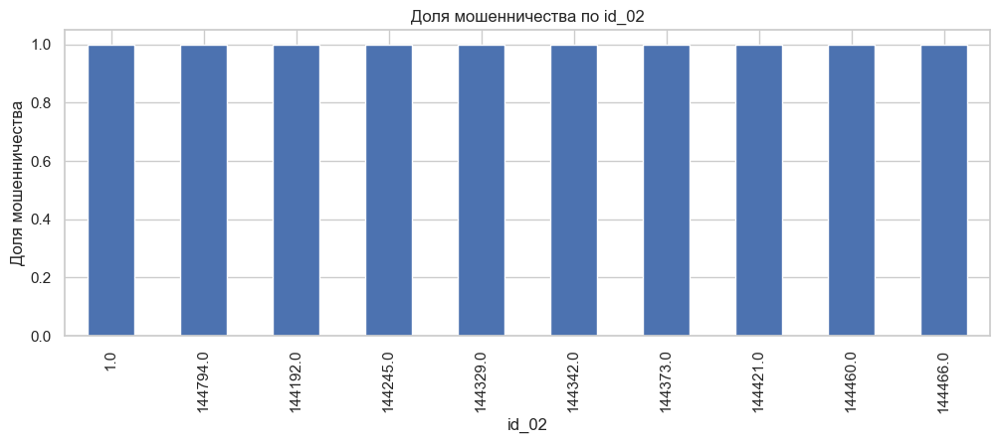


Анализ признака: id_03
id_03
 unknown    0.887689
 0.0        0.108211
 1.0        0.001461
 3.0        0.001131
 2.0        0.000713
 5.0        0.000185
 4.0        0.000169
 6.0        0.000108
-5.0        0.000056
-6.0        0.000052
Name: proportion, dtype: float64


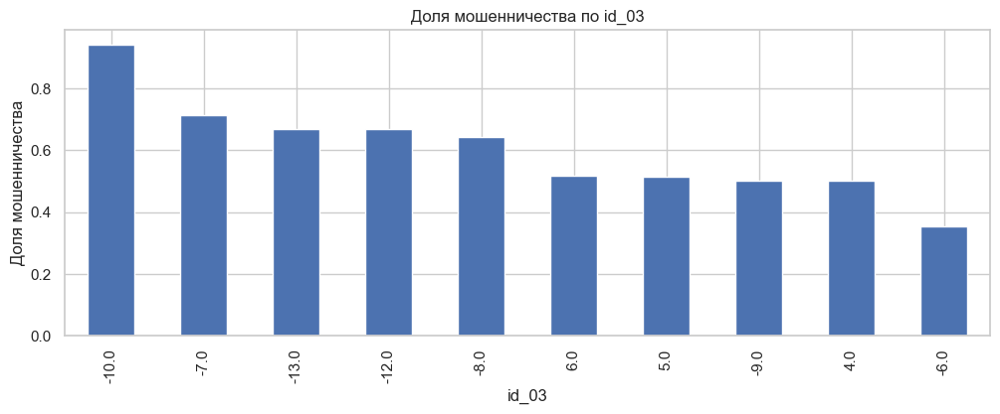


Анализ признака: id_04
id_04
 unknown    0.887689
 0.0        0.111320
-5.0        0.000224
-6.0        0.000166
-8.0        0.000108
-4.0        0.000086
-1.0        0.000073
-11.0       0.000059
-12.0       0.000058
-10.0       0.000051
Name: proportion, dtype: float64


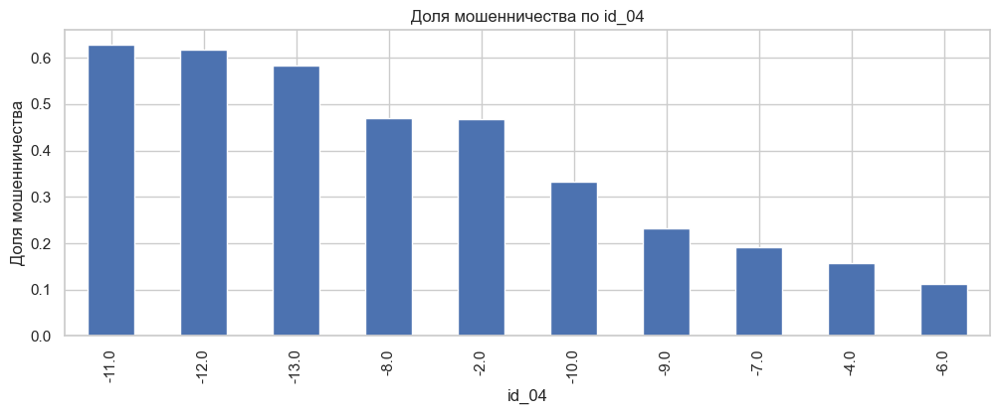


Анализ признака: id_05
id_05
unknown    0.768238
0.0        0.157048
1.0        0.014043
2.0        0.008360
3.0        0.006526
4.0        0.004980
6.0        0.003959
5.0        0.003915
7.0        0.002498
8.0        0.002144
Name: proportion, dtype: float64


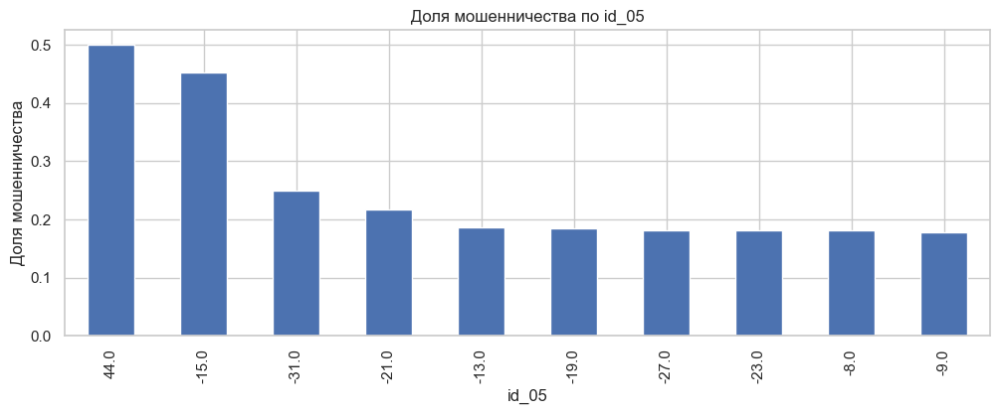


Анализ признака: id_06
id_06
 unknown    0.768238
 0.0        0.154647
-1.0        0.007937
-5.0        0.006518
-6.0        0.005515
-9.0        0.004460
-100.0      0.004117
-8.0        0.003377
-10.0       0.003326
-11.0       0.003102
Name: proportion, dtype: float64


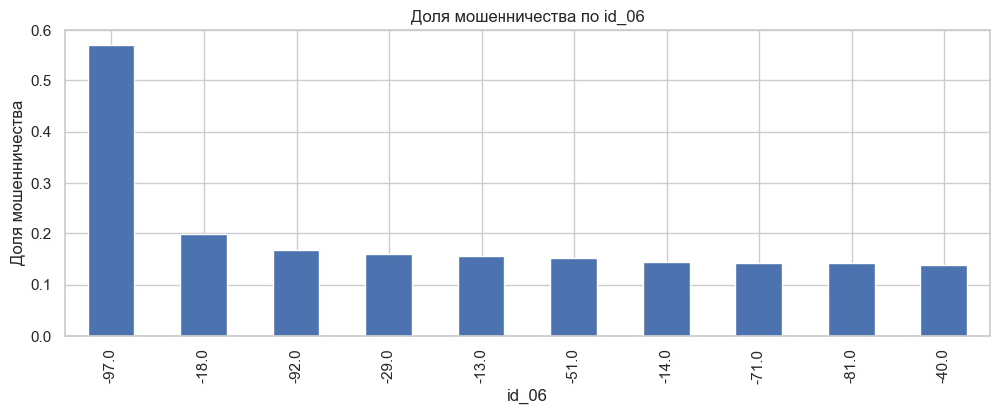


Анализ признака: id_09
id_09
 unknown    0.873123
 0.0        0.119176
 1.0        0.002736
 3.0        0.001636
 2.0        0.001309
 4.0        0.000457
 5.0        0.000351
 6.0        0.000246
-6.0        0.000112
-5.0        0.000102
Name: proportion, dtype: float64


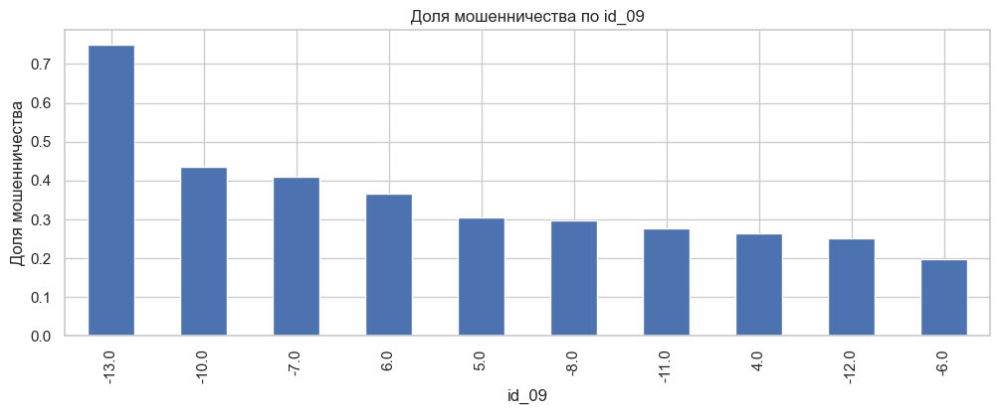


Анализ признака: id_10
id_10
 unknown    0.873123
 0.0        0.123411
-6.0        0.000500
-5.0        0.000418
-1.0        0.000339
-8.0        0.000249
-11.0       0.000215
-9.0        0.000200
-12.0       0.000200
-10.0       0.000195
Name: proportion, dtype: float64


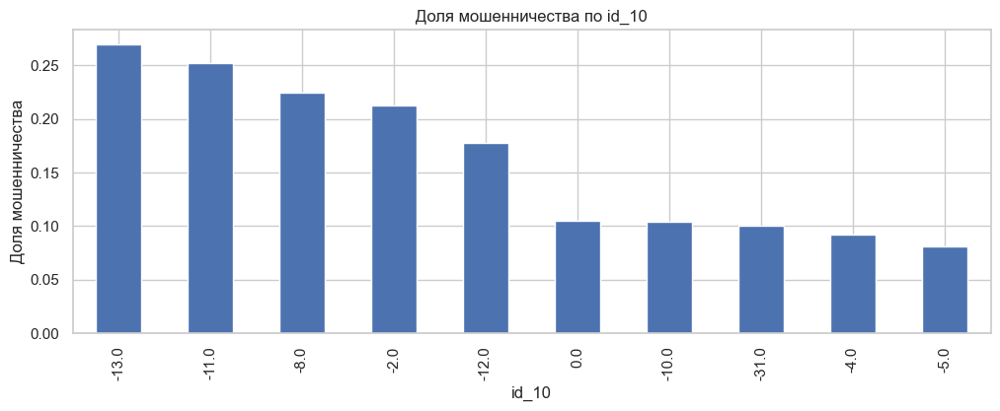


Анализ признака: id_11
id_11
unknown      0.761273
100.0        0.225492
95.080002    0.002085
95.160004    0.001277
97.120003    0.000745
96.669998    0.000564
95.650002    0.000484
96.190002    0.000408
94.290001    0.000386
93.550003    0.000345
Name: proportion, dtype: float64


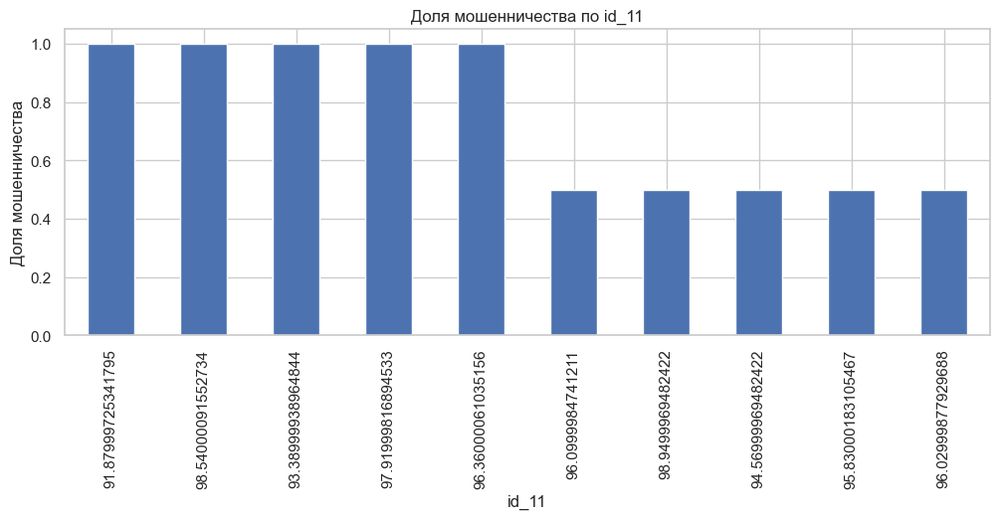


Анализ признака: id_12
id_12
unknown     0.755761
NotFound    0.208326
Found       0.035913
Name: proportion, dtype: float64


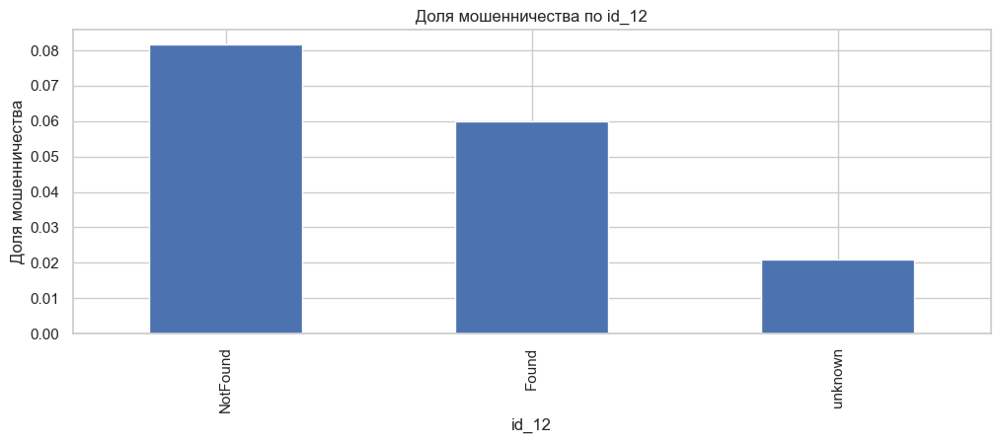


Анализ признака: id_13
id_13
unknown    0.784401
52.0       0.098383
49.0       0.044646
64.0       0.024434
33.0       0.017015
27.0       0.006208
20.0       0.004874
14.0       0.004232
63.0       0.002486
19.0       0.001942
Name: proportion, dtype: float64


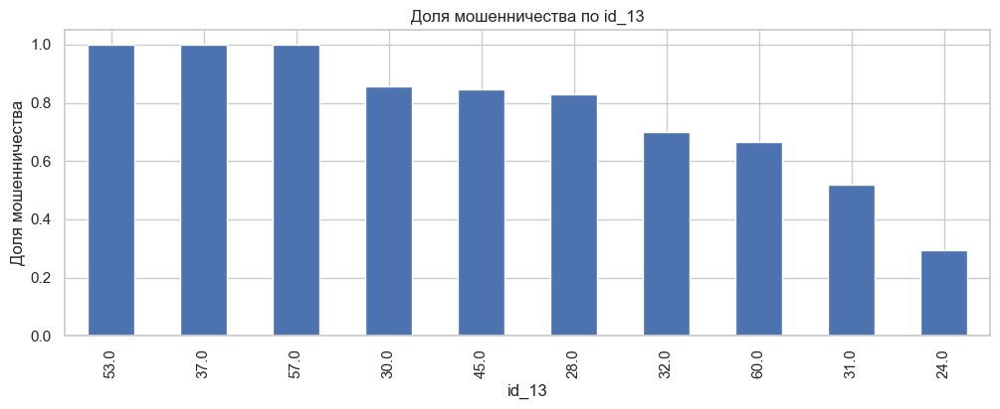


Анализ признака: id_14
id_14
 unknown    0.864456
-300.0      0.074713
-360.0      0.028213
-480.0      0.021829
-420.0      0.007691
-600.0      0.000843
 60.0       0.000625
 0.0        0.000325
-240.0      0.000269
-180.0      0.000213
Name: proportion, dtype: float64


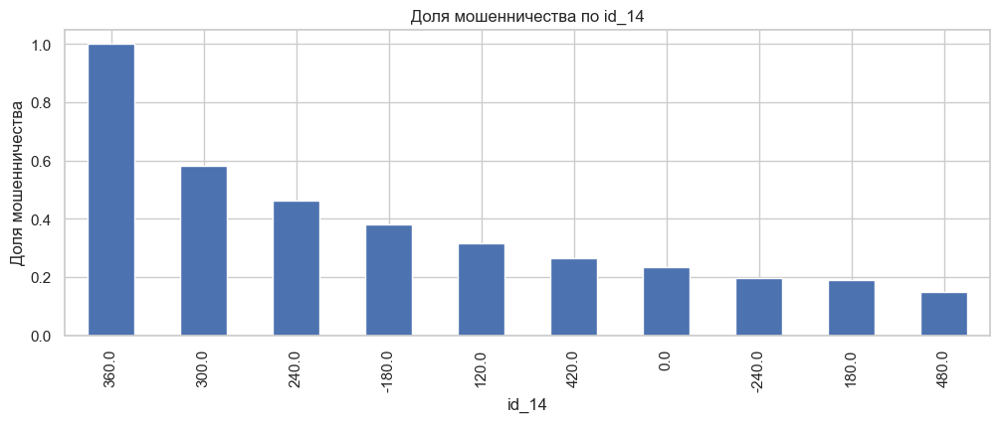


Анализ признака: id_15
id_15
unknown    0.761261
Found      0.114688
New        0.104332
Unknown    0.019719
Name: proportion, dtype: float64


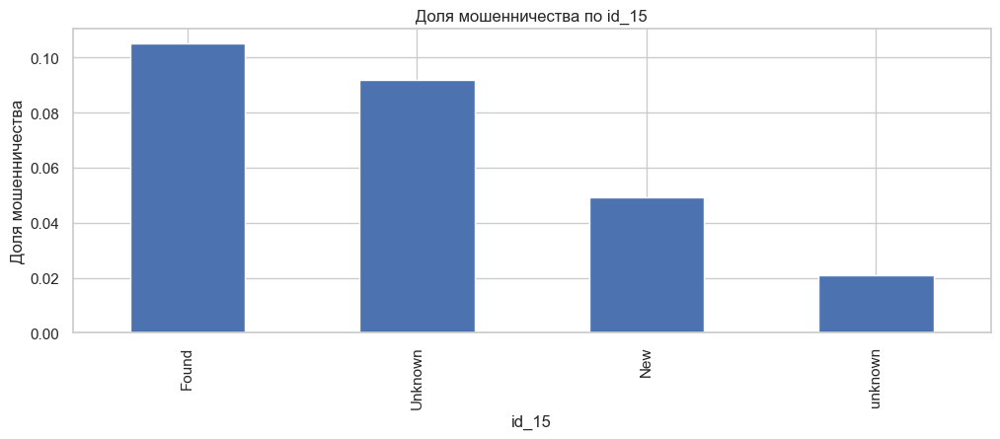


Анализ признака: id_16
id_16
unknown     0.780980
Found       0.112311
NotFound    0.106709
Name: proportion, dtype: float64


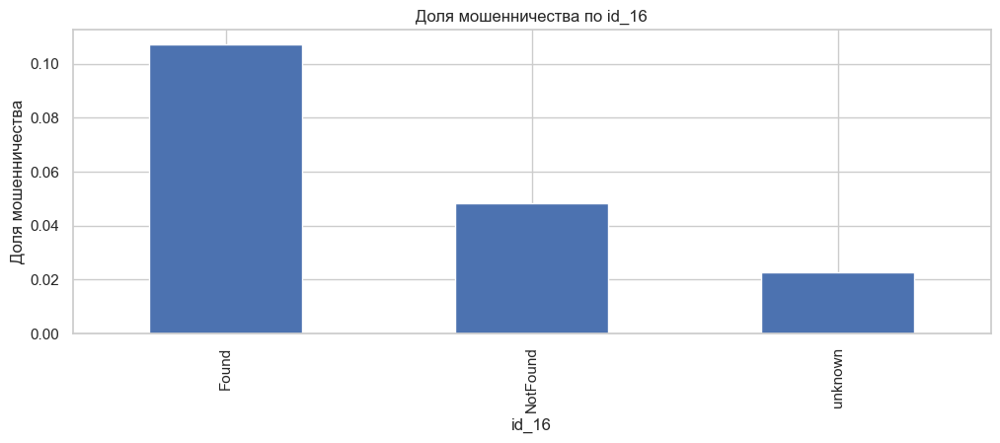


Анализ признака: id_17
id_17
unknown    0.763997
166.0      0.133151
225.0      0.096468
102.0      0.001167
159.0      0.000596
100.0      0.000569
121.0      0.000472
148.0      0.000388
150.0      0.000213
191.0      0.000208
Name: proportion, dtype: float64


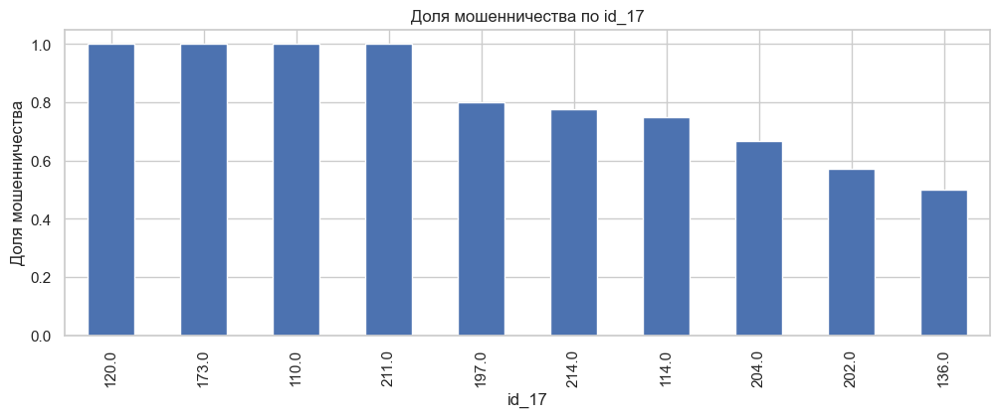


Анализ признака: id_18
id_18
unknown    0.923607
15.0       0.043162
13.0       0.022757
12.0       0.007884
18.0       0.001101
20.0       0.000574
17.0       0.000395
26.0       0.000151
21.0       0.000132
24.0       0.000088
Name: proportion, dtype: float64


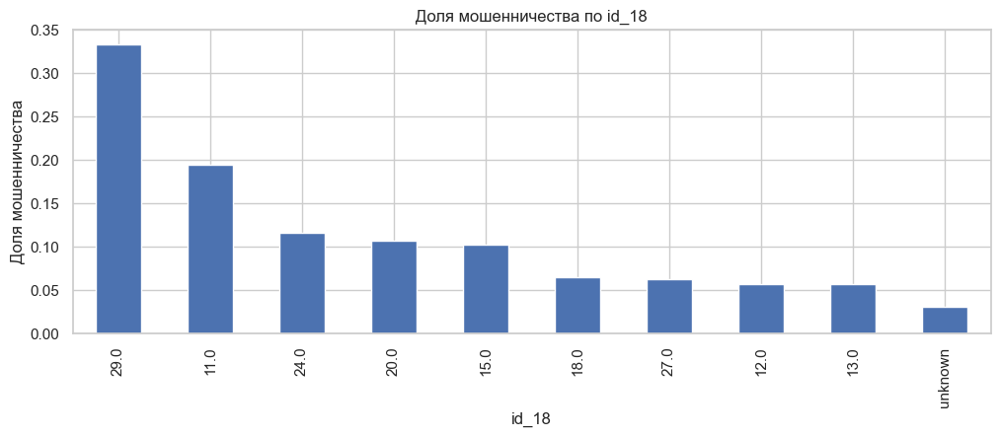


Анализ признака: id_19
id_19
unknown    0.764084
266.0      0.033612
410.0      0.019166
427.0      0.014915
529.0      0.013754
312.0      0.010545
100.0      0.008910
542.0      0.008663
215.0      0.008006
153.0      0.007424
Name: proportion, dtype: float64


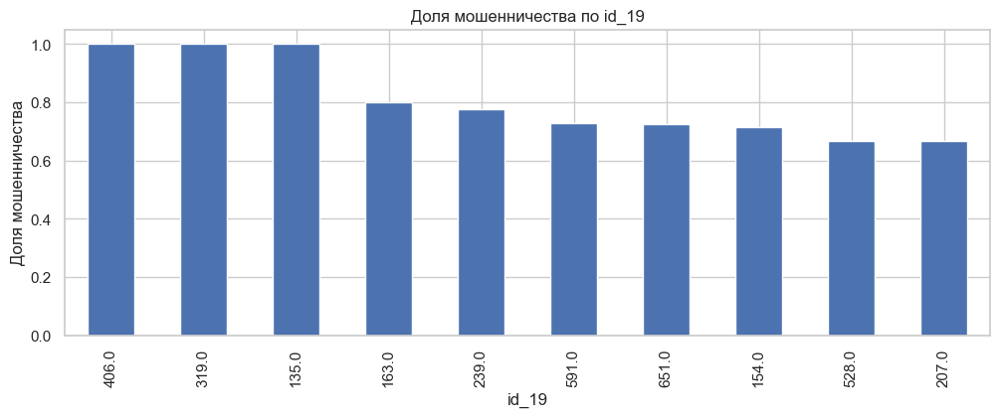


Анализ признака: id_20
id_20
unknown    0.764180
507.0      0.037781
222.0      0.018737
325.0      0.013772
533.0      0.011195
214.0      0.009591
549.0      0.009556
600.0      0.009420
563.0      0.007977
333.0      0.006250
Name: proportion, dtype: float64


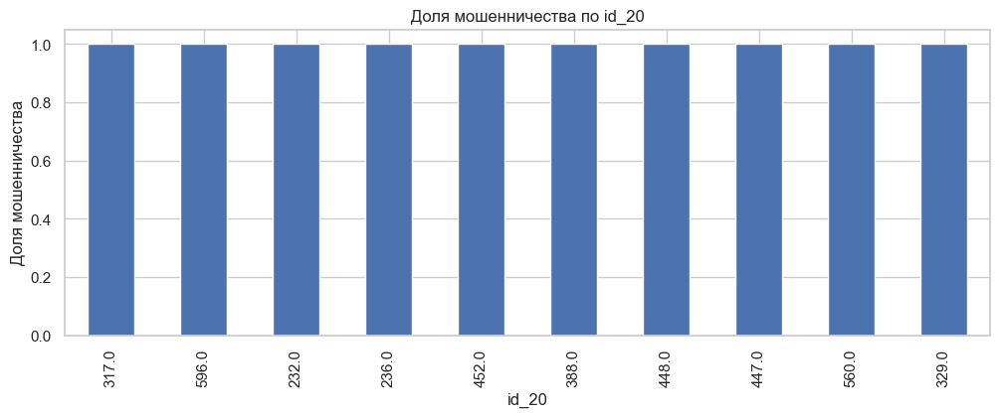


Анализ признака: id_28
id_28
unknown    0.761273
Found      0.129089
New        0.109639
Name: proportion, dtype: float64


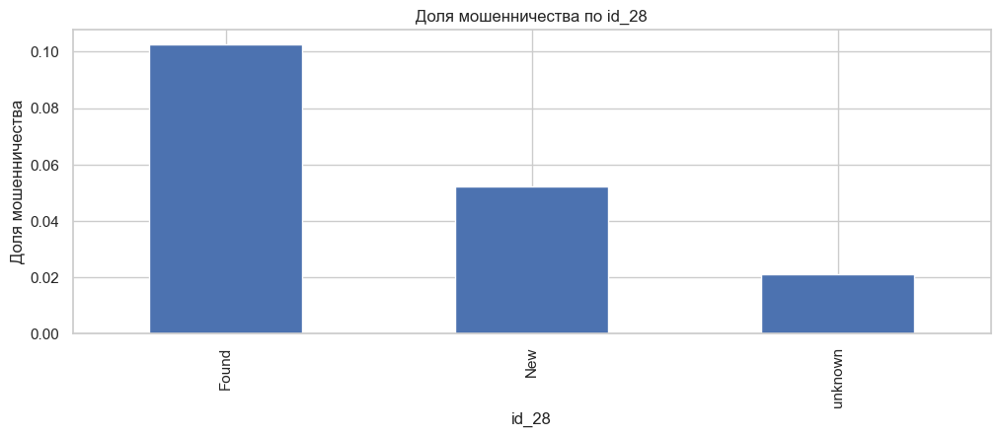


Анализ признака: id_29
id_29
unknown     0.761273
Found       0.126877
NotFound    0.111850
Name: proportion, dtype: float64


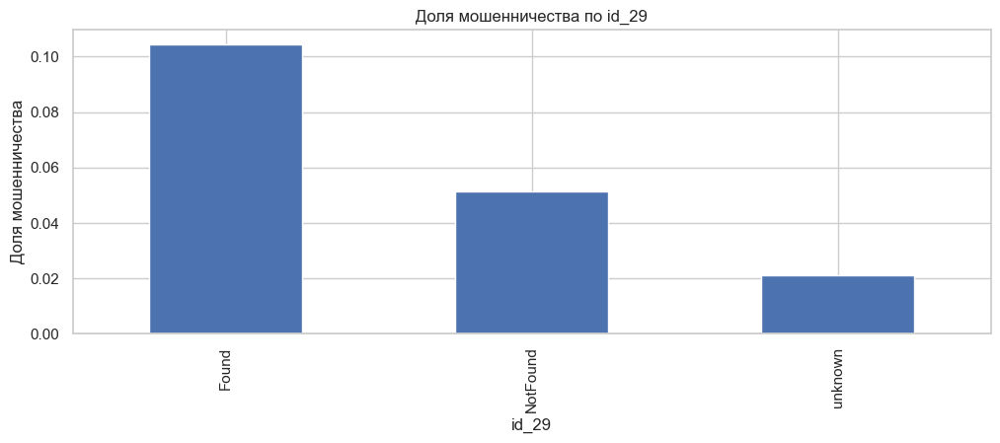


Анализ признака: id_30
id_30
unknown             0.868654
Windows 10          0.035823
Windows 7           0.022200
iOS 11.2.1          0.006303
iOS 11.1.2          0.006264
Android 7.0         0.004862
Mac OS X 10_12_6    0.004333
Mac OS X 10_11_6    0.003976
iOS 11.3.0          0.003414
Windows 8.1         0.003241
Name: proportion, dtype: float64


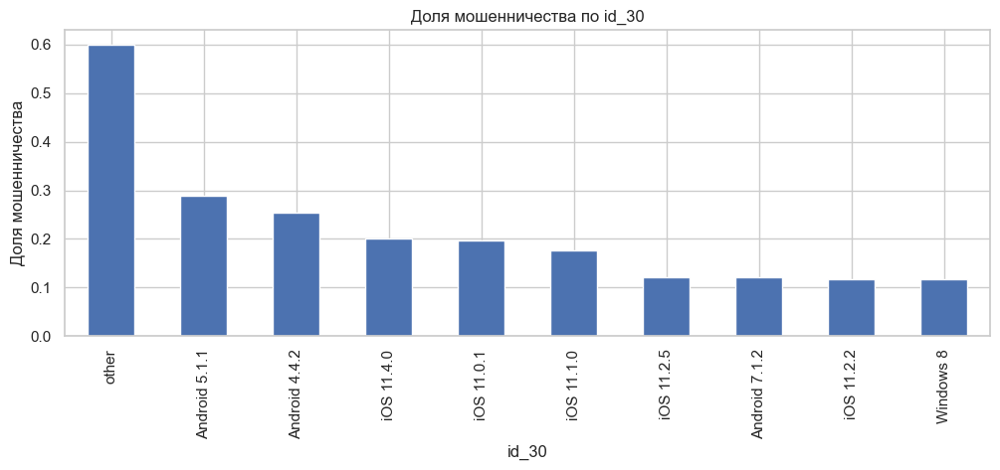


Анализ признака: id_31
id_31
unknown                    0.762451
chrome 63.0                0.037254
mobile safari 11.0         0.022730
mobile safari generic      0.019430
ie 11.0 for desktop        0.015291
safari generic             0.013877
chrome 62.0                0.012162
chrome 65.0                0.011635
chrome 64.0                0.011364
chrome 63.0 for android    0.009832
Name: proportion, dtype: float64


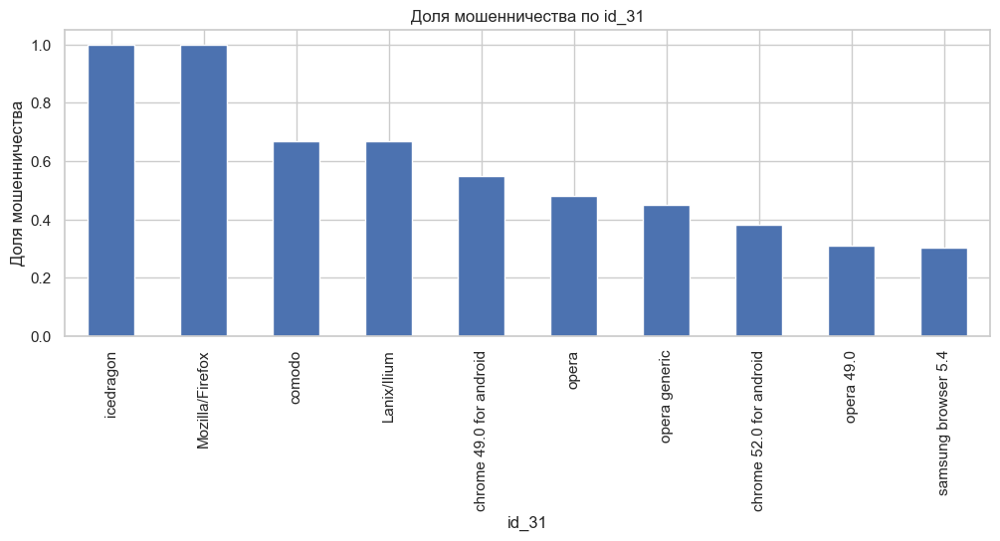


Анализ признака: id_32
id_32
unknown    0.868619
24.0       0.089869
32.0       0.041366
16.0       0.000137
0.0        0.000010
Name: proportion, dtype: float64


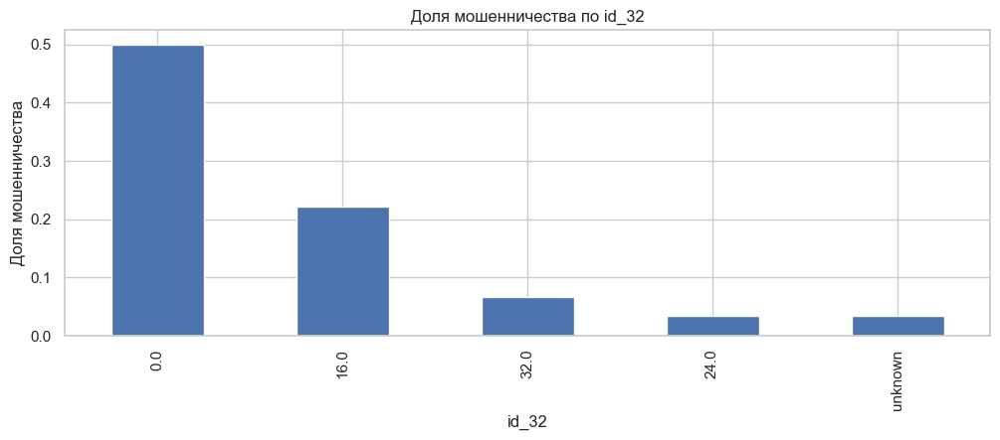


Анализ признака: id_33
id_33
unknown      0.875895
1920x1080    0.028574
1366x768     0.014571
1334x750     0.010917
2208x1242    0.008297
1440x900     0.007424
1600x900     0.005944
2048x1536    0.005896
1280x800     0.003639
2560x1600    0.003544
Name: proportion, dtype: float64


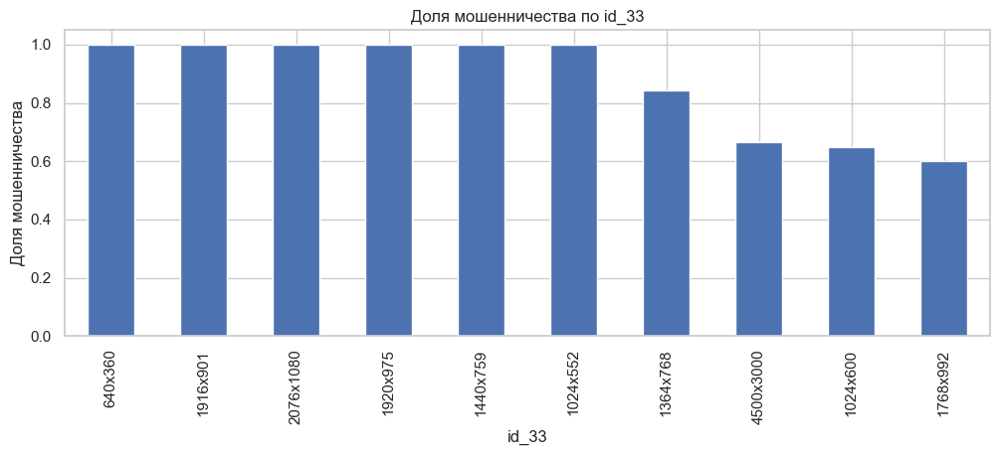


Анализ признака: id_34
id_34
unknown            0.868248
match_status:2     0.101621
match_status:1     0.029424
match_status:0     0.000703
match_status:-1    0.000005
Name: proportion, dtype: float64


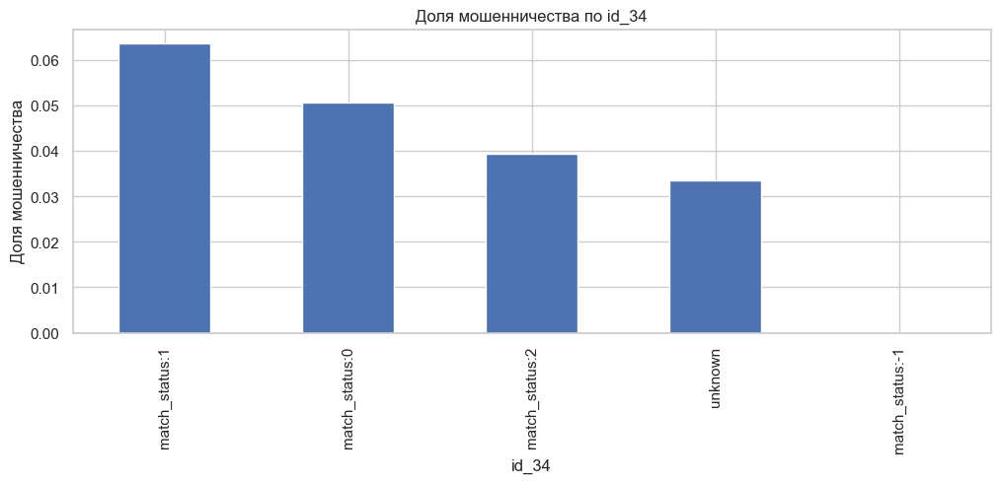


Анализ признака: id_35
id_35
unknown    0.761261
T          0.131768
F          0.106972
Name: proportion, dtype: float64


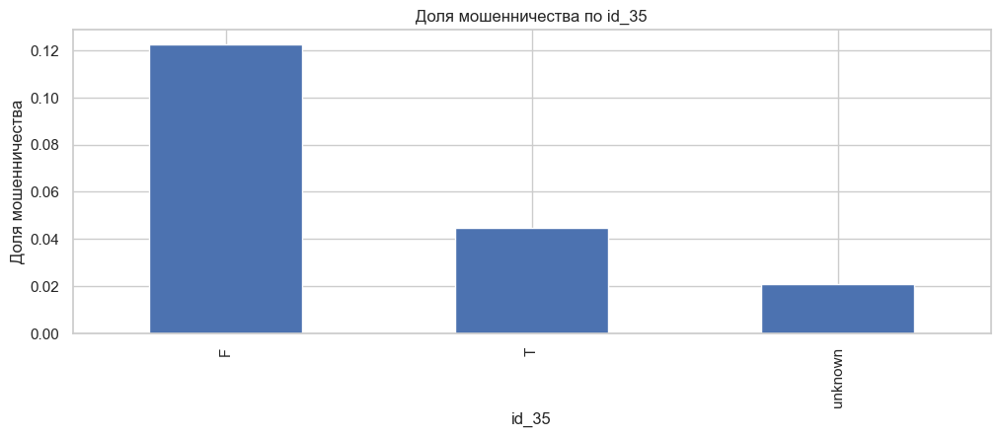


Анализ признака: id_36
id_36
unknown    0.761261
F          0.227023
T          0.011716
Name: proportion, dtype: float64


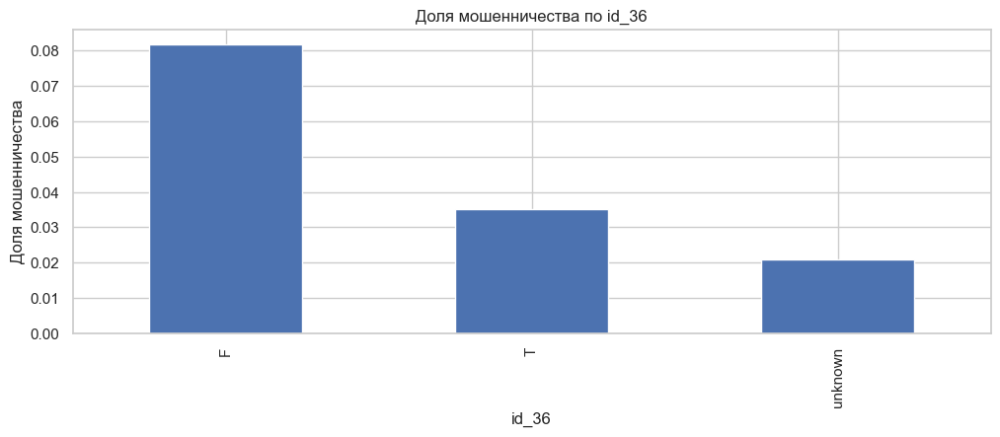


Анализ признака: id_37
id_37
unknown    0.761261
T          0.187036
F          0.051704
Name: proportion, dtype: float64


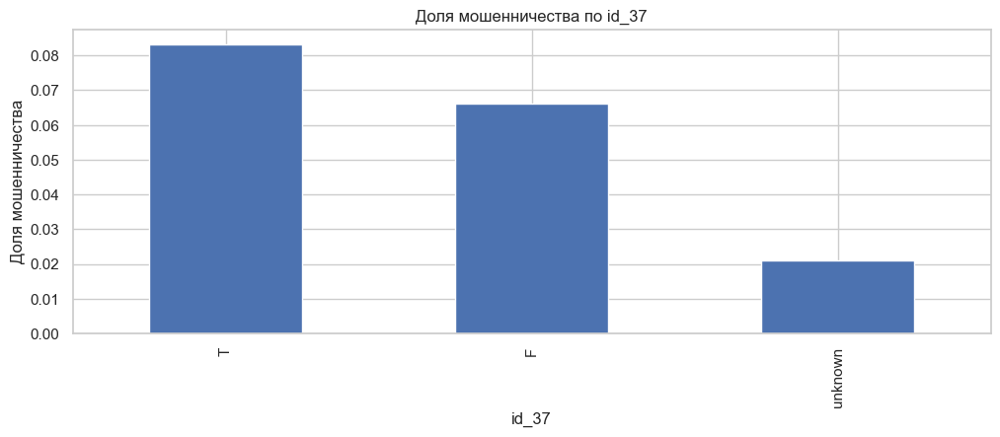


Анализ признака: id_38
id_38
unknown    0.761261
F          0.125177
T          0.113562
Name: proportion, dtype: float64


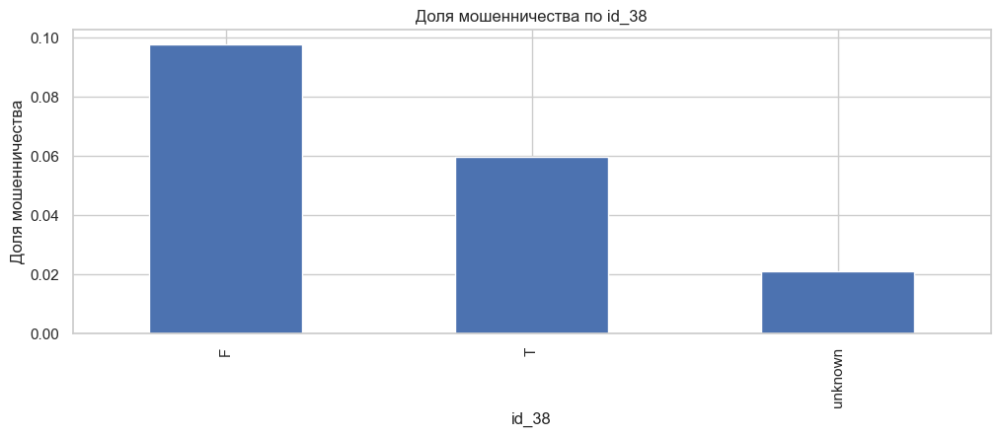


Анализ признака: M1
M1
T          0.540886
unknown    0.459071
F          0.000042
Name: proportion, dtype: float64


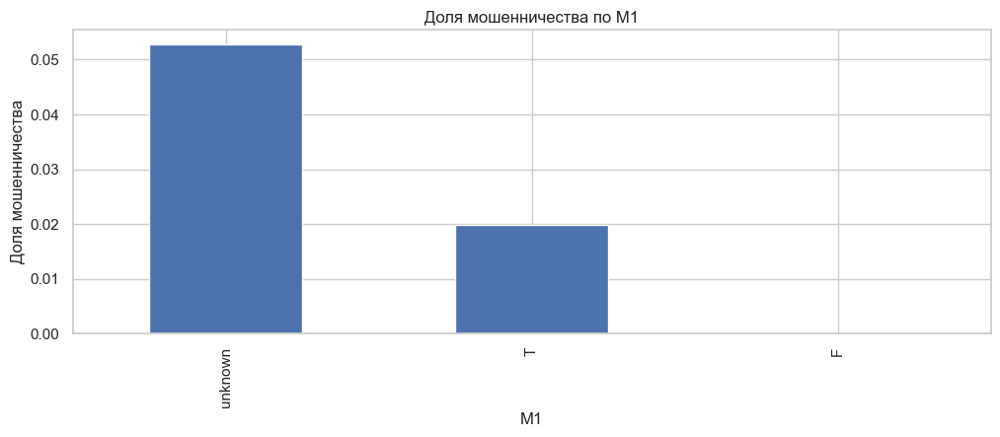


Анализ признака: M2
M2
T          0.483402
unknown    0.459071
F          0.057527
Name: proportion, dtype: float64


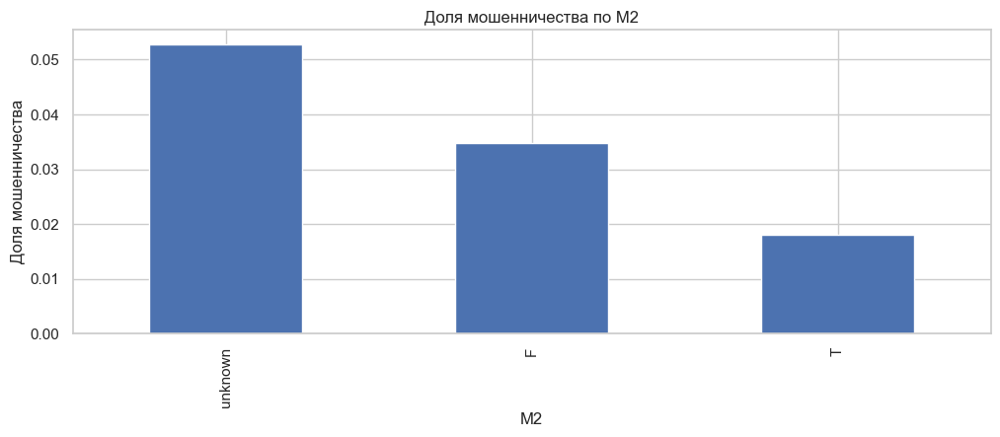


Анализ признака: M3
M3
unknown    0.459071
T          0.426273
F          0.114656
Name: proportion, dtype: float64


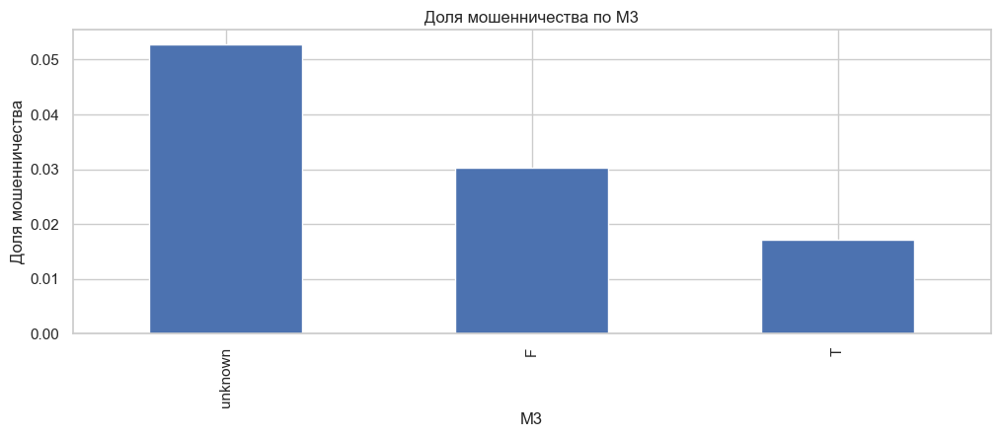


Анализ признака: M4
M4
unknown    0.476588
M0         0.332585
M2         0.101373
M1         0.089454
Name: proportion, dtype: float64


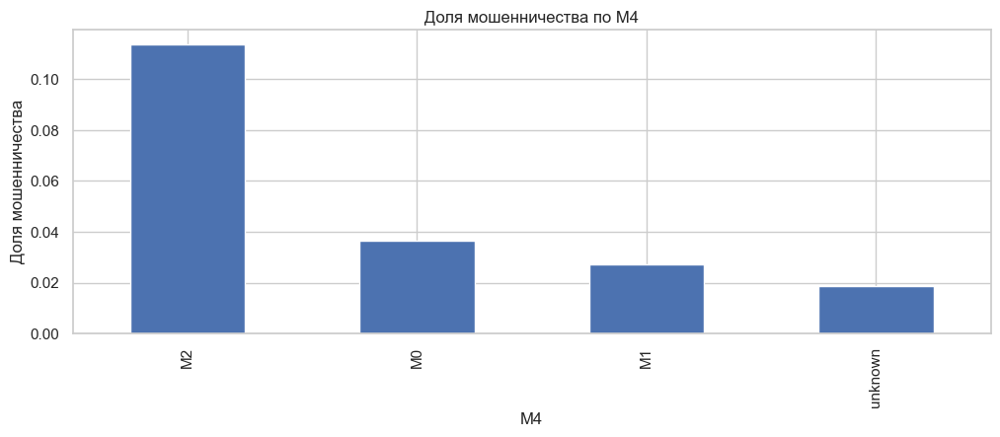


Анализ признака: M5
M5
unknown    0.593494
F          0.224356
T          0.182150
Name: proportion, dtype: float64


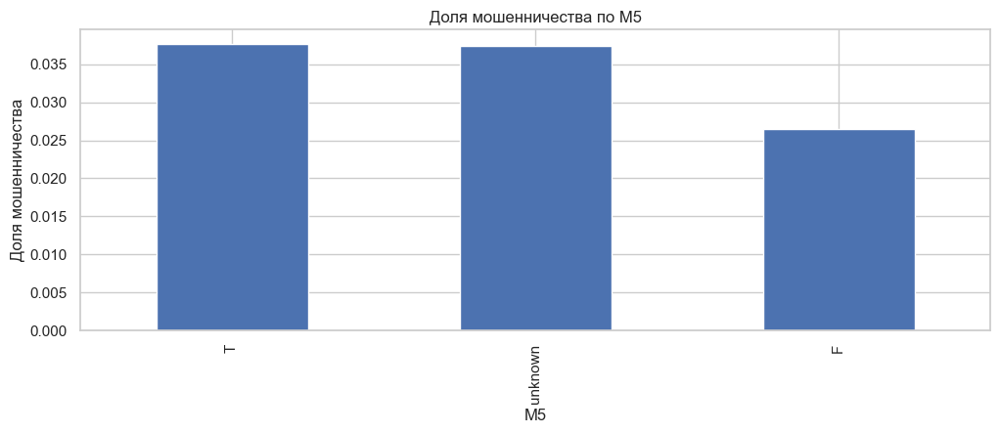


Анализ признака: M6
M6
F          0.385843
T          0.327368
unknown    0.286788
Name: proportion, dtype: float64


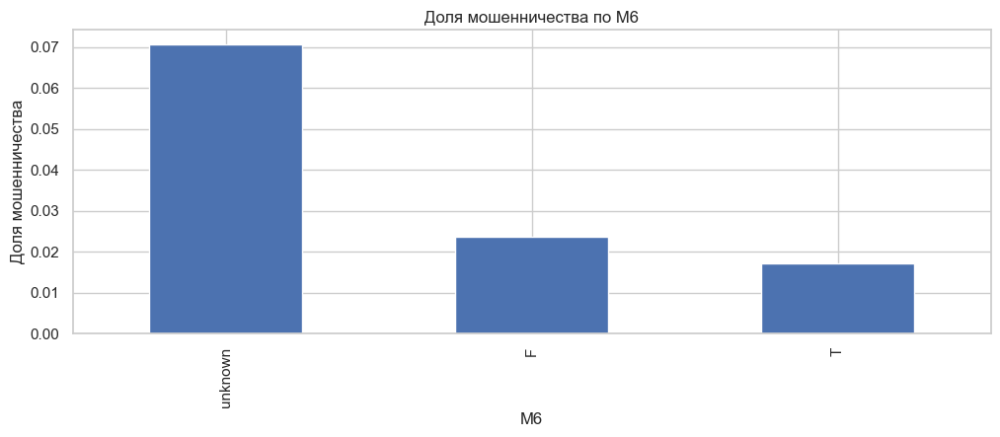


Анализ признака: M7
M7
unknown    0.586353
F          0.357933
T          0.055713
Name: proportion, dtype: float64


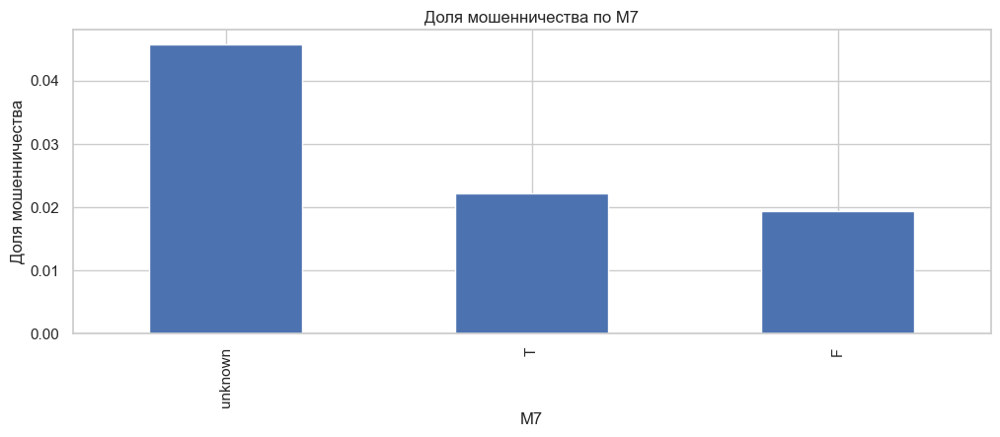


Анализ признака: M8
M8
unknown    0.586331
F          0.262897
T          0.150772
Name: proportion, dtype: float64


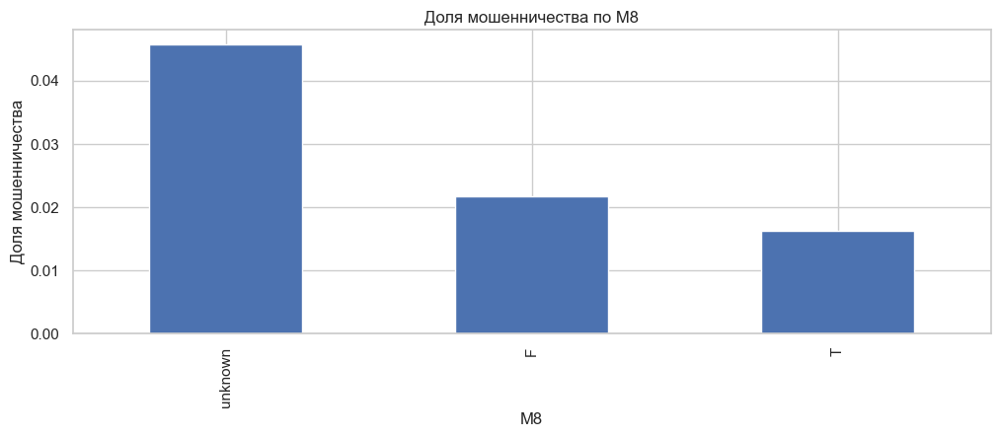


Анализ признака: M9
M9
unknown    0.586331
T          0.348251
F          0.065418
Name: proportion, dtype: float64


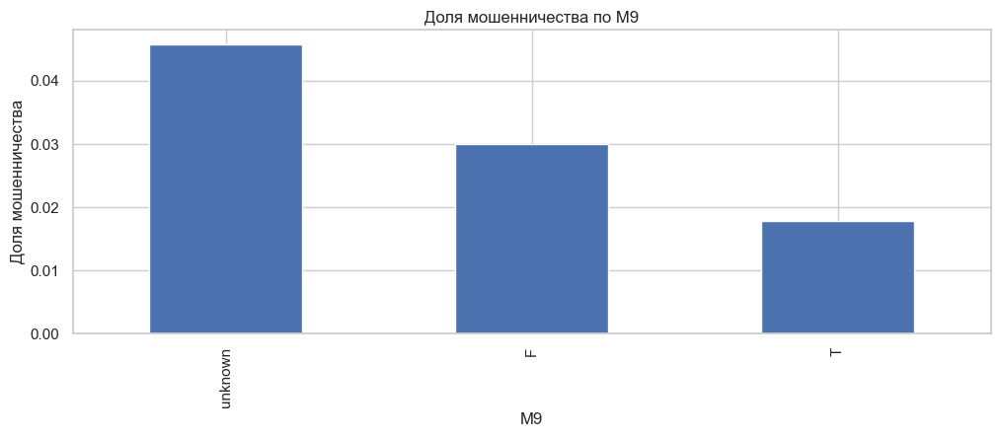

In [32]:
exclude = [
    'ProductCD', 
    'card1', 
    'card2', 
    'card3', 
    'card4', 
    'card5', 
    'card6', 
    'addr1', 
    'addr2', 
    'P_emaildomain', 
    'R_emaildomain', 
    'DeviceType',
    'DeviceInfo'
]

for col in categorical_features:
    if col in exclude:
        continue
    
    print(f'\nАнализ признака: {col}')
    print(train[col].value_counts(normalize=True).head(10))

    fraud_rate = train.groupby(col)['isFraud'].mean().sort_values(ascending=False)
    plt.figure(figsize=(12,4))
    fraud_rate.head(10).plot(kind='bar')
    plt.title(f'Доля мошенничества по {col}')
    plt.ylabel('Доля мошенничества')
    plt.show()


### 5. Анализ числовых признаков

#### Анализ признака  dist1

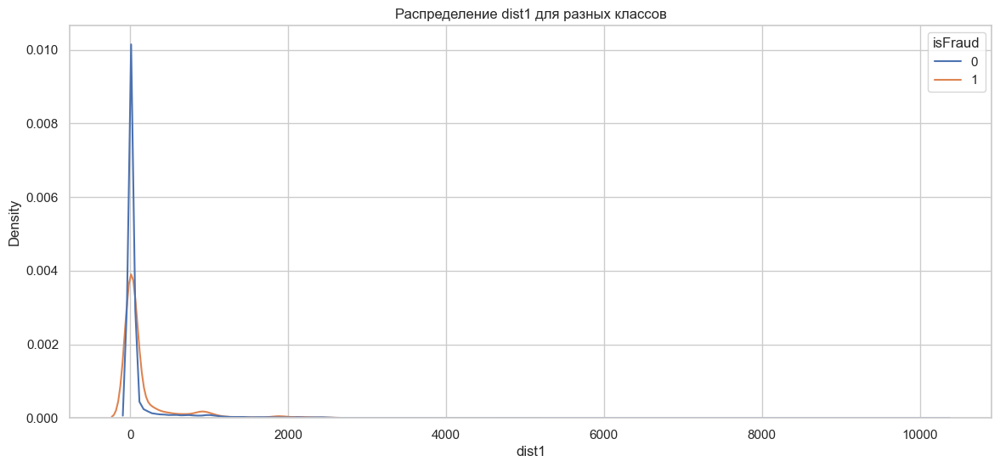

In [33]:
col = 'dist1'
plt.figure(figsize=(14,6))
sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
plt.title(f'Распределение {col} для разных классов')
plt.show()


### Анализ графика признака `dist1`

1. **Сосредоточенность значений:**
   - Большинство значений `dist1` сконцентрировано около 0, что отображается высоким пиком в левой части графика для обоих классов (`isFraud` = 0 и 1).

2. **Сходство распределений:**
   - Обе кривые (для мошеннических и немошеннических транзакций) имеют схожие формы и убывают относительно быстро, что указывает на распределение данных, близкое к нормальному.

3. **Редкие большие значения:**
   - Есть небольшое количество более высоких значений, растягивающее распределение вправо, что может указывать на аномальные или редкие случаи транзакций.

### Что можно сделать с признаком:

- **Дополнительный анализ редких значений:**
  - Провести исследование аномально больших значений `dist1`, чтобы выявить потенциальные риски и особенности.

- **Оценка значимости:**
  - Определить, действительно ли `dist1` является значимым признаком для выявления мошенничества в этой выборке, учитывая его схожесть для обоих классов.

#### Анализ признака  dist2

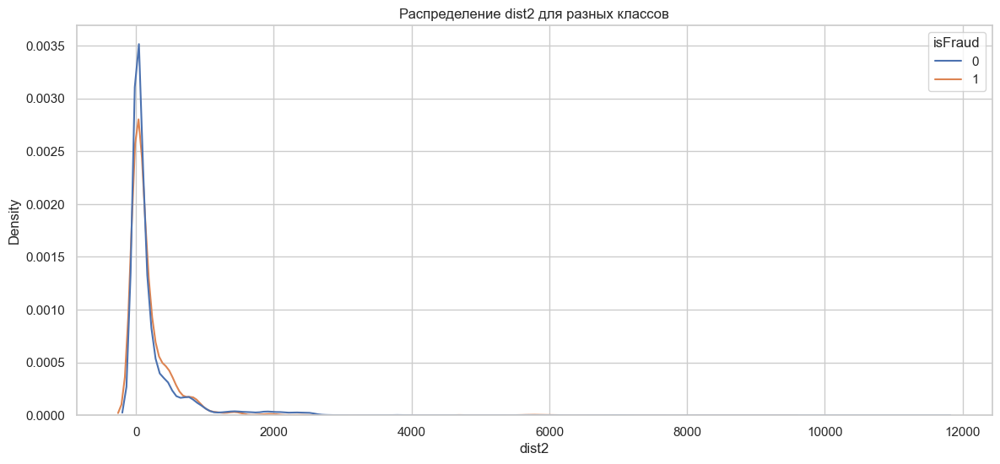

In [34]:
col = 'dist2'
plt.figure(figsize=(14,6))
sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
plt.title(f'Распределение {col} для разных классов')
plt.show()


### Анализ графика признака `dist2`

1. **Концентрация значений:**
   - Большинство значений `dist2` также сконцентрировано около 0, аналогично `dist1`.

2. **Схожесть распределений:**
   - Наблюдается сильное перекрытие между распределениями для мошеннических (`isFraud` = 1) и немошеннических (`isFraud` = 0) транзакций, указывая на отсутствие явных различий.

3. **Хвосты распределения:**
   - Небольшое количество более высоких значений, растягивающее распределение вправо. Это говорит о редких случаях, которые могут быть аномальными.

### Что можно сделать с признаком:

- **Анализ аномалий:**
  - Изучить редкие большие значения в `dist2`, чтобы понять, могут ли они сигнализировать о мошенничестве или ошибках.

- **Важность признака:**
  - Оценить значимость `dist2` для моделей предсказания, так как его схожесть для обоих классов может ограничивать его полезность.

### Обзор остальных признаков

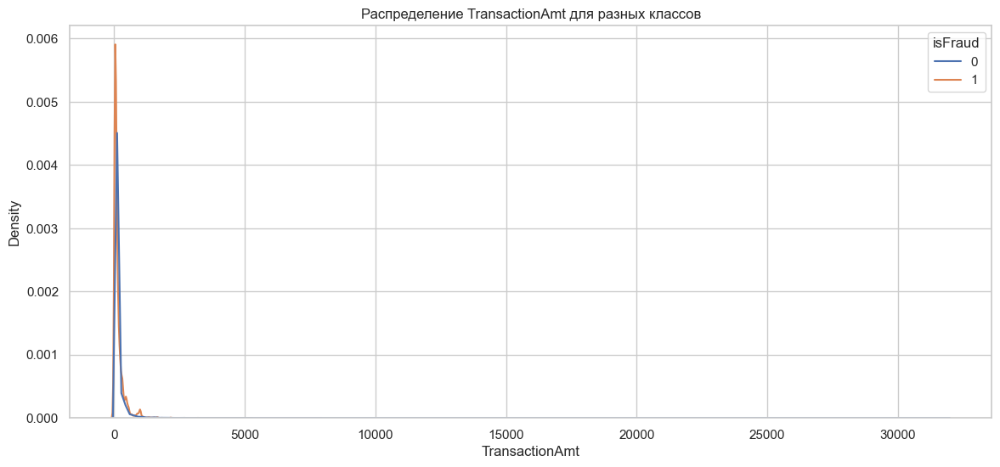

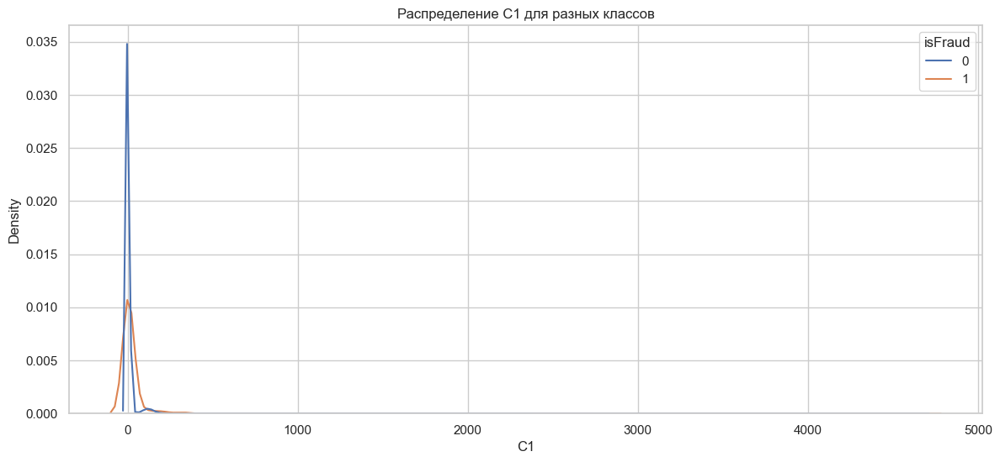

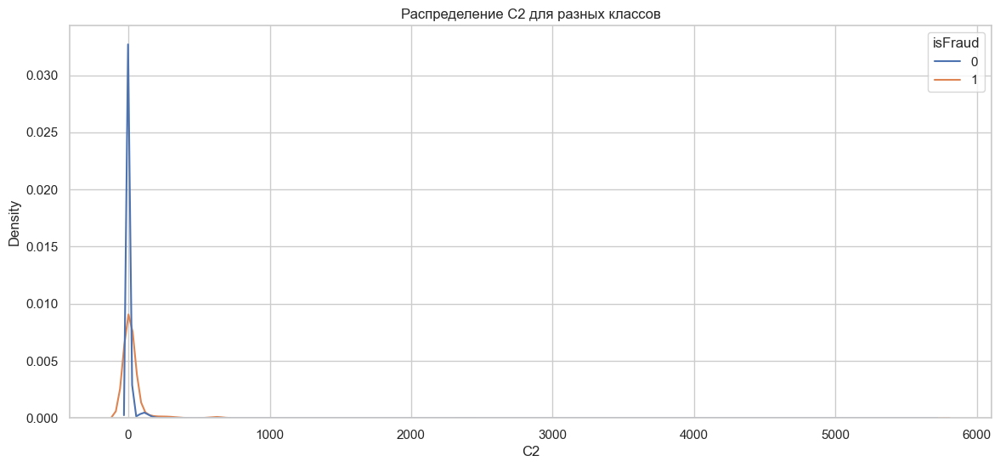

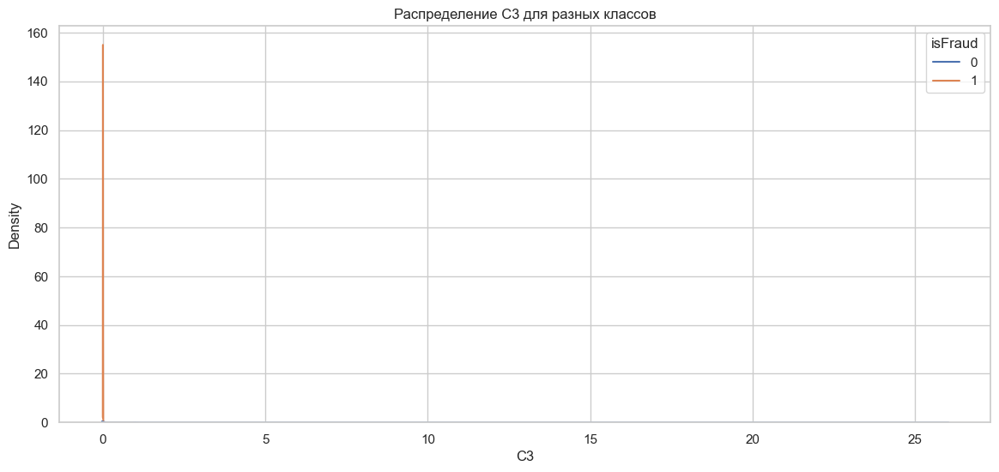

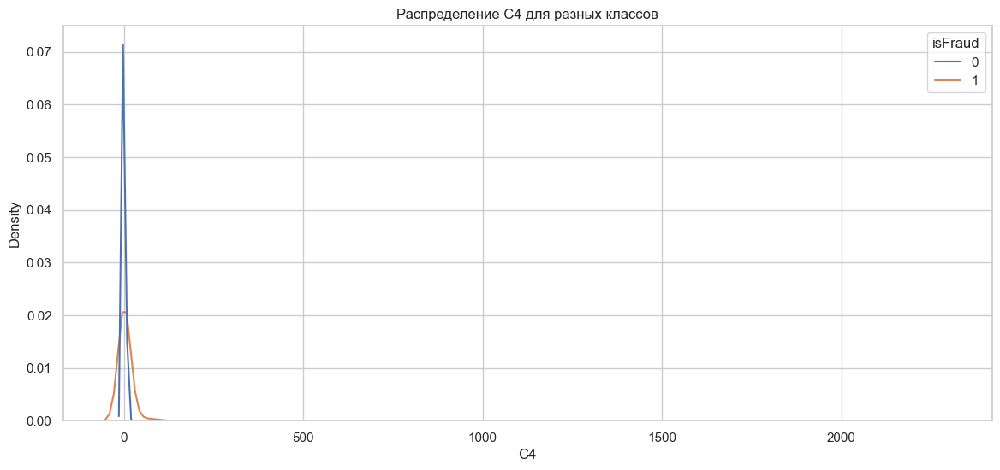

...

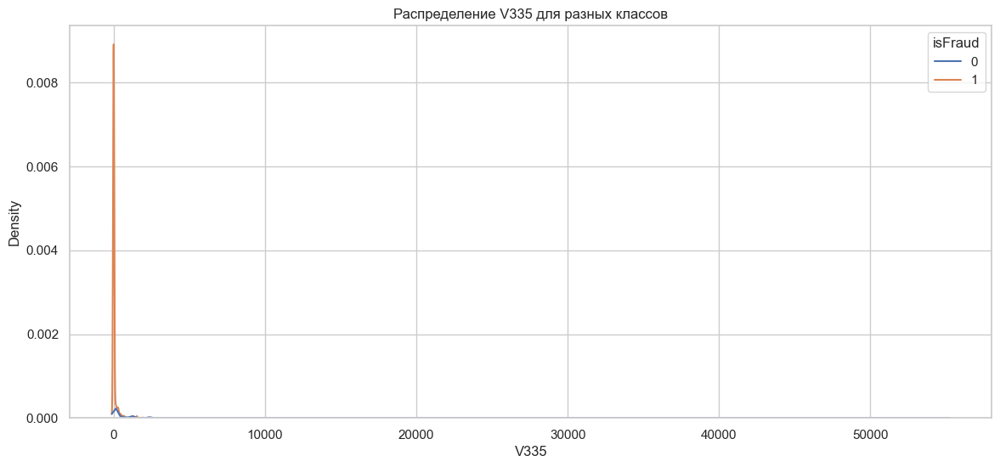

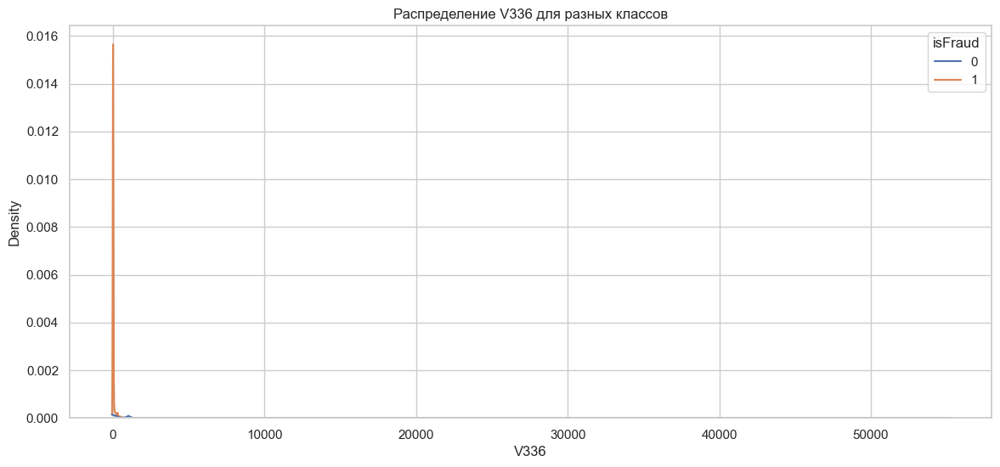

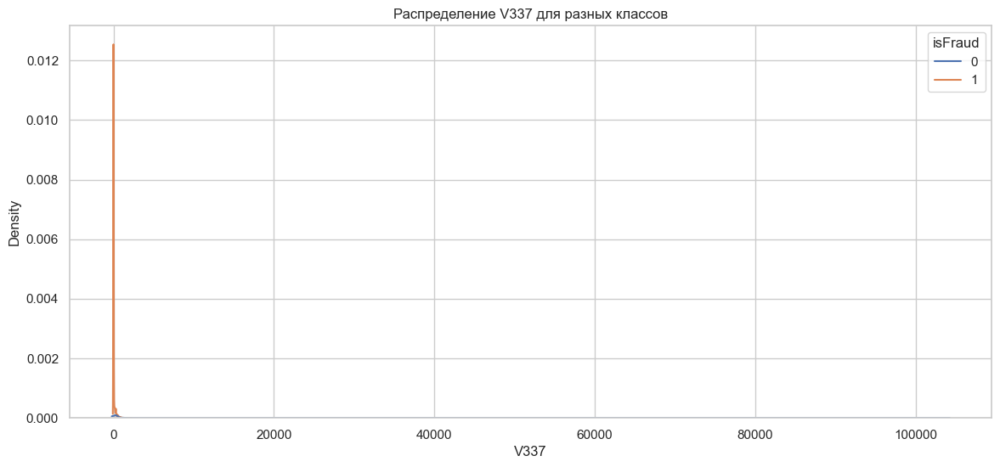

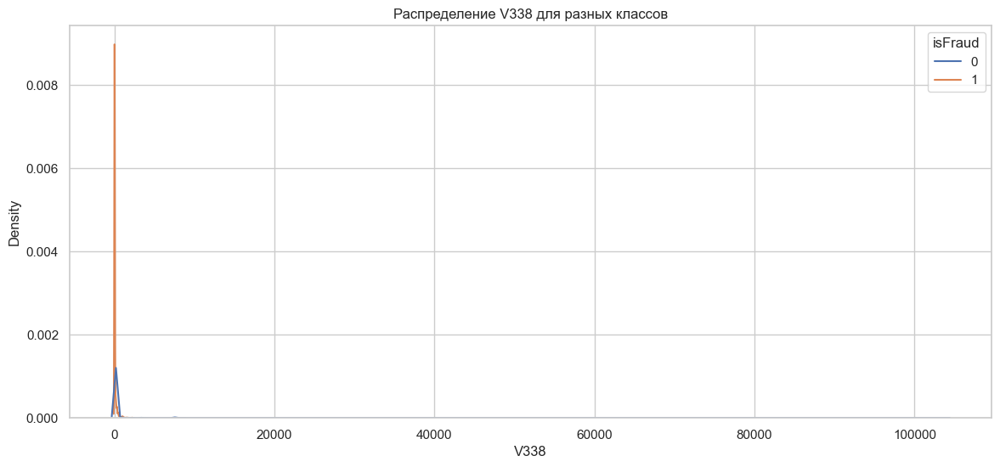

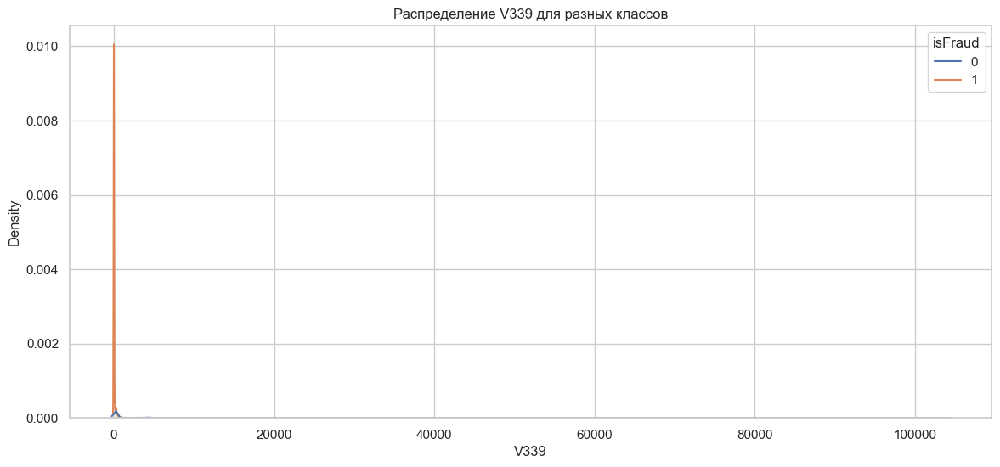

In [35]:
exclude = [
    'isFraud',
    'TransactionID',
    'TransactionDT',
    'dist1',
    'dist2', 
]

for col in numeric_features:
    if col in exclude:
        continue

    
    plt.figure(figsize=(14,6))
    sns.kdeplot(data=train, x=col, hue='isFraud', common_norm=False)
    plt.title(f'Распределение {col} для разных классов')
    plt.show()


> Если рассматривать графики в целом по всем признакам. То можно сделать вывдол что в каждом графике график класса 0 и 1 повтаряют друг друго (только с разной амплитудой и иногда с небольшим смещением)

### 6. Корреляции

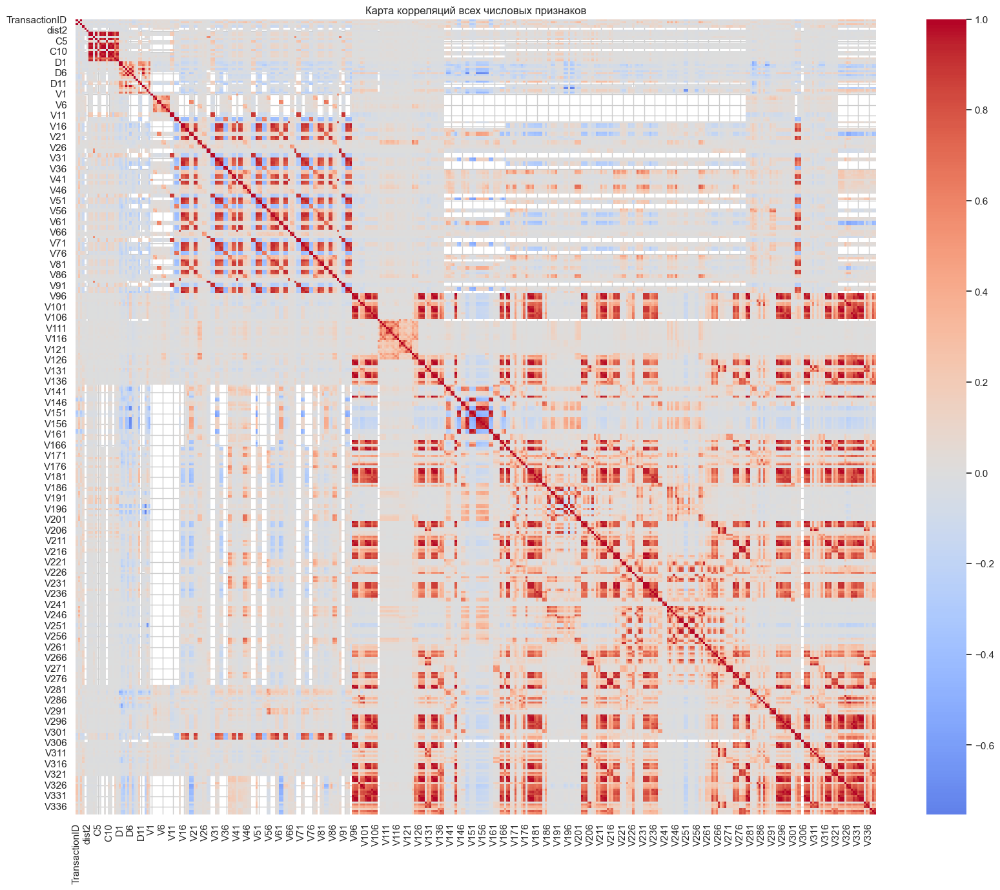

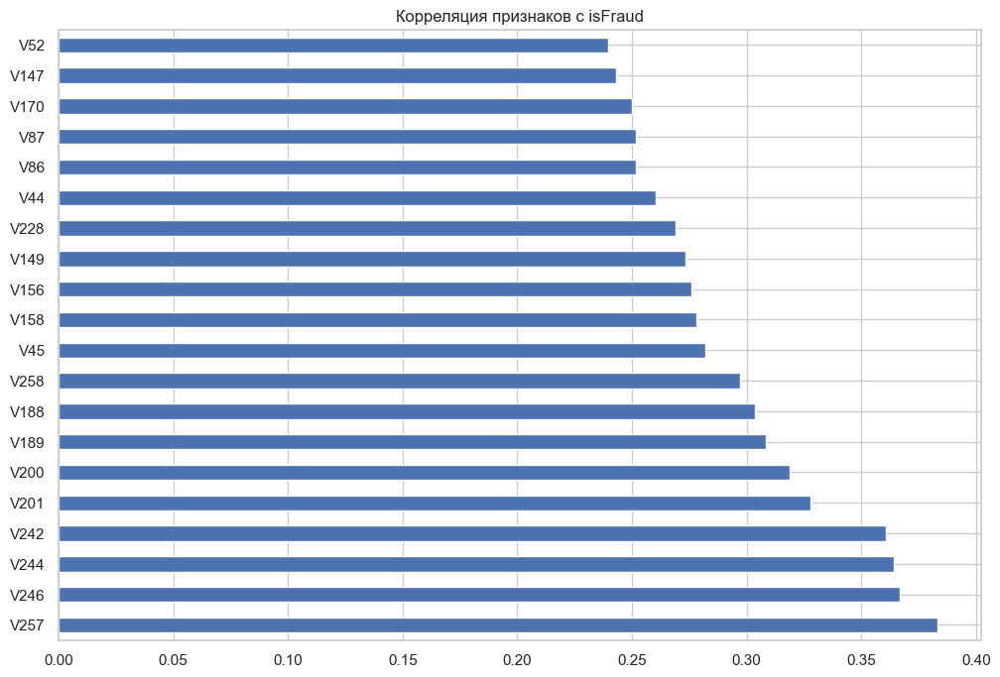

In [36]:
# Корреляционная матрица всех числовых признаков
plt.figure(figsize=(20, 16))
corr_matrix = train[numeric_features].corr()
sns.heatmap(corr_matrix, cmap='coolwarm', center=0)
plt.title('Карта корреляций всех числовых признаков')
plt.show()

# Корреляция признаков с isFraud
plt.figure(figsize=(12,8))
fraud_corr.head(20).plot(kind='barh')
plt.title('Корреляция признаков с isFraud')
plt.show()


### 7. Поиск выбросов

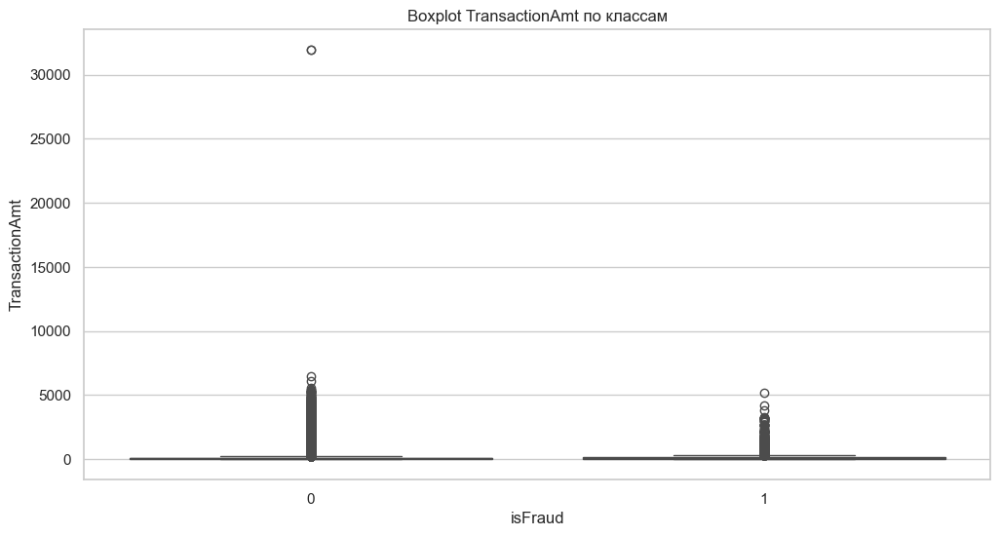

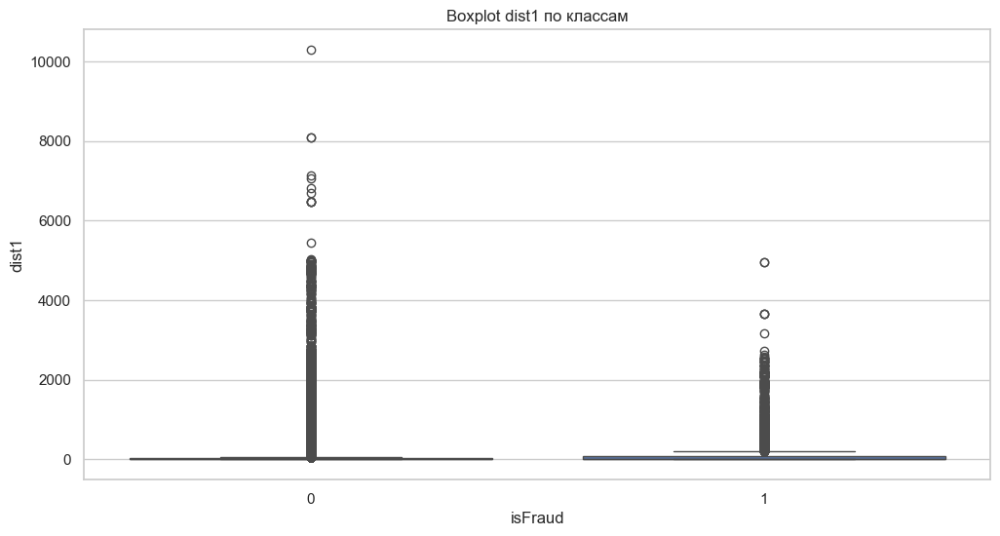

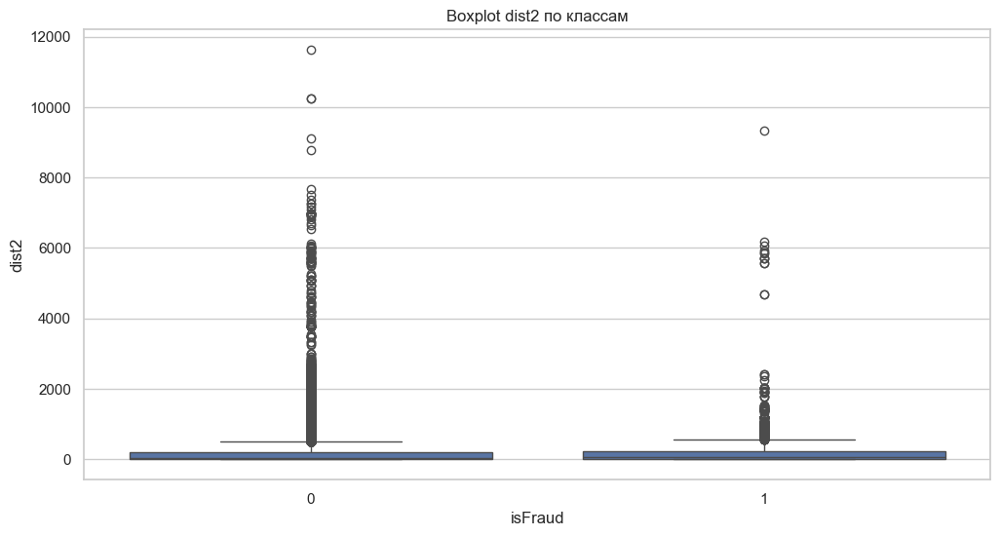

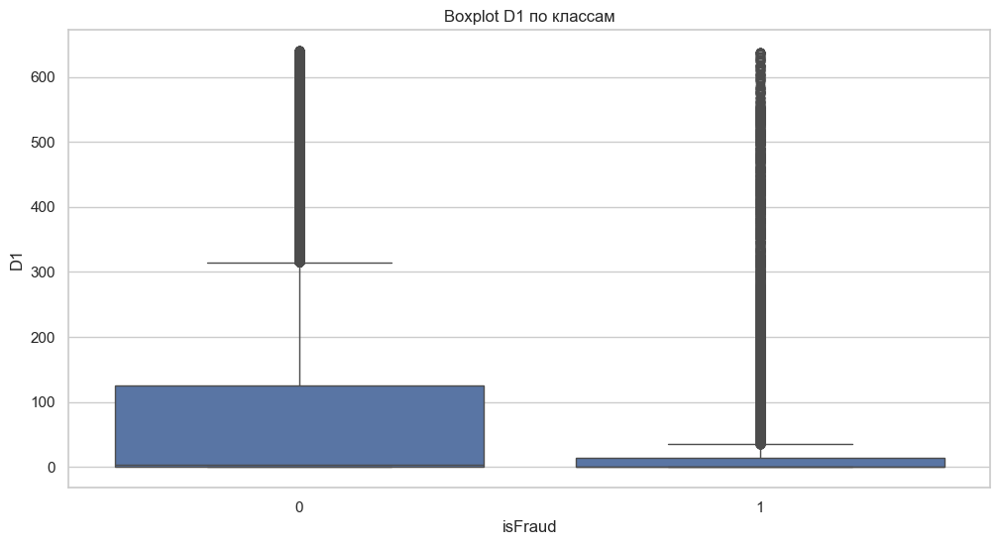

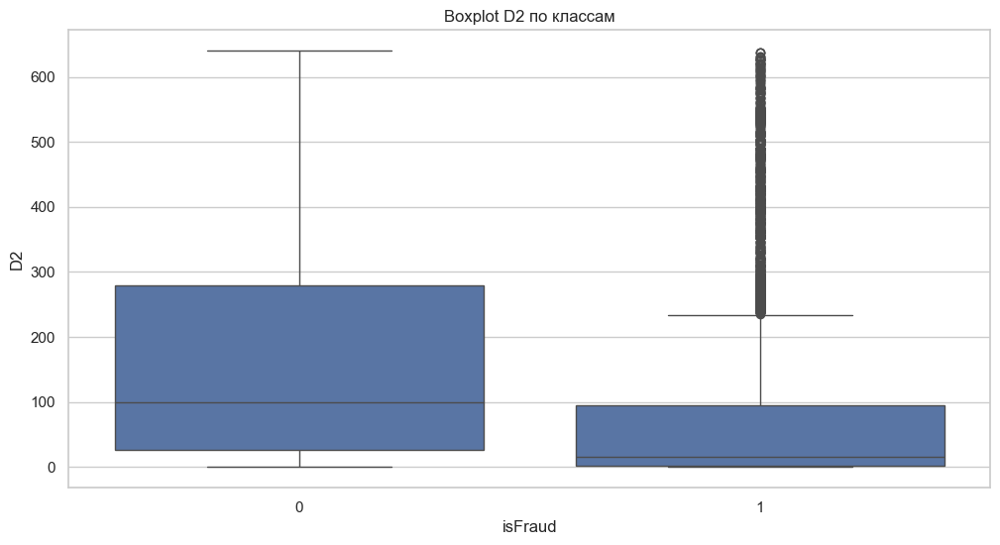

In [37]:
key_features = ['TransactionAmt', 'dist1', 'dist2', 'D1', 'D2']
for col in key_features:
    if col in train.columns:
        plt.figure(figsize=(12,6))
        sns.boxplot(x='isFraud', y=col, data=train)
        plt.title(f'Boxplot {col} по классам')
        plt.show()


## Минимальная обработка признаков

### 1. Обработка редких категорий


In [38]:
#for col in categorical_features:
#    rare_values = train[col].value_counts()[train[col].value_counts() < 10].index
#    train[col] = train[col].apply(lambda x: 'rare' if x in rare_values else x)
#    print(f'Признак {col}: заменено {len(rare_values)} редких категорий на "rare"')


### 2. Обработка TransactionDT

> Важно! Так как `TransactionDT` - Временная метка (в секундах от некой базовой точки), то преобразования в новые признаки условное Так как у нас нет базовой точки отсчета (Предполагаю что это транзакции за какието  месяца 2018 года, но это предположение). Но как мне кажется даже в этом случае можно проследить тенденции

In [39]:
# на всякий случай отсортируем по TransactionDT
train = train.sort_values('TransactionDT')

# Найдем минимальное значение
min_timestamp = train['TransactionDT'].min()

# Преобразуем временные метки относительно минимальной
train['Relative_TransactionDT'] = train['TransactionDT'] - min_timestamp

# Преобразуем в дни, часы, минуты и т.д.
train['Transaction_day'] = train['Relative_TransactionDT'] // (24 * 60 * 60)  # в днях
train['Transaction_hour'] = (train['Relative_TransactionDT'] // 3600) % 24  # в часах
train['Transaction_weekday'] = (train['Relative_TransactionDT'] // (3600*24)) % 7
train['Transaction_day'] = train['Transaction_day'].astype(int)
train['Transaction_hour'] = train['Transaction_hour'].astype(int)
train['Transaction_weekday'] = train['Transaction_weekday'].astype(int)

# Новые признаки на основе TransactionDT
#train['weekday'] = (train['TransactionDT'] // (3600*24)) % 7
#train['hour'] = (train['TransactionDT'] // 3600) % 24


### 3. Обработка 'P_emaildomain', 'R_emaildomain'

In [40]:

# Группировка email-доменов
#email_domains = {
#    'google': 'gmail', 'gmail': 'gmail', 'att.net': 'other', 'twc.com': 'other',
#    'scranton.edu': 'other', 'verizon.net': 'other', 'protonmail.com': 'other',
#    'aol.com': 'aol', 'hotmail.com': 'hotmail', 'yahoo.com': 'yahoo', 
#    'yahoo.com.mx': 'yahoo', 'outlook.com': 'microsoft', 'icloud.com': 'apple'
#}
#for col in ['P_emaildomain', 'R_emaildomain']:
#    if col in train.columns:
#        train[col] = train[col].apply(lambda x: email_domains.get(x.split('.')[0], 'other'))

### 4. TransactionAmt - Анализ и очистка выбросов

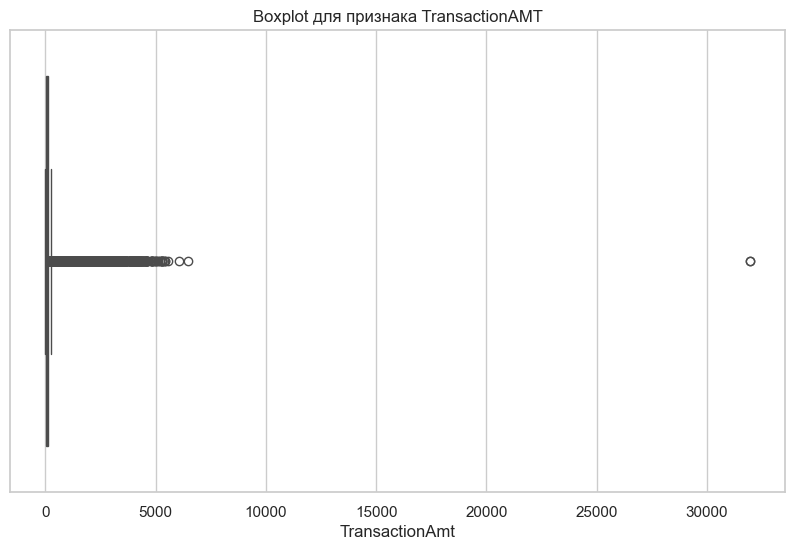

Границы для выбросов: -79.20 - 247.52
Число выбросов в TransactionAmt: 66482
    TransactionAmt  isFraud
7           422.50        0
31          363.89        0
41          774.00        0
56          500.00        0
58          380.21        0


In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Построим boxplot для анализа выбросов в TransactionAMT
plt.figure(figsize=(10, 6))
sns.boxplot(x=train['TransactionAmt'])
plt.title('Boxplot для признака TransactionAMT')
plt.show()

# Рассчитаем статистику для выявления выбросов
q1 = train['TransactionAmt'].quantile(0.25)  # 25-й перцентиль
q3 = train['TransactionAmt'].quantile(0.75)  # 75-й перцентиль
iqr = q3 - q1  # Интерквартильный размах

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

print(f"Границы для выбросов: {lower_bound:.2f} - {upper_bound:.2f}")

# Выбросы — это значения, которые лежат за пределами этих границ
outliers = train[(train['TransactionAmt'] < lower_bound) | (train['TransactionAmt'] > upper_bound)]
print(f"Число выбросов в TransactionAmt: {outliers.shape[0]}")
print(outliers[['TransactionAmt', 'isFraud']].head())


### Что делать с выбросами:

#### 1 Понимание контекста данных:


Сначала нужно проанализировать, не являются ли эти выбросы важными. Например, большие транзакции могут быть связаны с мошенничеством, и важно определить, как они коррелируют с целевой переменной isFraud. Для этого можно исследовать, какой процент мошенничеств происходит среди этих выбросов.

In [42]:
# Анализируем выбросы по классу isFraud
outliers_fraud = outliers['isFraud'].value_counts(normalize=True)
print(f"Распределение классов среди выбросов: {outliers_fraud}")


Распределение классов среди выбросов: isFraud
0    0.94928
1    0.05072
Name: proportion, dtype: float64


#### 2 Визуализация выбросов

Построим график, который покажет, как выбросы соотносятся с транзакциями. Это поможет понять, стоит ли их удалять или оставлять.

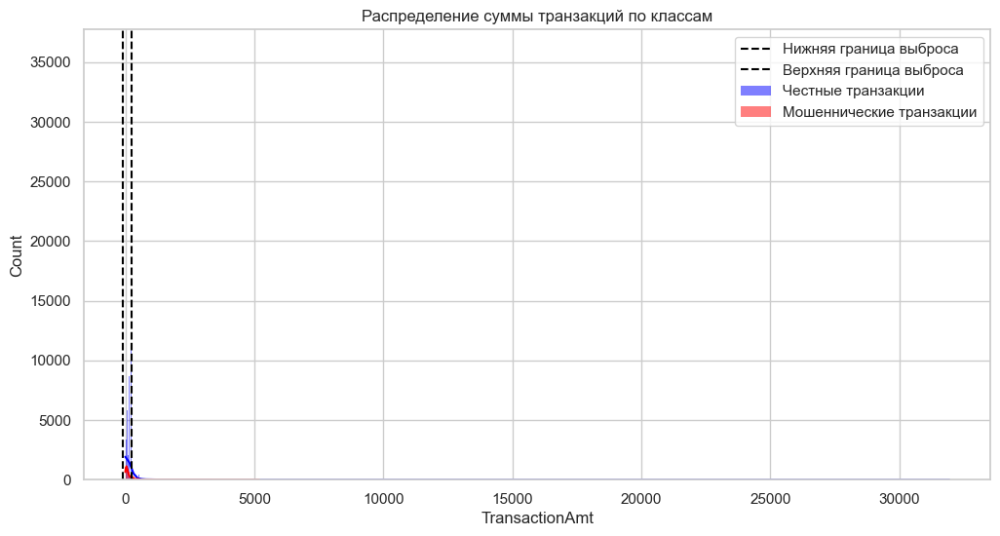

In [43]:
# Визуализация выбросов на графике
plt.figure(figsize=(12, 6))
sns.histplot(train[train['isFraud'] == 0]['TransactionAmt'], kde=True, color='blue', label='Честные транзакции')
sns.histplot(train[train['isFraud'] == 1]['TransactionAmt'], kde=True, color='red', label='Мошеннические транзакции')
plt.axvline(x=lower_bound, color='black', linestyle='--', label='Нижняя граница выброса')
plt.axvline(x=upper_bound, color='black', linestyle='--', label='Верхняя граница выброса')
plt.legend()
plt.title('Распределение суммы транзакций по классам')
plt.show()


Распределение классов среди выбросов показывает, что **только 5.07%** выбросов — это мошенничество (**`isFraud = 1`**), в то время как большинство выбросов (94.93%) приходится на честные транзакции (**`isFraud = 0`**).

### Выводы:

1. **Мошенничество среди выбросов**:
   - Это относительно небольшая доля. Это может означать, что выбросы, скорее всего, представляют собой редкие или экстраординарные транзакции, которые не обязательно связаны с мошенничеством. Возможно, это крупные, но не мошеннические транзакции.

2. **Что с этим делать**:
   - Поскольку мошенничество среди выбросов — это небольшая доля, можно рассматривать два подхода:
     - **Удалить выбросы**: Если выбросы действительно ошибочные или экстремальные, можно их удалить, так как они составляют меньшую часть данных.
     - **Оставить выбросы**: Поскольку они не столь сильно влияют на класс мошенничества, можно оставить их в данных, если они не слишком искажают общую картину.

В случае, если выбросы оставляем, то можно **применить трансформации**, такие как логарифмическое преобразование или бинирование.

Для **антифродовой задачи** (предсказания мошенничества), важным фактором является правильная обработка признаков, таких как сумма транзакции, чтобы модель могла эффективно различать мошеннические и честные транзакции, особенно когда суммы могут сильно варьироваться.


Для антифродовой задачи начнем с **логарифмирования**, так как это позволит модели учитывать широкий диапазон транзакций (включая большие суммы, которые могут быть мошенническими), не теряя важную информацию. Но и применим **бинирование** как дополнительный шаг для анализа и для улучшения интерпретируемости модели.


In [172]:
import numpy as np

# Преобразование столбца TransactionAMT
df_modified['log_TransactionAmt'] = np.log1p(df_modified['TransactionAmt'])

In [173]:

bins = [0, 100, 1000, 5000, 10000, np.inf]
labels = ['Low', 'Medium', 'High', 'Very High', 'Extremely High']

df_modified['TransactionAmt_binned'] = pd.cut(df_modified['TransactionAmt'], bins=bins, labels=labels)

# Альтернативный способ:  Биннинг суммы транзакции по квантилям
#train['TransactionAmt_bin'] = pd.qcut(train['TransactionAmt'], q=10, duplicates='drop')


#### Добавление признака выброса

Чтобы модель могла учитывать выбросы и их связь с мошенничеством, можно добавить новый признак, который будет отмечать, является ли транзакция выбросом.

In [174]:
df_modified['isOutlier'] = ((train['TransactionAmt'] < lower_bound) | (train['TransactionAmt'] > upper_bound)).astype(int)

Это поможет модели явно учитывать, что транзакция относится к выбросам, что может быть полезно для предсказания мошенничества.

In [175]:
df_modified[['TransactionAmt', 'log_TransactionAmt', 'TransactionAmt_binned']].describe()

,TransactionAmt,log_TransactionAmt
count,395677.000000,395677.000000
mean,132.255826,4.350518
std,240.355221,0.955018
min,0.251000,0.223943
25%,40.000000,3.713572
50%,67.950000,4.233382
75%,124.762000,4.834391
max,31937.391000,10.371564


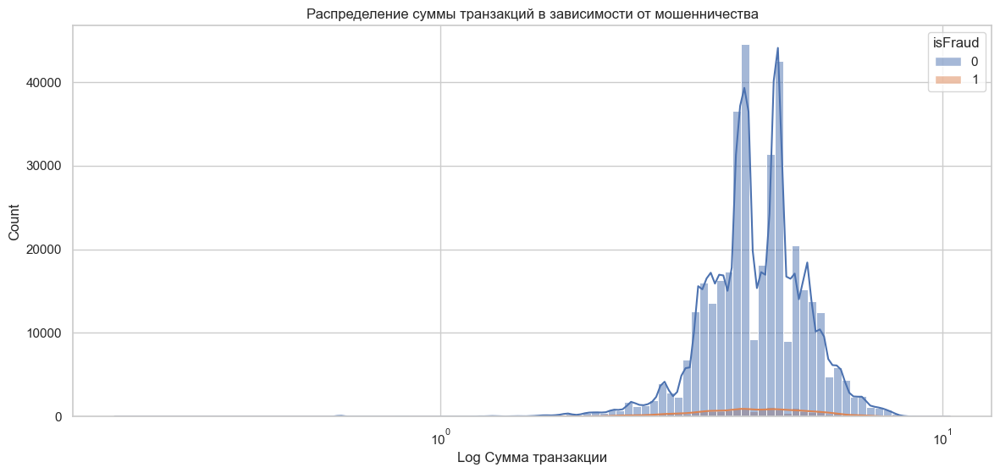

In [176]:
# Распределение сумм транзакций
plt.figure(figsize=(14,6))
sns.histplot(data=df_modified, x='log_TransactionAmt', hue='isFraud', bins=100, log_scale=True, kde=True)
plt.title('Распределение суммы транзакций в зависимости от мошенничества')
plt.xlabel('Log Сумма транзакции')
plt.show()


## Отбор признаков

## 1. Возьмем все признаки

Для начала попробует взять все признаки с минимальной обработкой для обучения базовых моделей.

## 2. **Минимальная обработка признаков**
- Для числовых — оставим как есть или логарифмируем.
- Для категориальных — **Label Encoding** или **One-Hot Encoding**.
- **Без сложных** feature engineering.

Идея baseline:  
> "Проверить, возможно ли получить приемлемое качество на существующем датасете без сложной обработки."

## 3. **Строим baseline модель**
Типичная связка:
- Модель: `LightGBM`, `CatBoost`, `XGBoost`, `LogisticRegression`, `RandomForest`.
- Потери: **LogLoss**, **AUC ROC**.

Просто запускаем без оптимизаций. Смотрим, **какое качество вообще возможно без ухищрений**.

# 🧠 Главное правило baseline:
> Сделать настолько простую модель, чтобы потом точно видеть — где улучшения работают.

In [ ]:
#base_columns = [
#    'isFraud',
#    'log_TransactionAmt',
#    'TransactionAmt_binned',
#    'ProductCD',
#    'card4',
#    'card6',
#    'Transaction_hour', 
#    'Transaction_weekday',
#    'P_emaildomain',
#    #'DeviceType',
#    #'DeviceInfo'
#]

#df_modified[base_columns].head()

,isFraud,log_TransactionAmt,TransactionAmt_binned,ProductCD,card4,card6,Transaction_hour,Transaction_weekday,P_emaildomain
2,0,4.094345,Low,W,visa,debit,0,0,outlook.com
4,0,3.931826,Low,H,mastercard,credit,0,0,gmail.com
5,0,3.912023,Low,W,visa,debit,0,0,gmail.com
6,0,5.075174,Medium,W,visa,debit,0,0,yahoo.com
8,0,2.772589,Low,H,visa,debit,0,0,anonymous.com


In [191]:
from sklearn.calibration import LabelEncoder
from sklearn.preprocessing import StandardScaler

#numeric_features = ['log_TransactionAmt', 'Transaction_hour', 'Transaction_weekday']
#categorical_features = ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'DeviceType', 'DeviceInfo']

# Числовые и категориальные признаки
numeric_features = df_modified.select_dtypes(include=['number']).columns
categorical_features = df_modified.select_dtypes(include=['object', 'category']).columns

base_train = df_modified.copy()



# Легкая предобработка
for col in categorical_features:
    #base_train[col] = base_train[col].fillna('unknown')
    base_train[col] = base_train[col].astype(str)
    le = LabelEncoder()
    base_train[col] = le.fit_transform(base_train[col])



# 2. Обработка числовых признаков (заполнение пропусков медианой)
#scaler = StandardScaler()
#base_train[numeric_features] = scaler.fit_transform(base_train[numeric_features])


base_train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V319,V320,V321,Relative_TransactionDT,Transaction_day,Transaction_hour,Transaction_weekday,log_TransactionAmt,TransactionAmt_binned,isOutlier
2,2987002,0,86469,59.0,4,8721,389,41,4,58,...,0.0,0.0,0.0,0,0,0,0,4.094345,2,0
4,2987004,0,86506,50.0,1,8608,413,41,2,2,...,0.0,0.0,0.0,37,0,0,0,3.931826,2,0
5,2987005,0,86510,49.0,4,9617,454,41,4,106,...,0.0,0.0,0.0,41,0,0,0,3.912023,2,0
6,2987006,0,86522,159.0,4,1860,259,41,4,58,...,0.0,0.0,0.0,53,0,0,0,5.075174,3,0
8,2987008,0,86535,15.0,1,7405,0,41,4,106,...,0.0,0.0,0.0,66,0,0,0,2.772589,2,0


In [192]:
# Простая модель
#X = base_train[numeric_features + categorical_features]
X = base_train.drop(labels=['TransactionID', 'TransactionDT', 'Relative_TransactionDT', 'TransactionAmt', 'isOutlier',  'isFraud'], axis=1)
y = base_train['isFraud']

1. **Разделим данные на обучение и валидацию.**
   - Если это транзакции во времени (как в фроде) — разбиение должно быть аккуратным, **без перемешивания**.
   - Иначе — стандартное `train_test_split`.

In [193]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, shuffle=False
)

### LogisticRegression

In [194]:
y_train.head()

2    0
4    0
5    0
6    0
8    0
Name: isFraud, dtype: int64

In [195]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

LogisticRegression(random_state=42)

Recall: 0.0148
ROC-AUC: 0.6914
PR-AUC: 0.0777


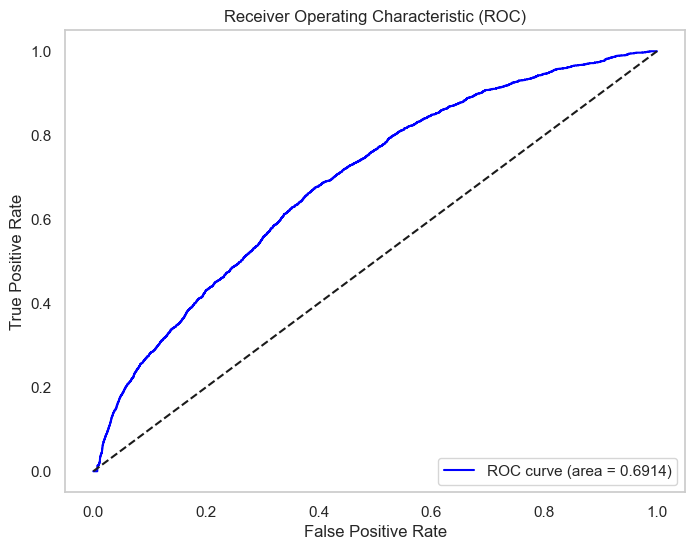

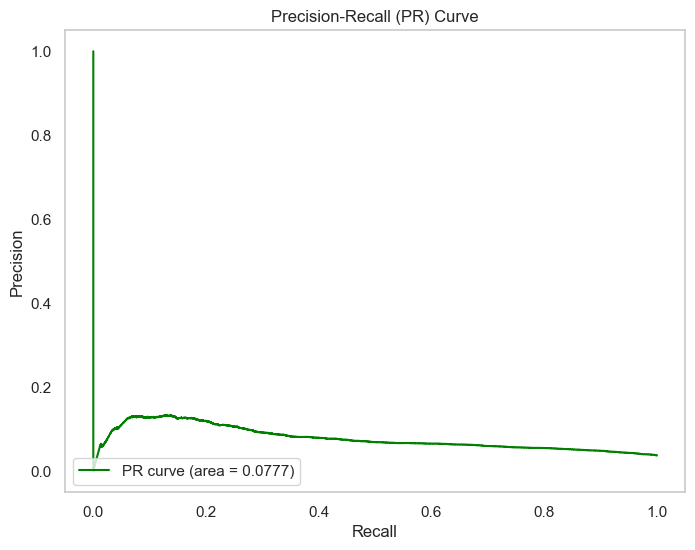

In [196]:
eval(model, X_val, y_val)

### Анализ метрик и графиков базовой модели LogisticRegression

#### Метрики

1. **Recall (Полнота): 0.0148**
   - Низкое значение полноты указывает на то, что модель обнаруживает лишь небольшую долю истинных положительных классов. Это может означать, что многие случаи остаются недетектированными.

2. **ROC-AUC: 0.6914**
   - Значение выше 0.5, но близкое к нему, что говорит о базовой способности модели различать классы. Однако это можно улучшить.

3. **PR-AUC: 0.0777**
   - Низкое значение PR-AUC указывает на ограниченную точность модели в условиях дисбаланса классов. Модель плохо справляется с обнаружением положительных примеров.

#### ROC-кривая

- Кривая показывает, что модель имеет лучшую производительность, чем случайная, но остаётся достаточно посредственной.
- Пространство между кривой и диагональной линией "случайного угадывания" небольошое, что указывает на необходимость улучшения модели.

#### PR-кривая

- PR-кривая лежит близко к осям, подтверждая низкую точность в условиях низкой полноты.
- Модель сталкивается с проблемами в задачах, где положительные наблюдения редки или распределены неравномерно.

### Как можно улучшенить

1. **Улучшение выборки:**
   - Рассмотреть методы корректировки дисбаланса классов, такие как oversampling или undersampling.

2. **Тюнинг модели:**
   - Провести настройку гиперпараметров модели с использованием поиска по сетке или байесовской оптимизации.

3. **Сложные модели:**
   - Попробовать более сложные модели, такие как Random Forest, Gradient Boosting или нейронные сети.

4. **Добавление признаков:**
   - Исследовать возможность создания и добавления новых признаков, которые могут повысить объяснительную силу модели.

### RandomForest

In [197]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [203]:
# Получение важности признаков
importances = model.feature_importances_

# Создание списка признаков с их важностями
feature_names = X_train.columns  # или просто список имен признаков
important_features = list(zip(feature_names, importances))

# Сортировка по важности
important_features.sort(key=lambda x: x[1], reverse=True)

# Отображение наиболее важных признаков
for feature in important_features:
    print(f"Feature: {feature[0]}, Importance: {feature[1]}")

Feature: C1, Importance: 0.05856310041689767
Feature: C13, Importance: 0.04780146907063546
Feature: V45, Importance: 0.04411818801568855
Feature: C14, Importance: 0.037119972530284755
Feature: C2, Importance: 0.03238291569351852
Feature: C11, Importance: 0.03035788261152578
Feature: V44, Importance: 0.029865468807557655
Feature: C7, Importance: 0.029410751589362953
Feature: C4, Importance: 0.029068463569802673
Feature: C12, Importance: 0.02813239178986382
Feature: V87, Importance: 0.028070224767019886
Feature: C8, Importance: 0.0247974710106052
Feature: C10, Importance: 0.02149738857745485
Feature: V86, Importance: 0.01982975335361088
Feature: Transaction_day, Importance: 0.019713168139596598
Feature: card2, Importance: 0.01936677109355739
Feature: C6, Importance: 0.018878992548230868
Feature: log_TransactionAmt, Importance: 0.016338740522504936
Feature: card1, Importance: 0.016131734519022237
Feature: D1, Importance: 0.011692192094241018
Feature: P_emaildomain, Importance: 0.011489515

Recall: 0.3581
ROC-AUC: 0.8946
PR-AUC: 0.5084


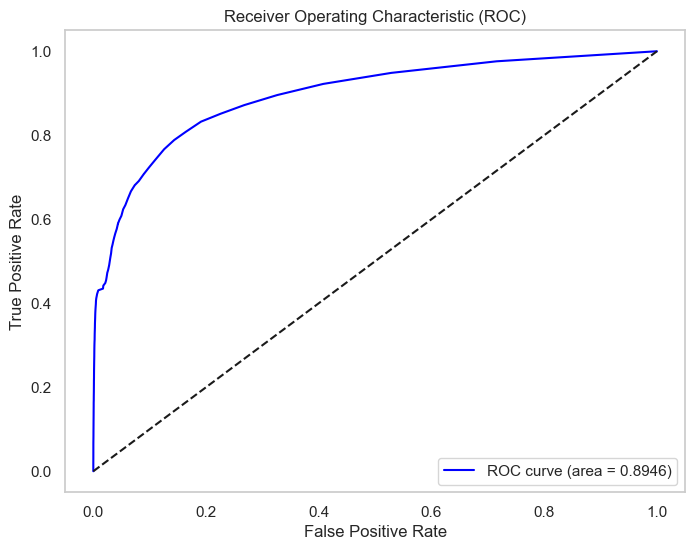

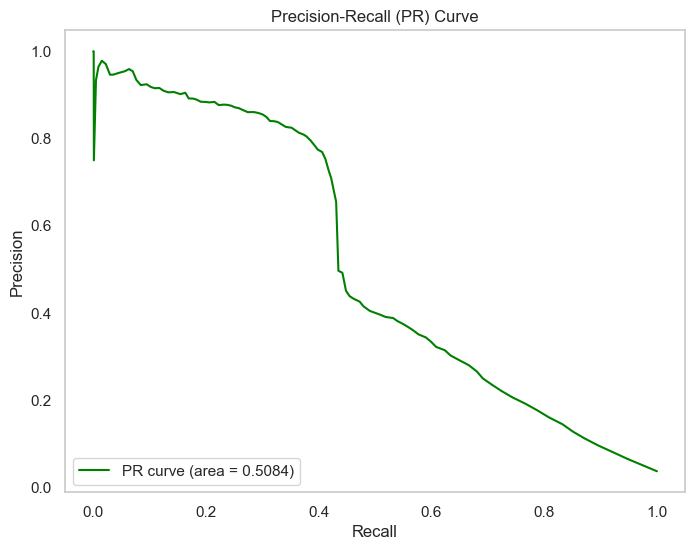

In [198]:
eval(model, X_val, y_val)

### Анализ метрик и графиков базовой модели RandomForestClassifier

#### Метрики

1. **Recall (Полнота): 0.3581**
   - Сравнительно высокое значение полноты указывает на способность модели обнаруживать значительное количество истинных положительных классов по сравнению с предыдущей моделью.

2. **ROC-AUC: 0.8946**
   - Высокое значение ROC-AUC демонстрирует хорошую способность модели различать классы. Это показывает, что модель справляется с задачей лучше, чем просто случайное угадывание.

3. **PR-AUC: 0.5084**
   - Значение PR-AUC выше, чем у LogisticRegression, указывая на лучшую точность в задачах с дисбалансом классов.

#### ROC-кривая

- ROC-кривая сильно выгнута вверх, подтверждая высокую точность модели в различении классов.
- Модель демонстрирует хороший баланс между чувствительностью (True Positive Rate) и специфичностью (False Positive Rate).

#### PR-кривая

- Кривая выше и более плавная, чем у LogisticRegression, указывая на лучшее качество работы модели в условиях дисбаланса.
- Сохранение относительно высокого уровня precision при увеличении recall показывает эффективность модели.

### Как можно улучшенить

1. **Тюнинг гиперпараметров:**
   - Оптимизация параметров модели (например, количество деревьев, глубина) может ещё больше улучшить производительность.

2. **Учет важности признаков:**
   - Провести анализ важности признаков, чтобы понять, какие из них оказывают большее влияние, и подумать о возможном добавлении новых.

3. **Тюнинг порога:**
   - Рассмотреть возможность изменения порога вероятности для повышения полноты или точности в зависимости от цели задачи.

4. **Увеличение данных:**
   - Если возможно, расширение объема данных может улучшить обучение модели.

### Поиск наилучших гиперпараметров

In [199]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.metrics import roc_auc_score

# Сортируем данные по времени
#train = train.sort_values('TransactionDT')

#X = train.drop(columns=['isFraud'])
#y = train['isFraud']

# TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

def objective(trial):
    # Параметры Random Forest
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),  # исправлено
        'random_state': 42,
        'n_jobs': -1,
    }
    
    # Создаём модель
    model = RandomForestClassifier(**params)
    
    # Кросс-валидация по времени
    scores = cross_val_score(model, X_train, y_train, cv=tscv, scoring='roc_auc')
    
    # Оптимизируем среднее значение ROC AUC
    return scores.mean()

# Оптимизация
sampler = optuna.samplers.TPESampler(seed=42)  # Используем seed для воспроизводимости
study = optuna.create_study(direction='maximize', sampler=sampler)
study.optimize(objective, n_trials=50)

print('Лучшие параметры:', study.best_params)


[I 2025-04-29 20:14:56,705] A new study created in memory with name: no-name-1de50815-c3ae-450b-bb2e-dc21eb31d8ad
[I 2025-04-29 20:16:00,439] Trial 0 finished with value: 0.9004456133598943 and parameters: {'n_estimators': 437, 'max_depth': 20, 'min_samples_split': 15, 'min_samples_leaf': 12, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9004456133598943.
[I 2025-04-29 20:16:13,692] Trial 1 finished with value: 0.8936370756603594 and parameters: {'n_estimators': 152, 'max_depth': 18, 'min_samples_split': 13, 'min_samples_leaf': 15, 'max_features': 'log2'}. Best is trial 0 with value: 0.9004456133598943.
[I 2025-04-29 20:16:40,475] Trial 2 finished with value: 0.8656330456062387 and parameters: {'n_estimators': 850, 'max_depth': 6, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2'}. Best is trial 0 with value: 0.9004456133598943.
[I 2025-04-29 20:16:59,869] Trial 3 finished with value: 0.8764731044985415 and parameters: {'n_estimators': 489, 'max_depth': 8, 

Лучшие параметры: {'n_estimators': 821, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}


In [200]:

#params = {'n_estimators': 801, 'max_depth': 12, 'min_samples_split': 17, 'min_samples_leaf': 11, 'max_features': 'log2', 'random_state': 42}
#params = {'n_estimators': 538, 'max_depth': 12, 'min_samples_split': 4, 'min_samples_leaf': 19, 'max_features': 'sqrt', 'random_state': 42}
params = {'n_estimators': 895, 'max_depth': 12, 'min_samples_split': 20, 'min_samples_leaf': 13, 'max_features': 'sqrt'}
params = {'n_estimators': 821, 'max_depth': 19, 'min_samples_split': 9, 'min_samples_leaf': 5, 'max_features': 'sqrt'}
model = RandomForestClassifier(**params)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=19, min_samples_leaf=5, min_samples_split=9,
                       n_estimators=821)

In [202]:
# Получение важности признаков
importances = model.feature_importances_

# Создание списка признаков с их важностями
feature_names = X_train.columns  # или просто список имен признаков
important_features = list(zip(feature_names, importances))

# Сортировка по важности
important_features.sort(key=lambda x: x[1], reverse=True)

# Отображение наиболее важных признаков
for feature in important_features:
    print(f"Feature: {feature[0]}, Importance: {feature[1]}")

Feature: C1, Importance: 0.05856310041689767
Feature: C13, Importance: 0.04780146907063546
Feature: V45, Importance: 0.04411818801568855
Feature: C14, Importance: 0.037119972530284755
Feature: C2, Importance: 0.03238291569351852
Feature: C11, Importance: 0.03035788261152578
Feature: V44, Importance: 0.029865468807557655
Feature: C7, Importance: 0.029410751589362953
Feature: C4, Importance: 0.029068463569802673
Feature: C12, Importance: 0.02813239178986382
Feature: V87, Importance: 0.028070224767019886
Feature: C8, Importance: 0.0247974710106052
Feature: C10, Importance: 0.02149738857745485
Feature: V86, Importance: 0.01982975335361088
Feature: Transaction_day, Importance: 0.019713168139596598
Feature: card2, Importance: 0.01936677109355739
Feature: C6, Importance: 0.018878992548230868
Feature: log_TransactionAmt, Importance: 0.016338740522504936
Feature: card1, Importance: 0.016131734519022237
Feature: D1, Importance: 0.011692192094241018
Feature: P_emaildomain, Importance: 0.011489515

Список важности признаков в модели `RandomForestClassifier` показывает, какие признаки наиболее влияют на точность модели. Основные выводы:

1. **Наиболее важные признаки:**
   - Признаки типа `C1`, `C13`, `V45` и другие в начале списка имеют наибольшую важность. Они оказывают значительное влияние на предсказания модели и могут быть ключевыми факторами в анализе.

2. **Средняя важность:**
   - Признаки, такие как `log_TransactionAmt`, `D1`, и `P_emaildomain`, также вносят свой вклад, но в меньшей степени. Их можно рассматривать как вспомогательные для улучшения результатов модели.

3. **Мало важные признаки:**
   - Признаки внизу списка, такие как `V121`, `V117`, и `V305`, могут быть практически незначимыми. Их можно рассмотреть для исключения из модели, чтобы упростить её и уменьшить вычислительную нагрузку.

4. **Использование полученной информации:**
   - Основываясь на этом анализе, можно улучшать модель, фокусируясь на наиболее важных признаках.
   - Исключение малозначимых признаков может упростить модель без значительной потери качества.

Recall: 0.3225
ROC-AUC: 0.8955
PR-AUC: 0.4875


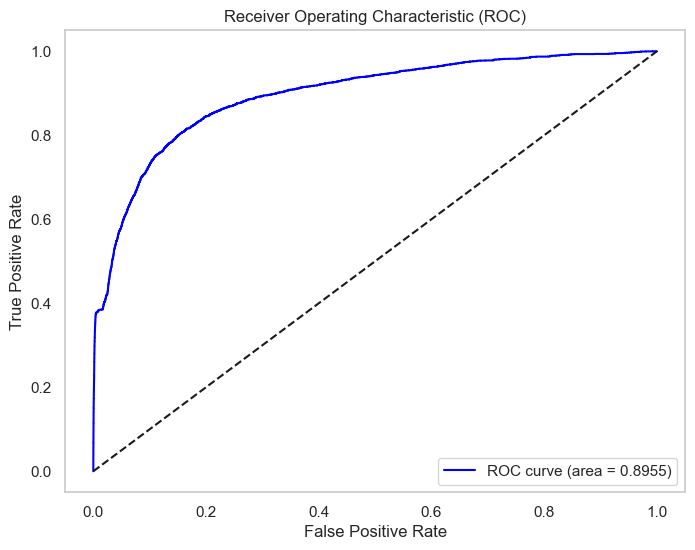

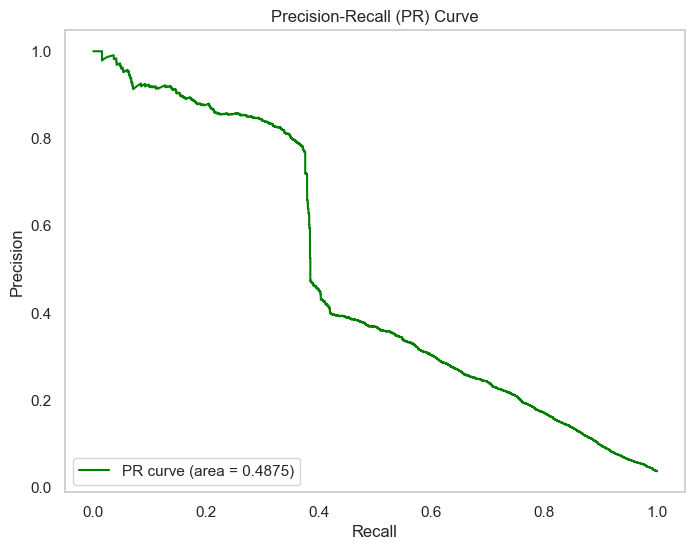

In [201]:
eval(model, X_val, y_val)

### Анализ метрик и графиков модели RandomForestClassifier с оптимизированными гиперпараметрами

#### Метрики

1. **Recall (Полнота): 0.3225**
   - Полнота уменьшилась по сравнению с предыдущей моделью, что может говорить о компромиссе между полнотой и другими метриками.

2. **ROC-AUC: 0.8955**
   - ROC-AUC немного улучшился, указывая на высокую способность модели различать классы.

3. **PR-AUC: 0.4875**
   - Показатель PR-AUC снизился, что может свидетельствовать о том, что точность или полнота выбраны как приоритет в ущерб другой метрике.

#### ROC-кривая

- ROC-кривая сохраняет высокую выгнутость вверх, указывающую на высокую специфичность модели.
- Работа модели близка к оптимальному с точки зрения баланса между ложноположительными и истинноположительными откликами.

#### PR-кривая

- PR-кривая показывает снижение точности при увеличении полноты, отражая сложность задачи с дисбалансом классов.
- Падение точности при увеличении полноты может быть вызвано компромиссами в гиперпараметрах.

### Как можно улучшенить

1. **Совместное исследование метрик:**
   - Если возможно, вернуться к процессу настройки гиперпараметров для нахождения баланса между всеми метриками.

2. **Ансамблевые методы:**
   - Рассмотреть использование ансамблей, таких как Bagging или Boosting, для улучшения результатов.

3. **Тюнинг порога:**
   - Рассмотреть возможность изменения порога вероятности для повышения полноты или точности в зависимости от цели задачи.

4. **Увеличение данных:**
   - Если возможно, расширение объема данных может улучшить обучение модели.

# Выводы

### Таблица с метриками

| Модель                                 | Recall | ROC-AUC | PR-AUC |
|----------------------------------------|--------|---------|--------|
| LogisticRegression                     | 0.0148 | 0.6914  | 0.0777 |
| RandomForestClassifier (базовый)       | 0.3581 | 0.8946  | 0.5084 |
| RandomForestClassifier (оптимизирован)| 0.3225 | 0.8955  | 0.4875 |

### Общий вывод

1. **LogisticRegression:**
   - Показала низкую полноту и PR-AUC, что говорит о недостаточной способности модели справляться с задачей классификации, возможно, из-за простоты модели и дисбаланса классов.

2. **RandomForestClassifier (базовый):**
   - Заметное улучшение всех метрик по сравнению с LogisticRegression. Высокий ROC-AUC и приемлемый PR-AUC указывают на хорошую способность модели различать классы.

3. **RandomForestClassifier (оптимизирован):**
   - Не смотря на небольшое снижение полноты и PR-AUC, наблюдается повышение ROC-AUC. Возможно, усилия по тюнингу гиперпараметров немного снизили способности модели находить все положительные классы ради повышения общей способности различать классы.

### Как можно улучшить

- **Баланс метрик:** Нужно искать компромисс, который наилучшим образом соответствует задачам бизнеса (например, высокая полнота или точность).
- **Тюнинг и расширение:** Продолжить настройку гиперпараметров и рассмотреть возможность использования других, более сложных моделей или ансамблевых методов.
- **Анализ данных:** Изучить возможности расширения и улучшения данных, чтобы повысить качество модели.